# **2. Análisis Exploratorio de Datos**

## **2.1. Librerias**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import missingno as msno
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
import geopandas as gpd
from libpysal.weights import Queen
from esda.moran import Moran_Local
from splot.esda import moran_scatterplot, lisa_cluster
from splot.esda import lisa_cluster
from esda.moran import Moran
import warnings
import json
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
import matplotlib as mpl
from statsmodels.tsa.stattools import ccf
import plotly.io as pio
pio.renderers.default = "notebook_connected"

## **2.2. Funciones**

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_series_covariable(
    serie,
    departamentos,
    covariable,
    fecha_col="fecha_inicio",
    incidencia_col="incidencia",
    figsize=(24, 20),
    titulo_general=None,
    color_incidencia="#D62728",
    color_covariable="#176BCB"
):

    plt.style.use("seaborn-v0_8-whitegrid")

    sns.set_context(
        "talk",
        font_scale=0.9
    )

    fig, axes = plt.subplots(
        len(departamentos),
        1,
        figsize=figsize,
        sharex=True
    )

    if len(departamentos) == 1:
        axes = [axes]

    print("\n=== VERIFICACIÓN DE DATOS ===")

    for i, depto in enumerate(departamentos):

        tmp = serie[
            serie["departamento"] == depto
        ].copy()

        print(
            f"{depto}: {len(tmp)} registros"
        )

        if len(tmp) == 0:
            axes[i].text(
                0.5,
                0.5,
                f"Sin datos para\n{depto}",
                ha="center",
                va="center",
                fontsize=16,
                transform=axes[i].transAxes
            )

            axes[i].set_title(
                depto,
                fontsize=16,
                fontweight="bold"
            )

            continue

        ax1 = axes[i]

        ax1.plot(
            tmp[fecha_col],
            tmp[incidencia_col],
            color=color_incidencia,
            linewidth=2.5,
            label="Incidencia"
        )

        ax1.set_ylabel(
            "Incidencia",
            color=color_incidencia,
            fontsize=12
        )

        ax1.tick_params(
            axis="y",
            labelcolor=color_incidencia
        )

        ax2 = ax1.twinx()

        ax2.plot(
            tmp[fecha_col],
            tmp[covariable],
            color=color_covariable,
            linewidth=2,
            alpha=0.7,
            linestyle="--",
            label=covariable.capitalize()
        )

        ax2.set_ylabel(
            covariable.capitalize(),
            color=color_covariable,
            fontsize=12
        )

        ax2.tick_params(
            axis="y",
            labelcolor=color_covariable
        )

        ax1.set_title(
            depto,
            fontsize=16,
            fontweight="bold"
        )

        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()

        ax1.legend(
            lines1 + lines2,
            labels1 + labels2,
            loc="upper right"
        )

    if titulo_general is None:
        titulo_general = (
            f"Series Temporales de Incidencia y {covariable.capitalize()}\n"
            "(2012–2024)"
        )

    plt.suptitle(
        titulo_general,
        fontsize=24,
        fontweight="bold",
        y=0.995
    )

    plt.xlabel(
        "Fecha",
        fontsize=14
    )

    plt.tight_layout()
    plt.show()

In [3]:
def graficar_incidencia_y_covariable(df, ano_objetivo, variable_climatica, label_clima="Covariable Climática", color_clima="#1976D2"):

    df_filtrado = df[df["ano"] == ano_objetivo].copy()
    
    if df_filtrado.empty:
        raise ValueError(f"El año {ano_objetivo} no se encuentra en el DataFrame.")
        
    df_temporal = df_filtrado.groupby("semana")[["incidencia", variable_climatica]].mean().reset_index()

    fig, ax1 = plt.subplots(figsize=(15, 6))
    
    color_incidencia = "#2FA2D3"
    linea1 = ax1.plot(
        df_temporal["semana"], df_temporal["incidencia"],
        color=color_incidencia, linewidth=2.5, marker="o", markersize=4,
        label="Incidencia Dengue"
    )
    ax1.fill_between(df_temporal["semana"], df_temporal["incidencia"], color=color_incidencia, alpha=0.1)
    
    ax1.set_xlabel("Semana Epidemiológica", fontsize=11, fontweight="bold", labelpad=10)
    ax1.set_ylabel("Incidencia Promedio (Casos por 100.000 hab)", color=color_incidencia, fontsize=11, fontweight="bold", labelpad=10)
    ax1.tick_params(axis='y', labelcolor=color_incidencia)
    ax1.grid(True, linestyle=":", alpha=0.5)

    ax2 = ax1.twinx()  
    
    linea2 = ax2.plot(
        df_temporal["semana"], df_temporal[variable_climatica],
        color=color_clima, linewidth=2, linestyle="--", marker="s", markersize=4,
        label=label_clima
    )
    
    ax2.set_ylabel(label_clima, color=color_clima, fontsize=11, fontweight="bold", labelpad=10)
    ax2.tick_params(axis='y', labelcolor=color_clima)

    lineas_totales = linea1 + linea2
    labels_totales = [l.get_label() for l in lineas_totales]
    ax1.legend(lineas_totales, labels_totales, loc="upper left", fontsize=10, frameon=True, facecolor="white", edgecolor="none")

    plt.title(f"Análisis Comparativo Temporal: Incidencia de Dengue vs. {label_clima} (Año {ano_objetivo})", 
              fontsize=14, fontweight="bold", pad=20)
    
    ax1.set_xticks(np.arange(1, 53, 2))
    ax1.set_xlim(0.5, 52.5)
    
    fig.tight_layout()
    plt.show()

In [4]:
def graficar_incidencia_vs_covariable(df_datos, dpto_cnmbrs_lista, ano_objetivo, covariable_clima, lag_semanas=0, col_departamento="departamento"):
    df_ano = df_datos[df_datos["ano"] == ano_objetivo].copy()
    df_ano[col_departamento] = df_ano[col_departamento].astype(str).str.upper().str.strip()
    deptos_target = [str(d).upper().strip() for d in departamentos_lista]
    
    df_filtrado = df_ano[df_ano[col_departamento].isin(deptos_target)]
    
    if df_filtrado.empty:
        print(f"No se encontraron registros para los departamentos especificados en el año {ano_objetivo}.")
        return

    config_clima = {
        "temp_c": {"color": "#FF5722", "label": f"Temperatura °C (Lag {lag_semanas})", "style": "--s"},
        "precipitacion": {"color": "#3F51B5", "label": f"Precipitación mm (Lag {lag_semanas})", "style": "--d"},
        "humedad_relativa": {"color": "#1A237E", "label": f"Humedad Relativa % (Lag {lag_semanas})", "style": "--o"}
    }
    
    c_info = config_clima.get(covariable_clima, {"color": "#E65100", "label": f"{covariable_clima} (Lag {lag_semanas})", "style": "--s"})

    azul_linea = "#1565C0"
    azul_area = "#E3F2FD"
    grid_color = "#ECEFF1"

    n_deptos = len(deptos_target)
    fig, axes = plt.subplots(n_deptos, 1, figsize=(13, 3.8 * n_deptos), sharex=True)
    
    if n_deptos == 1:
        axes = [axes]

    for i, depto in enumerate(deptos_target):
        ax_dengue = axes[i]
        
        data_depto = df_filtrado[df_filtrado[col_departamento] == depto].sort_values("semana").copy()
        data_depto["clima_lag"] = data_depto[covariable_clima].shift(lag_semanas)
        
        if data_depto.empty:
            ax_dengue.text(0.5, 0.5, f"Sin datos para {depto}", ha='center', va='center', color='gray')
            ax_dengue.set_title(depto, fontsize=12, fontweight="bold", loc="left")
            continue
            
        linea_den = ax_dengue.plot(data_depto["semana"], data_depto["incidencia"], 
                                   color=azul_linea, linewidth=2.0, label="Incidencia Dengue")
        ax_dengue.fill_between(data_depto["semana"], data_depto["incidencia"], 
                               color=azul_area, alpha=0.6)
        
        ax_dengue.set_ylim(bottom=0)
        ax_dengue.set_ylabel("Incidencia Promedio\n(Casos por 100.000 hab)", fontsize=9, color=azul_linea, fontweight="bold")
        ax_dengue.tick_params(axis='y', colors=azul_linea, labelsize=9)
        ax_dengue.grid(True, linestyle="--", alpha=0.5, color=grid_color)
        
        ax_clima = ax_dengue.twinx()
        linea_cli = ax_clima.plot(data_depto["semana"], data_depto["clima_lag"], 
                                   c_info["style"], color=c_info["color"], linewidth=1.5, 
                                   markersize=4, alpha=0.85, label=c_info["label"])
        
        ax_clima.set_ylabel(c_info["label"], fontsize=9, color=c_info["color"], fontweight="bold")
        ax_clima.tick_params(axis='y', colors=c_info["color"], labelsize=9)
        
        ax_dengue.set_title(f"Departamento: {depto}", fontsize=12, fontweight="bold", loc="left", pad=8, color="#263238")
        
        for ax in [ax_dengue, ax_clima]:
            for spine in ["top"]:
                ax.spines[spine].set_visible(False)
            ax.spines["left"].set_color("#CFD8DC")
            ax.spines["right"].set_color("#CFD8DC")
            ax.spines["bottom"].set_color("#CFD8DC")

    axes[-1].set_xlabel("Semana Epidemiológica", fontsize=11, fontweight="bold", labelpad=10, color="#263238")
    axes[-1].set_xlim(1, 52)
    axes[-1].set_xticks(range(1, 53, 4))
    
    plt.suptitle(f"Análisis Comparativo Temporal por Departamentos Focalizados — Año {ano_objetivo}\nIncidencia de Dengue vs. {c_info['label']}", 
                 fontsize=14, fontweight="bold", color="#212121", y=0.99)
    
    plt.subplots_adjust(hspace=0.4)
    plt.show()

In [5]:
def mapas_covariables(
    df,
    year,
    shapefile_path,
    col_depto_df="departamento",
    col_depto_shape="dpto_cnmbr"
):
    df_year = df[df["ano"] == year].copy()

    resumen = (
        df_year
        .groupby(col_depto_df)[
            ["precipitacion", "humedad_relativa", "temp_c"]
        ]
        .mean()
        .reset_index()
    )
    
    gdf = gpd.read_file(shapefile_path)

    resumen[col_depto_df] = (
        resumen[col_depto_df]
        .str.upper()
        .str.strip()
    )

    gdf[col_depto_shape] = (
        gdf[col_depto_shape]
        .str.upper()
        .str.strip()
    )

    mapa = gdf.merge(
        resumen,
        left_on=col_depto_shape,
        right_on=col_depto_df,
        how="left"
    )

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(24, 10)
    )

    mapa.plot(
        column="precipitacion",
        cmap="Blues",
        linewidth=0.5,
        edgecolor="black",
        legend=True,
        ax=axes[0],
        missing_kwds={
            "color": "lightgrey",
            "label": "Sin datos"
        }
    )

    axes[0].set_title(
        f"Precipitación Promedio — {year}",
        fontsize=16,
        fontweight="bold"
    )

    axes[0].axis("off")

    mapa.plot(
        column="humedad_relativa",
        cmap="Greens",
        linewidth=0.5,
        edgecolor="black",
        legend=True,
        ax=axes[1],
        missing_kwds={
            "color": "lightgrey",
            "label": "Sin datos"
        }
    )

    axes[1].set_title(
        f"Humedad Promedio — {year}",
        fontsize=16,
        fontweight="bold"
    )

    axes[1].axis("off")

    mapa.plot(
        column="temp_c",
        cmap="OrRd",
        linewidth=0.5,
        edgecolor="black",
        legend=True,
        ax=axes[2],
        missing_kwds={
            "color": "lightgrey",
            "label": "Sin datos"
        }
    )

    axes[2].set_title(
        f"Temperatura Promedio — {year}",
        fontsize=16,
        fontweight="bold"
    )

    axes[2].axis("off")

    plt.suptitle(
        f"Distribución Espacial de Covariables Climáticas — {year}",
        fontsize=22,
        fontweight="bold",
        y=0.98
    )

    plt.tight_layout()

    plt.show()

In [6]:
def graficar_ccf_matriz_departamentos(df_datos, departamentos_lista, ano_objetivo, max_lag=20, col_departamento="departamento"):

    df_ano = df_datos[df_datos["ano"] == ano_objetivo].copy()
    df_ano[col_departamento] = df_ano[col_departamento].astype(str).str.upper().str.strip()
    deptos_target = [str(d).upper().strip() for d in departamentos_lista]
    
    covariables = ["temp_c", "precipitacion", "humedad_relativa"]
    n_deptos = len(deptos_target)
    
    if n_deptos == 0:
        print("La lista de departamentos está vacía.")
        return

    fig, axes = plt.subplots(n_deptos, 1, figsize=(16, 3.2 * n_deptos), sharex=True)
    
    if n_deptos == 1:
        axes = [axes]
        
    cmap_ccf = "RdYlBu_r"
    
    for idx, depto in enumerate(deptos_target):
        ax = axes[idx]
        df_depto = df_ano[df_ano[col_departamento] == depto].sort_values("semana")
        
        if df_depto.empty:
            ax.text(0.5, 0.5, f"Sin datos para {depto}", ha='center', va='center')
            ax.set_title(depto, fontsize=12, fontweight="bold")
            continue
            
        ccf_matrix = np.zeros((len(covariables), max_lag + 1))
        
        for c_idx, covar in enumerate(covariables):
            for lag in range(max_lag + 1):
                clima_desfasado = df_depto[covar].shift(lag)
                
                mascara = clima_desfasado.notna() & df_depto["incidencia"].notna()
                if mascara.sum() > 1:
                    ccf_matrix[c_idx, lag] = df_depto["incidencia"][mascara].corr(clima_desfasado[mascara])
                else:
                    ccf_matrix[c_idx, lag] = 0.0
                    
        columnas_lag = [f"Lag {l}" for l in range(max_lag + 1)]
        df_heatmap = pd.DataFrame(ccf_matrix, index=["Temperatura", "Precipitación", "Humedad Relativa"], columns=columnas_lag)
        
        sns.heatmap(
            df_heatmap,
            cmap=cmap_ccf,
            vmin=-1.0,  
            vmax=1.0,
            annot=True,
            fmt=".3f",
            annot_kws={"size": 8, "weight": "bold"},
            linewidths=0.5,
            ax=ax,
            cbar=False 
        )
        
        ax.set_title(f"Departamento: {depto}", fontsize=12, fontweight="bold", loc="left", color="#263238", pad=6)
        ax.set_ylabel("Covariable", fontsize=9, color="#546E7A")
        ax.tick_params(axis='y', rotation=0, labelsize=9)
    axes[-1].set_xlabel("Semanas de Retraso Temporal (Clima → Dengue)", fontsize=11, fontweight="bold", labelpad=10, color="#263238")
    
    plt.subplots_adjust(hspace=0.45, bottom=0.12) 
    
    cbar_ax = fig.add_axes([0.25, 0.04, 0.5, 0.02]) 
    
    sm = plt.cm.ScalarMappable(cmap=cmap_ccf, norm=plt.Normalize(vmin=-1.0, vmax=1.0))
    sm._A = []
    
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Coeficiente de Correlación Cruzada (CCF)", fontsize=11, fontweight="bold", labelpad=6)
    
    plt.suptitle(f"Matriz de Correlación Cruzada por Departamentos Focalizados — Año {ano_objetivo}\nRezagos Temporales (0 a {max_lag} Semanas)", 
                 fontsize=14, fontweight="bold", color="#212121", y=0.98)
    
    plt.show()

In [7]:
def graficar_incidencia_por_departamentos(df_datos, departamentos_lista, ano_objetivo, col_departamento="departamento"):

    df_ano = df_datos[df_datos["ano"] == ano_objetivo].copy()
    
    df_ano[col_departamento] = df_ano[col_departamento].astype(str).str.upper().str.strip()
    departamentos_filtrar = [str(depto).upper().strip() for depto in departamentos_lista]
    
    df_filtrado = df_ano[df_ano[col_departamento].isin(departamentos_filtrar)]
    
    if df_filtrado.empty:
        print(f"No se encontraron registros para los departamentos especificados en el año {ano_objetivo}.")
        return

    n_deptos = len(departamentos_filtrar)
    fig, axes = plt.subplots(n_deptos, 1, figsize=(12, 3.5 * n_deptos), sharex=True)
    
    if n_deptos == 1:
        axes = [axes]
        
    azul_linea = "#1565C0"       
    azul_area = "#E3F2FD"    
    grid_color = "#ECEFF1"       
    
    for i, depto in enumerate(departamentos_filtrar):
        ax = axes[i]
        
        data_depto = df_filtrado[df_filtrado[col_departamento] == depto].sort_values("semana")
        
        if data_depto.empty:
            ax.text(0.5, 0.5, f"Sin datos para {depto}", ha='center', va='center', color='gray')
            ax.set_title(depto, fontsize=12, fontweight="bold", loc="left", pad=8)
            continue
            
        ax.plot(data_depto["semana"], data_depto["incidencia"], 
                color=azul_linea, linewidth=2.2, label="Incidencia")
        
        ax.fill_between(data_depto["semana"], data_depto["incidencia"], 
                        color=azul_area, alpha=0.7)
        
        ax.set_xlim(1, 52)
        ax.set_ylim(bottom=0)  
        
        ax.set_title(depto, fontsize=12, fontweight="bold", loc="left", pad=8, color="#263238")
        ax.grid(True, linestyle="--", alpha=0.6, color=grid_color)
        ax.set_ylabel("Casos por\n100.000 hab", fontsize=9, color="#546E7A")
        ax.tick_params(colors="#546E7A", labelsize=10)
        
        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)
        ax.spines["left"].set_color("#CFD8DC")
        ax.spines["bottom"].set_color("#CFD8DC")

    axes[-1].set_xlabel("Semana Epidemiológica", fontsize=11, fontweight="bold", labelpad=10, color="#263238")
    axes[-1].set_xticks(range(1, 53, 4)) 
    
    plt.suptitle(f"Análisis Compartimentado de Incidencia de Dengue — Año {ano_objetivo}", 
                 fontsize=15, fontweight="bold", color="#212121", y=0.99)
    
    plt.tight_layout()
    plt.show()

In [8]:
def generar_matriz_mapas_mensuales(df_datos, mapa_shp_path, ano_objetivo, col_departamento_df="departamento", col_departamento_shp="DPTO_CNMBR"):

    df_ano = df_datos[df_datos["ano"] == ano_objetivo].copy()
    if df_ano.empty:
        raise ValueError(f"No se encontraron datos para el año {ano_objetivo}.")
        
    def semana_a_mes(semana):
        if semana <= 4:   return "Enero"
        elif semana <= 8:  return "Febrero"
        elif semana <= 13: return "Marzo"
        elif semana <= 17: return "Abril"
        elif semana <= 21: return "Mayo"
        elif semana <= 26: return "Junio"
        elif semana <= 30: return "Julio"
        elif semana <= 34: return "Agosto"
        elif semana <= 39: return "Septiembre"
        elif semana <= 43: return "Octubre"
        elif semana <= 47: return "Noviembre"
        else:              return "Diciembre"

    df_ano["mes"] = df_ano["semana"].apply(semana_a_mes)
    
    meses_ordenados = ["Enero", "Febrero", "Marzo", "Abril", "Mayo", "Junio", 
                       "Julio", "Agosto", "Septiembre", "Octubre", "Noviembre", "Diciembre"]

    try:
        colombia = gpd.read_file(mapa_shp_path)
        colombia[col_departamento_shp] = colombia[col_departamento_shp].astype(str).str.upper().str.strip()
    except Exception as e:
        raise FileNotFoundError(f"Error al cargar el archivo geográfico: {e}")

    df_max = df_ano.groupby(["mes", col_departamento_df])["incidencia"].sum().reset_index()
    vmax_global = df_max["incidencia"].max() if not df_max.empty else 10

    fig, axes = plt.subplots(3, 4, figsize=(20, 18))
    axes = axes.flatten() 

    cmap_opt = "Blues" 

    for i, mes in enumerate(meses_ordenados):
        ax = axes[i]
        
        df_mes = df_ano[df_ano["mes"] == mes]
        df_resumen_mes = df_mes.groupby(col_departamento_df)["incidencia"].sum().reset_index()
        df_resumen_mes[col_departamento_df] = df_resumen_mes[col_departamento_df].astype(str).str.upper().str.strip()
        
        mapa_unido = colombia.merge(df_resumen_mes, left_on=col_departamento_shp, right_on=col_departamento_df, how="left")
        mapa_unido["incidencia"] = mapa_unido["incidencia"].fillna(0)
        
        colombia.plot(ax=ax, color="#E5E5E5", edgecolor="#CCCCCC", linewidth=0.3)
        
        mapa_unido.plot(
            column="incidencia",
            cmap=cmap_opt,
            linewidth=0.4,
            ax=ax,
            edgecolor="#555555",
            vmin=0,
            vmax=vmax_global
        )
        
        ax.set_title(mes, fontsize=12, fontweight="bold", pad=5)
        ax.set_axis_off()

    sm = plt.cm.ScalarMappable(cmap=cmap_opt, norm=plt.Normalize(vmin=0, vmax=vmax_global))
    sm._A = []
    
    cbar = fig.colorbar(sm, ax=axes.tolist(), orientation='horizontal', shrink=0.6, pad=0.05)
    cbar.set_label('Incidencia Mensual Acumulada (Casos por 100.000 hab)', fontsize=12, fontweight='bold', labelpad=10)

    plt.suptitle(f"Evolución Espacio-Temporal de la Incidencia de Dengue en Colombia\nMatriz Mensual - Año {ano_objetivo}", 
                 fontsize=18, fontweight="bold", y=0.96)
    
    plt.show()

In [9]:
def generar_mapa_incidencia(
    df_datos,
    mapa_shp_path,
    ano_objetivo,
    col_departamento_df,
    col_departamento_shp,
    ax=None
):

    df_ano = df_datos[df_datos["ano"] == ano_objetivo].copy()

    if df_ano.empty:
        raise ValueError(
            f"No se encontraron datos para el año {ano_objetivo}."
        )

    df_resumen = (
        df_ano
        .groupby(col_departamento_df)["incidencia"]
        .sum()
        .reset_index()
    )

    df_resumen[col_departamento_df] = (
        df_resumen[col_departamento_df]
        .astype(str)
        .str.upper()
        .str.strip()
    )

    try:
        colombia = gpd.read_file(mapa_shp_path)

        colombia[col_departamento_shp] = (
            colombia[col_departamento_shp]
            .astype(str)
            .str.upper()
            .str.strip()
        )

    except Exception as e:
        raise FileNotFoundError(
            f"No se pudo cargar el shapefile.\nError: {e}"
        )

    mapa_unido = colombia.merge(
        df_resumen,
        left_on=col_departamento_shp,
        right_on=col_departamento_df,
        how="left"
    )

    mapa_unido["incidencia"] = (
        mapa_unido["incidencia"]
        .fillna(0)
    )

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 14))

    colombia.plot(
        ax=ax,
        color="#E0E0E0",
        edgecolor="#B0B0B0",
        linewidth=0.5
    )
    
    mapa_unido.plot(
        column="incidencia",
        cmap="Blues",
        linewidth=0.6,
        ax=ax,
        edgecolor="#424242",
        legend=True,
        legend_kwds={
            "label": "Incidencia Acumulada",
            "orientation": "vertical",
            "shrink": 0.7,
            "pad": 0.02
        }
    )

    ax.set_title(
        f"Incidencia de Dengue - {ano_objetivo}",
        fontsize=13,
        fontweight="bold",
        pad=15
    )

    ax.set_axis_off()
    
    if ax is None:
        plt.tight_layout()
        plt.show()

In [10]:
def graficar_ccf_anual(df, ano_objetivo, max_lag=20, mostrar_grafica=True):

    df_filtrado = df[df["ano"] == ano_objetivo].copy()
    
    if df_filtrado.empty:
        raise ValueError(f"El año {ano_objetivo} no se encuentra en el DataFrame o está vacío.")
        
    df_temporal = df_filtrado.groupby("semana")[["incidencia", "temp_c", "precipitacion", "humedad_relativa"]].mean().reset_index()
    
    if len(df_temporal) <= max_lag:
        raise ValueError(f"La serie temporal del año {ano_objetivo} tiene menos puntos ({len(df_temporal)}) que el max_lag solicitado ({max_lag}).")

    covariables = ["temp_c", "precipitacion", "humedad_relativa"]
    label_map = {
        "temp_c": "Temperatura",
        "precipitacion": "Precipitación",
        "humedad_relativa": "Humedad Relativa"
    }

    datos_heatmap = {}

    for col in covariables:
        valores_ccf = ccf(df_temporal[col], df_temporal["incidencia"])[0:max_lag + 1]
        datos_heatmap[label_map[col]] = valores_ccf

    df_lags = pd.DataFrame(datos_heatmap)
    df_lags_T = df_lags.T
    df_lags_T.columns = [f"Lag {i}" for i in range(max_lag + 1)]

    if mostrar_grafica:
        ancho_lienzo = max(12, int(max_lag * 0.85))
        plt.figure(figsize=(ancho_lienzo, 5))
        
        sns.heatmap(
            df_lags_T,
            annot=True,                
            cmap="coolwarm",
            vmin=-1,                    
            vmax=1,
            center=0,
            fmt=".3f",                  
            linewidths=0.5,             
            linecolor="white",
            annot_kws={'size': 9, 'weight': 'bold'}, 
            cbar_kws={'label': 'Coeficiente de Correlación Cruzada (CCF)', 'shrink': 0.8}
        )
        
        plt.title(f"Matriz de Correlación Cruzada por Rezagos Temporales (0 - {max_lag} Semanas) - Año {ano_objetivo}", 
                  fontsize=14, fontweight='bold', pad=20)
        plt.xlabel("Semanas de Retraso Temporal (Clima $\\rightarrow$ Dengue)", fontsize=12, labelpad=12)
        plt.ylabel("Covariable Climática", fontsize=12, labelpad=12)
        
        plt.xticks(fontsize=10)
        plt.yticks(rotation=0, fontsize=11)
        
        plt.tight_layout()
        plt.show()
        
    return df_lags_T

In [11]:
def heatmap_ccf_top10_anual(
    df,
    variable_climatica,
    target="incidencia",
    departamento_col="departamento",
    fecha_col="fecha_inicio",
    ano_col="ano",
    max_lag=20,
    top_n=10,
    usar_log=True,
    cmap="RdBu_r",
    n_cols=4
):

    df_ccf = df.copy()
    target_modelo = target
    
    if usar_log:
        target_modelo = f"log_{target}"
        df_ccf[target_modelo] = np.log1p(df_ccf[target])

    df_ccf = df_ccf.sort_values([departamento_col, fecha_col])

    def calcular_ccf_departamento(df_dep, target_col, variable_col, max_lag):
        resultados = []
        for lag in range(max_lag + 1):
            corr = df_dep[target_col].corr(df_dep[variable_col].shift(lag))
            resultados.append(corr)
        return resultados

    anos = sorted(df_ccf[ano_col].unique())
    n_rows = int(np.ceil(len(anos) / n_cols))

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(n_cols * 5.5, n_rows * 5)
    )
    axes = axes.flatten()

    resultados_globales = []

    for i, ano in enumerate(anos):
        ax = axes[i]
        df_ano = df_ccf[df_ccf[ano_col] == ano].copy()
        resultados = []
        departamentos = sorted(df_ano[departamento_col].unique())

        for dep in departamentos:
            df_dep = df_ano[df_ano[departamento_col] == dep].sort_values(fecha_col).reset_index(drop=True)

            if len(df_dep) < max_lag + 5:
                continue

            ccf_vals = calcular_ccf_departamento(
                df_dep=df_dep,
                target_col=target_modelo,
                variable_col=variable_climatica,
                max_lag=max_lag
            )

            for lag, corr in enumerate(ccf_vals):
                resultados.append({
                    "ano": ano,
                    "departamento": dep,
                    "lag": lag,
                    "correlacion": corr
                })

        df_heat = pd.DataFrame(resultados)
        resultados_globales.append(df_heat)

        if df_heat.empty:
            ax.set_visible(False)
            continue

        ranking = (
            df_heat.groupby("departamento")["correlacion"]
            .apply(lambda x: np.nanmax(np.abs(x)))
            .sort_values(ascending=False)
            .head(top_n)
            .index
        )

        df_heat_top = df_heat[df_heat["departamento"].isin(ranking)]

        heatmap_data = df_heat_top.pivot(
            index="departamento",
            columns="lag",
            values="correlacion"
        )

        orden = (
            df_heat_top.groupby("departamento")["correlacion"]
            .apply(lambda x: np.nanmax(np.abs(x)))
            .sort_values(ascending=False)
            .index
        )
        heatmap_data = heatmap_data.loc[orden]

        sns.heatmap(
            heatmap_data,
            cmap=cmap,
            center=0,
            linewidths=0.3,
            cbar=False,
            vmin=-1,
            vmax=1,
            ax=ax
        )

        ax.set_title(f"Año {ano}", fontsize=13, fontweight="bold")
        ax.set_xlabel("Lag")
        ax.set_ylabel("")

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    sm = plt.cm.ScalarMappable(
        cmap=cmap,
        norm=plt.Normalize(vmin=-1, vmax=1)
    )
    sm.set_array([])

    cax = fig.add_axes([1.05, 0.2, 0.02, 0.6]) 

    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label("Correlación", fontsize=12, fontweight="bold")

    nombre_variable = variable_climatica.replace("_", " ").title()

    fig.suptitle(
        f"Top {top_n} Departamentos con Mayor CCF\n"
        f"{nombre_variable} vs {target.title()}",
        fontsize=18,
        fontweight="bold",
        y=1.05 
    )

    plt.show()

    resultados_finales = pd.concat(resultados_globales, ignore_index=True)
    return resultados_finales

In [12]:
def graficar_incidencia_anual(df, anio, ventana=4):

    df_anio = df[df["ano"] == anio].copy()

    if df_anio.empty:
        print(f"No hay datos disponibles para el año {anio}.")
        return

    serie_anio = (
        df_anio.groupby("semana")["incidencia"].mean().reset_index()
    )

    serie_anio["media_movil"] = (
        serie_anio["incidencia"]
        .rolling(window=ventana, center=True)
        .mean()
    )

    plt.figure(figsize=(15, 6))

    plt.plot(
        serie_anio["semana"],
        serie_anio["incidencia"],
        color="#176BCB",
        linewidth=2.2,
        marker="o",
        markersize=4,
        alpha=0.45,
        label="Incidencia Semanal",
    )

    plt.fill_between(
        serie_anio["semana"],
        serie_anio["incidencia"],
        color="#257DAC",
        alpha=0.10,
    )

    # Graficar Media Móvi
    plt.plot(
        serie_anio["semana"],
        serie_anio["media_movil"],
        color="#2828D6",
        linewidth=3.5,
        label=f"Media Móvil ({ventana} semanas)",
    )

    semana_pico = serie_anio.loc[
        serie_anio["incidencia"].idxmax(), "semana"
    ]
    incidencia_pico = serie_anio["incidencia"].max()

    plt.axvline(
        x=semana_pico, color="gray", linestyle="--", alpha=0.8
    )

    offset_x = 2 if semana_pico < 45 else -6

    plt.annotate(
        f"Pico Epidemiológico\n"
        f"(Semana {int(semana_pico)}: "
        f"{incidencia_pico:.2f} casos)",
        xy=(semana_pico, incidencia_pico),
        xytext=(semana_pico + offset_x, incidencia_pico * 0.9),
        arrowprops=dict(
            facecolor="black",
            arrowstyle="->",
            connectionstyle="arc3,rad=.2",
        ),
        fontsize=11,
        fontweight="bold",
    )

    plt.title(
        f"Comportamiento Temporal de la Incidencia de Dengue\n"
        f"Colombia - Año Epidémico {anio}",
        fontsize=16,
        fontweight="bold",
        pad=15,
    )
    plt.xlabel("Semana Epidemiológica", fontsize=12, labelpad=10)
    plt.ylabel(
        "Incidencia Promedio\n(Casos por 100.000 hab)",
        fontsize=12,
        labelpad=10,
    )

    plt.xticks(np.arange(1, 53, 2), fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle=":", alpha=0.6)
    plt.xlim(0.5, 52.5)

    plt.legend(frameon=False, fontsize=11)
    sns.despine()
    plt.tight_layout()
    plt.show()

In [13]:
def graficar_solo_covariables(df, anio, covariables, ventana_suavizado=None):
    
    if isinstance(covariables, str):
        covariables = [covariables]

    if not covariables:
        print("Por favor, especifica al menos una covariable para graficar.")
        return

    
    df_anio = df[df["ano"] == anio].copy()

    if df_anio.empty:
        print(f"No hay datos disponibles para el año {anio}.")
        return

    
    serie_anio = (
        df_anio.groupby("semana")[covariables].mean().reset_index()
    )

    n_covariables = len(covariables)
    fig, axes = plt.subplots(
        nrows=n_covariables,
        ncols=1,
        figsize=(15, 3 * n_covariables),
        sharex=True,
    )

    if n_covariables == 1:
        axes = [axes]

    colores = ["#007BE6", "#107C41", "#7B1FA2", "#D32F2F", "#00838F"]

    for i, cov in enumerate(covariables):
        ax = axes[i]
        color_actual = colores[i % len(colores)]

        ax.plot(
            serie_anio["semana"],
            serie_anio[cov],
            color=color_actual,
            linewidth=2,
            alpha=0.8,
            label=f"{cov.capitalize()} Semanal",
        )

        ax.fill_between(
            serie_anio["semana"],
            serie_anio[cov],
            color=color_actual,
            alpha=0.08,
        )

        if ventana_suavizado:
            media_movil_cov = (
                serie_anio[cov]
                .rolling(window=ventana_suavizado, center=True)
                .mean()
            )
            ax.plot(
                serie_anio["semana"],
                media_movil_cov,
                color="black",
                linewidth=1.8,
                linestyle="--",
                label=f"Tendencia ({ventana_suavizado} sem)",
            )
            ax.legend(frameon=False, loc="upper right")

        if i == 0:
            ax.set_title(
                f"Comportamiento de Covariables Ambientales - Año {anio}",
                fontsize=15,
                fontweight="bold",
                pad=15,
            )

        ax.set_ylabel(cov.capitalize(), fontsize=11, fontweight="bold")
        ax.grid(True, linestyle=":", alpha=0.5)
        sns.despine(ax=ax)

    plt.xticks(np.arange(1, 53, 2), fontsize=10)
    plt.xlabel("Semana Epidemiológica", fontsize=12, labelpad=10)
    plt.xlim(0.5, 52.5)

    plt.tight_layout()
    plt.show()

In [14]:
def Resumen_Faltantes (df):
    faltantes = df.isnull().sum()
    porcentaje = (faltantes/len(df))*100
    
    tabla = pd.DataFrame({
        'faltantes':faltantes,
        'porcentaje':porcentaje
    })
    
    tabla = tabla[tabla['faltantes']>0]
    tabla = tabla.sort_values('porcentaje', ascending = False)
    tabla['porcentaje'] = tabla['porcentaje'].round(3)
    
    return tabla

## **2.3. Cargue de la Base de Datos:**

In [15]:
df = pd.read_csv("/home/guirlessa/Dl_Proyecto_Dengue/Bases_Datos/df_full.csv")
pd.set_option('display.max_columns',None)
df.head()

,departamento,fecha_inicio,ano,semana,casos,casos_mujeres,casos_hombres,casos_rural,casos_urbano,(0_5],(5_13],(13_26],(26_60],60_mas,casos_Contributivo,casos_No_asegurado,casos_Subsidiado,poblacion,poblacion_rural,poblacion_urbana,prop_rural,prop_urbana,incidencia,inc_lag_1,inc_lag_2,inc_lag_3,inc_lag_4,inc_lag_8,inc_lag_12,inc_lag_20,humedad_relativa,humedad_lag_1,humedad_lag_2,humedad_lag_3,humedad_lag_4,humedad_lag_8,humedad_lag_12,humedad_lag_20,precipitacion,precip_lag_1,precip_lag_2,precip_lag_3,precip_lag_4,precip_lag_8,precip_lag_12,precip_lag_20,temp_c,temp_lag_1,temp_lag_2,temp_lag_3,temp_lag_4,temp_lag_8,temp_lag_12,temp_lag_20
0,Amazonas,2012-01-02,2012,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,68681.0,35413.0,33268.0,0.515616,0.484384,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.484539,90.290603,91.799789,93.952762,93.012129,90.353373,88.268190,86.796777,85.665839,77.331730,15.992617,43.339945,99.604370,82.702236,56.271440,50.983546,39.108242,24.848668,24.890654,24.334752,24.545618,25.345678,25.278160,25.874930,24.364443
1,Amazonas,2012-01-09,2012,2,0.0,0,0,0,0,0,0,0,0,0,0,0,0,68681.0,35413.0,33268.0,0.515616,0.484384,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,91.483124,90.290603,91.799789,93.952762,93.012129,90.031361,88.516930,89.352117,111.668209,77.331730,15.992617,43.339945,99.604370,61.414601,61.818291,62.830250,24.729721,24.848668,24.890654,24.334752,24.545618,25.084141,25.495665,24.971798
2,Amazonas,2012-01-16,2012,3,0.0,0,0,0,0,0,0,0,0,0,0,0,0,68681.0,35413.0,33268.0,0.515616,0.484384,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.484539,88.076963,91.483124,90.290603,91.799789,93.952762,90.432841,87.642961,88.603154,46.687589,111.668209,77.331730,15.992617,43.339945,93.713083,24.950393,42.988018,24.638674,24.729721,24.848668,24.890654,24.334752,25.751070,25.760539,25.304947
3,Amazonas,2012-01-23,2012,4,0.0,0,0,0,0,0,0,0,0,0,0,0,0,68681.0,35413.0,33268.0,0.515616,0.484384,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.484539,91.751947,88.076963,91.483124,90.290603,91.799789,90.054035,89.807275,89.829683,49.829880,46.687589,111.668209,77.331730,15.992617,40.426032,88.169343,56.572467,25.164008,24.638674,24.729721,24.848668,24.890654,25.284157,25.842089,25.166142
4,Amazonas,2012-01-30,2012,5,0.0,0,0,0,0,0,0,0,0,0,0,0,0,68681.0,35413.0,33268.0,0.515616,0.484384,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,94.732196,91.751947,88.076963,91.483124,90.290603,90.353373,88.268190,89.164113,84.010583,49.829880,46.687589,111.668209,77.331730,82.702236,56.271440,74.893047,24.604644,25.164008,24.638674,24.729721,24.848668,25.345678,25.278160,25.312395


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21664 entries, 0 to 21663
Data columns (total 54 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   departamento        21664 non-null  object 
 1   fecha_inicio        21664 non-null  object 
 2   ano                 21664 non-null  int64  
 3   semana              21664 non-null  int64  
 4   casos               21664 non-null  float64
 5   casos_mujeres       21664 non-null  int64  
 6   casos_hombres       21664 non-null  int64  
 7   casos_rural         21664 non-null  int64  
 8   casos_urbano        21664 non-null  int64  
 9   (0_5]               21664 non-null  int64  
 10  (5_13]              21664 non-null  int64  
 11  (13_26]             21664 non-null  int64  
 12  (26_60]             21664 non-null  int64  
 13  60_mas              21664 non-null  int64  
 14  casos_Contributivo  21664 non-null  int64  
 15  casos_No_asegurado  21664 non-null  int64  
 16  caso

In [17]:
print(f"Número de Registros: {df.shape[0]}")
print(f"Número de Variables: {df.shape[1]}")
print(f"Periodo Temporal a Estudiar: {df['ano'].min()} -> {df['ano'].max()}")

Número de Registros: 21664
Número de Variables: 54
Periodo Temporal a Estudiar: 2012 -> 2024


In [18]:
Resumen_Faltantes(df)

,faltantes,porcentaje


In [19]:
df.duplicated().sum()

np.int64(0)

La base de datos final utilizada para el análisis está compuesta por 21 664 registros y 54 variables, abarcando el periodo comprendido entre 2012 y 2024. Adicionalmente, se verificó la ausencia de valores faltantes y registros duplicados, garantizando así la calidad, consistencia e integridad de la información. Con esto, la base de datos queda preparada para proceder con las etapas posteriores de análisis y modelado.

## **2.4. Caracterizando la Población:**

### **2.4.1. Distribución Espacio-Temporal de los Casos**

In [20]:
print(f"Durante el periodo estudiado 2012-2024 el número total de casos es: {df['casos'].sum():.0f}")

Durante el periodo estudiado 2012-2024 el número total de casos es: 788839


In [21]:
casos_anio = df.groupby("ano")["casos"].sum().reset_index()

fig = px.bar(
    casos_anio, 
    x="ano", 
    y="casos",
    title="Número total de casos por año (2012-2024)",
    labels={"ano": "Año", "casos": "Número de Casos"}, # Renombra las etiquetas de los ejes
    color="casos", # Añade un degradado de color según la cantidad de casos
    color_continuous_scale="Blues" # Paleta de colores moderna y accesible
)

fig.update_layout(
    xaxis_title="Año",
    yaxis_title="Casos",
    title_font_size=20,
    title_x=0.5, # Centrar el título
    xaxis=dict(tickmode='linear', tickangle=45), # Asegura que se muestren todos los años rotados
    template="plotly_white", # Fondo limpio y blanco
    hovermode="x unified" # Al pasar el cursor, muestra la info unificada del año
)

fig.update_traces(
    marker_line_color='rgb(8,48,107)', # Borde de las barras
    marker_line_width=1.5,
    opacity=0.85,
    hovertemplate="<b>Año:</b> %{x}<br><b>Casos:</b> %{y:,}<extra></extra>" # Formato numérico con comas
)

fig.show()

En términos generales, se observa un comportamiento fluctuante durante la mayor parte del periodo analizado, con variaciones interanuales que oscilan entre incrementos y disminuciones moderadas.

Se destaca un punto mínimo alrededor del año 2017, seguido de un repunte en 2019, y una posterior reducción durante el periodo 2020–2021, lo cual podría estar asociado a dinámicas epidemiológicas particulares de esos años. A partir de 2022 se evidencia una tendencia creciente más marcada, la cual se intensifica significativamente en 2023 y alcanza su valor máximo en 2024, convirtiéndose en el año con mayor número de casos registrados en toda la serie.

En conjunto, la serie temporal sugiere la existencia de ciclos epidémicos con periodos de estabilidad relativa intercalados con picos de alta incidencia, destacándose un incremento pronunciado en los últimos años del periodo de estudio.

In [22]:
serie = df.groupby("fecha_inicio")["casos"].sum().reset_index()

fig = px.line(
    serie, 
    x="fecha_inicio", 
    y="casos",
    title="Evolución Temporal de Casos de Dengue",
    labels={"fecha_inicio": "Fecha", "casos": "Número de Casos"},
    template="plotly_white" # Fondo limpio y profesional
)

fig.update_traces(
    line_color='#4682B4', # Color verde (común para temas de salud/vigilancia)
    line_width=2.5,
    hovertemplate="<b>Fecha:</b> %{x}<br><b>Casos:</b> %{y:,}<extra></extra>" # Tooltip limpio
)

fig.update_layout(
    title_font_size=22,
    title_x=0.5, # Centrar el título
    xaxis_title="Fecha",
    yaxis_title="Casos",
    hovermode="x unified", # Muestra una línea vertical guía al pasar el cursor
    
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="date"
    )
)
fig.show()

La serie temporal de casos de dengue evidencia un comportamiento cíclico, con alternancia entre periodos de baja incidencia y brotes epidémicos claramente definidos. Se observan incrementos puntuales a lo largo del periodo, seguidos de descensos pronunciados, lo que sugiere una dinámica no estacionaria. Destaca un aumento significativo en los años más recientes, particularmente en 2024, donde se alcanza el máximo valor de la serie, evidenciando una intensificación de la incidencia en la etapa final del análisis.

In [23]:
casos_dep = df.groupby("departamento")["casos"].sum().reset_index()
casos_dep = casos_dep.sort_values(by="casos", ascending=True) # Ascendente para que el mayor quede arriba en barra horizontal

fig = px.bar(
    casos_dep, 
    x="casos", 
    y="departamento",
    orientation="h", # Indica que las barras son horizontales
    title="Casos Totales de Dengue por Departamento (2012-2024)",
    labels={"casos": "Número de Casos", "departamento": "Departamento"},
    color="casos", # Degradado de color basado en la cantidad de casos
    color_continuous_scale="Blues" # Escala de colores cálidos (alerta/salud)
)

fig.update_layout(
    title_font_size=22,
    title_x=0.5, # Centrar el título
    xaxis_title="Número de Casos",
    yaxis_title="Departamento",
    template="plotly_white", # Fondo limpio
    height=900, # Altura ajustable para que todos los departamentos respiren bien
    coloraxis_showscale=False, # Oculta la barra de escala de color si prefieres un look más limpio
    hovermode="y unified" # Resalta la barra donde te posiciones
)

fig.update_traces(
    marker_line_color='rgb(63, 130, 189)', # Borde de las barras (Rojo oscuro)
    marker_line_width=1,
    opacity=0.9,
    hovertemplate="<b>Departamento:</b> %{y}<br><b>Casos:</b> %{x:,}<extra></extra>" # Formato con separador de miles
)

fig.show()

El gráfico de barras horizontales muestra la distribución acumulada de casos de dengue por departamento entre 2012 y 2024, evidenciando una marcada heterogeneidad territorial. Se observa que el Valle del Cauca concentra el mayor número de casos, destacándose ampliamente sobre el resto de departamentos.

En un segundo nivel de incidencia se encuentran Santander, Antioquia, Huila y Atlántico, con valores considerablemente altos pero inferiores al principal foco. La mayoría de departamentos restantes presentan una carga intermedia a baja, con una tendencia decreciente en el número total de casos hacia las regiones periféricas del país, como Amazonas, Vaupés y Guainía.

### **2.4.2. Distribución Casos por Genero/Sexo**

In [24]:
sexo_df = pd.DataFrame({
    "sexo": ["Mujeres", "Hombres"],
    "casos": [
        df["casos_mujeres"].sum(),
        df["casos_hombres"].sum()
    ]
})

In [25]:
fig = px.pie(
    sexo_df,
    names="sexo",
    values="casos",
    title="Distribución de casos por sexo",
    color="sexo",  # <- esto es lo que faltaba
    color_discrete_map={
        "Mujeres": "#44c6f2",
        "Hombres": "#2776bf"
    }
)

fig.show()

El gráfico circular de distribución de casos por sexo muestra una participación similar entre hombres y mujeres en los casos de dengue registrados durante el periodo de estudio. Los hombres representan el 51.2 % de los casos, mientras que las mujeres concentran el 48.8 %. Esta diferencia es mínima, lo que sugiere que la enfermedad afecta de manera homogénea a ambos sexos, sin evidenciar una predominancia marcada en alguno de ellos.


In [26]:
sexo_ano = df.groupby("ano")[["casos_mujeres", "casos_hombres"]].sum().reset_index()

In [27]:
sexo_long = sexo_ano.melt(
    id_vars="ano",
    value_vars=["casos_mujeres", "casos_hombres"],
    var_name="sexo",
    value_name="casos"
)

sexo_long["sexo"] = sexo_long["sexo"].map({
    "casos_mujeres": "Mujeres",
    "casos_hombres": "Hombres"
})

In [28]:
fig = px.bar(
    sexo_long,
    x="ano",
    y="casos",
    color="sexo",
    barmode="stack",
    title="Distribución de casos por sexo (2012–2024)",
    color_discrete_map={
        "Mujeres": "#44c6f2",
        "Hombres": "#2776bf"
    }
)

fig.show()

El gráfico evidencia que la distribución de los casos de dengue entre hombres y mujeres se mantiene prácticamente equilibrada durante todo el periodo 2012–2024, observándose una ligera predominancia del sexo masculino. Además, las variaciones temporales en el número de casos presentan un comportamiento similar en ambos grupos, de modo que los incrementos y disminuciones de la incidencia afectan proporcionalmente a hombres y mujeres. Este patrón se mantiene incluso durante los años epidémicos de mayor magnitud, lo que sugiere una distribución homogénea de la enfermedad respecto al sexo.

### **2.4.3. Distribución Casos por Area**

In [29]:
area_df = pd.DataFrame({
    "area": ["Urbano", "Rural"],
    "casos": [
        df["casos_urbano"].sum(),
        df["casos_rural"].sum()
    ]
})

In [30]:
fig = px.bar(
    area_df,
    x="area",
    y="casos",
    color="area",
    title="Distribución de casos por área",
    color_discrete_map={
        "Urbano": "#2776bf",
        "Rural": "#44c6f2"
    }
)

fig.show()

El gráfico muestra una marcada concentración de los casos de dengue en las zonas urbanas, las cuales acumulan la gran mayoría de los registros durante el periodo de estudio. En contraste, las áreas rurales presentan un número considerablemente menor de casos. Esta diferencia sugiere que la transmisión de la enfermedad se encuentra fuertemente asociada a entornos urbanos, donde factores como una mayor densidad poblacional y condiciones favorables para la proliferación del vector pueden contribuir a una mayor incidencia del dengue.


In [31]:
area_ano = df.groupby("ano")[["casos_urbano", "casos_rural"]].sum().reset_index()

In [32]:
area_long = area_ano.melt(
    id_vars="ano",
    value_vars=["casos_urbano", "casos_rural"],
    var_name="area",
    value_name="casos"
)

area_long["area"] = area_long["area"].map({
    "casos_urbano": "Urbano",
    "casos_rural": "Rural"
})

In [33]:
fig = px.bar(
    area_long,
    x="ano",
    y="casos",
    color="area",
    barmode="stack",
    title="Distribución de casos por área y año",
    color_discrete_map={
        "Urbano": "#2776bf",
        "Rural": "#44c6f2"
    }
)

fig.show()

El gráfico evidencia que la distribución de los casos de dengue por área geográfica mantiene un patrón consistente a lo largo de todo el periodo de estudio, con un claro predominio de los casos registrados en zonas urbanas. Tanto en años de baja como de alta incidencia, la mayor proporción de casos se concentra en estas áreas, mientras que las zonas rurales aportan una fracción considerablemente menor. Asimismo, los incrementos observados en los años más recientes, especialmente durante 2023 y 2024, se reflejan en ambos entornos; sin embargo, el crecimiento es mucho más pronunciado en las áreas urbanas, consolidándolas como los principales focos de transmisión de la enfermedad.

### **2.4.2. Distribución Casos por Regimen Salud**

In [34]:
regimen_df = pd.DataFrame({
    "regimen": ["Contributivo", "Subsidiado", "No asegurado"],
    "casos": [
        df["casos_Contributivo"].sum(),
        df["casos_Subsidiado"].sum(),
        df["casos_No_asegurado"].sum()
    ]
}).sort_values("casos", ascending=False)

In [35]:
fig = px.bar(
    regimen_df,
    x="regimen",
    y="casos",
    color="casos",
    color_continuous_scale="Blues",
    title="Distribución de casos por régimen de salud"
)

fig.show()

El gráfico muestra que la mayor proporción de casos de dengue se concentra en la población afiliada al régimen subsidiado, seguida por el régimen contributivo, mientras que los casos correspondientes a personas no aseguradas representan una fracción considerablemente menor. Esta distribución indica que la enfermedad afecta principalmente a individuos vinculados a los dos regímenes principales del sistema de salud colombiano, con una mayor carga observada en la población beneficiaria del régimen subsidiado. Asimismo, la baja proporción de casos en la categoría de no asegurados podría estar relacionada con la cobertura del sistema de salud o con diferencias en el acceso y la notificación de los casos.


In [36]:
df_agrupado_ano = df.groupby('ano')[['casos_Contributivo', 'casos_Subsidiado', 'casos_No_asegurado']].sum().reset_index()

regimen_long_df = df_agrupado_ano.melt(
    id_vars=['ano'], 
    value_vars=['casos_Contributivo', 'casos_Subsidiado', 'casos_No_asegurado'], 
    var_name='regimen', 
    value_name='total_casos'
)

regimen_long_df['regimen'] = regimen_long_df['regimen'].str.replace('casos_', '', regex=False)
regimen_long_df['ano'] = regimen_long_df['ano'].astype(int)

fig = px.bar(
    regimen_long_df,
    x="ano",
    y="total_casos",
    color="regimen",
    title="Distribución de casos por régimen de salud y año",
    labels={"ano": "Año", "total_casos": "Casos", "regimen": "Régimen"},
    color_discrete_map={
        "Contributivo": "#89CFF0",  # Azul claro
        "Subsidiado": "#1F77B4",    # Azul oscuro
        "No_asegurado": "#B39DDB"   # Morado (respetando la leyenda de tu imagen)
    }
)

fig.update_layout(
    title_font_size=20,
    title_x=0.02,
    xaxis=dict(
        title="Año", 
        tickmode='linear', 
        dtick=1
    ),
    yaxis=dict(
        title="Casos", 
        tickformat=',', 
        showgrid=True, 
        gridcolor='white', 
        zeroline=False
    ),
    template="plotly_white",
    plot_bgcolor='#F0F0F0', # Fondo gris claro de las barras
    hovermode="x unified"
)

fig.update_traces(
    marker_line_width=0, # Elimina las líneas blancas molestas que dividen la barra
    opacity=1.0,
    hovertemplate="<b>%{fullData.name}:</b> %{y:,} casos<extra></extra>"
)

fig.show()

El gráfico muestra que la distribución de los casos de dengue por régimen de salud mantiene un comportamiento relativamente estable a lo largo del tiempo, concentrándose principalmente en los regímenes subsidiado y contributivo. Las variaciones anuales en el número de casos afectan de manera similar a ambos grupos, evidenciando incrementos y disminuciones paralelas durante los distintos ciclos epidémicos. Asimismo, se observa que el aumento significativo de casos registrado en 2023 y especialmente en 2024 impactó a ambos regímenes de forma simultánea, mientras que la población no asegurada representó una proporción reducida de los casos durante todo el periodo analizado.


## **2.5. Análisis de la Variable Objetivo `Incidencia`**

In [37]:
df['incidencia'].describe()

count    21664.000000
mean         2.991861
std          5.624422
min          0.000000
25%          0.289797
50%          1.160341
75%          3.465973
max        158.841991
Name: incidencia, dtype: float64

In [38]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Crear la estructura de subplots (1 fila, 2 columnas)
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=(
        "<b>Distribución Global de la Incidencia</b>", 
        "<b>Boxplot Global de Incidencia</b>"
    ),
    horizontal_spacing=0.1 # Espacio entre ambos gráficos
)

# 2. Agregar el Histograma en la primera columna
# Agregar el Histograma corrigiendo los rangos (bins)
fig.add_trace(
    go.Histogram(
        x=df["incidencia"],
        name="Distribución",
        marker_color="#176BCB",
        opacity=0.85,
        
        # --- SOLUCIÓN AQUÍ ---
        xbins=dict(
            start=0.0,      # Fuerza al histograma a empezar estrictamente en 0
            end=160.0,     # Un poco más del valor máximo (158.84)
            size=2.0       # Ancho de cada barra (puedes variarlo, ej: 1, 2 o 5)
        ),
        # ---------------------
        
        hovertemplate="<b>Rango Incidencia:</b> %{x}<br><b>Frecuencia:</b> %{y}<extra></extra>"
    ),
    row=1, col=1
)

# Nota: Plotly Express genera el KDE de forma distinta. 
# Si el KDE (la línea curva) es indispensable para ti, puedes simularlo de forma interactiva 
# agregando un gráfico de tipo "violin" en vez de un boxplot, configurándolo así: box=True, points="all".

# 3. Agregar el Boxplot en la segunda columna
fig.add_trace(
    go.Box(
        x=df["incidencia"],
        name="Valores clave",
        marker_color="#0E4EFF",
        boxpoints="outliers", # Muestra los puntos atípicos individualmente
        hovertemplate="<b>%{x}</b><extra></extra>"
    ),
    row=1, col=2
)

# 4. Personalizar el diseño general (Layout), ejes y estética profesional
fig.update_layout(
    title_text="Análisis de Distribución y Dispersión de la Incidencia",
    title_font_size=20,
    title_x=0.5, # Centrar el título general
    template="plotly_white", # Fondo blanco limpio
    showlegend=False, # Ocultar la leyenda global ya que los títulos de subplots bastan
    height=550,
    width=1200
)

# Configurar los ejes del Histograma (Columna 1)
fig.update_xaxes(title_text="Incidencia", row=1, col=1)
fig.update_yaxes(title_text="Frecuencia", row=1, col=1)

# Configurar los ejes del Boxplot (Columna 2)
fig.update_xaxes(title_text="Incidencia", row=1, col=2)

# 5. Mostrar el panel interactivo
fig.show()

Se observa una distribución con marcada asimetría positiva en la incidencia de dengue, caracterizada por una alta concentración de observaciones en valores bajos, principalmente entre 0 y 2 casos por cada 100 000 habitantes. Esto indica que, durante gran parte del periodo analizado, la incidencia de la enfermedad se mantuvo en niveles relativamente reducidos. Sin embargo, la presencia de una cola derecha prolongada evidencia la ocurrencia de brotes epidémicos de gran magnitud en determinados momentos y territorios. Este comportamiento refleja la existencia de valores extremos y una elevada dispersión en los datos, lo que pone de manifiesto la heterogeneidad espacial y temporal de la enfermedad. En consecuencia, estas características sugieren la conveniencia de considerar transformaciones que reduzcan la asimetría y enfoques de modelado capaces de representar adecuadamente la naturaleza discreta y sobredispersa de los datos epidemiológicos.


/tmp/ipykernel_248539/2808698785.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


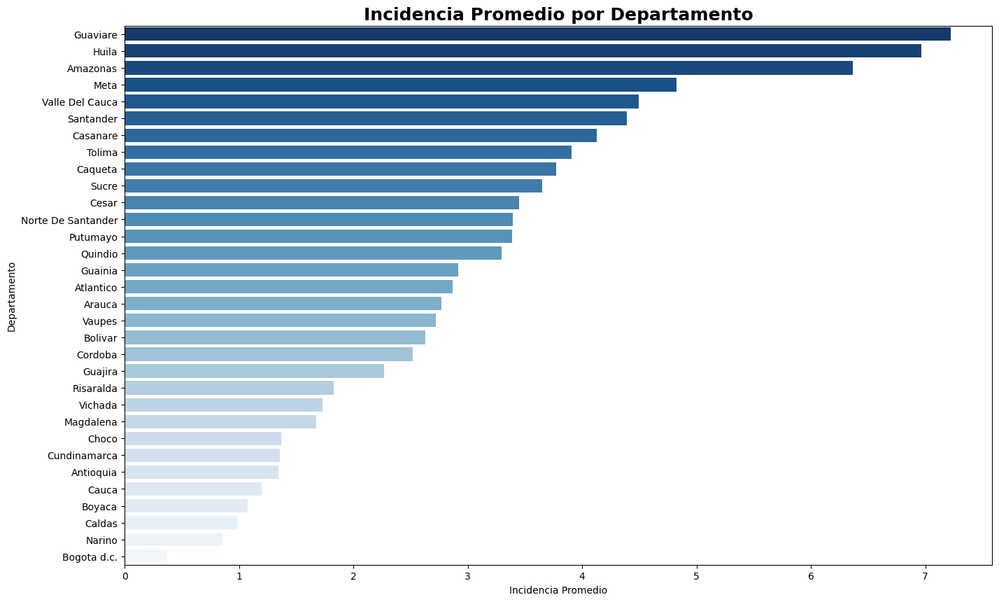

In [39]:

espacial = (
    df.groupby("departamento")["incidencia"]
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)

plt.figure(figsize=(16, 10))

sns.barplot(
    data=espacial,
    y="departamento",
    x="incidencia",
    palette="Blues_r"
)

plt.title(
    "Incidencia Promedio por Departamento",
    fontsize=18,
    fontweight="bold"
)

plt.xlabel("Incidencia Promedio")
plt.ylabel("Departamento")

plt.show()

El gráfico evidencia una marcada variabilidad espacial en la incidencia promedio de dengue entre los departamentos de Colombia. Se observa que Guaviare, Huila y Amazonas presentan las incidencias promedio más elevadas, mientras que Bogotá D.C., Nariño y Boyacá registran los valores más bajos. Estos resultados sugieren que la transmisión de la enfermedad no se distribuye de manera homogénea en el territorio nacional, sino que presenta patrones geográficos diferenciados asociados a las condiciones ambientales, demográficas y socioeconómicas de cada región. Esta heterogeneidad espacial resalta la importancia de incorporar información geográfica y covariables ambientales en los modelos predictivos, con el fin de representar adecuadamente las diferencias regionales en la dinámica de transmisión del dengue.

## **2.6. Análisis Temporal Global**

### **2.6.1. Visualización Temporal**

In [40]:
ts = (
    df.groupby("fecha_inicio")[['incidencia','ano','semana']]
    .mean()
    .reset_index()
)

ts["fecha_inicio"] = pd.to_datetime(ts["fecha_inicio"])
ts = ts.sort_values("fecha_inicio")

Con el objetivo de suavizar las fluctuaciones de corto plazo y resaltar las tendencias subyacentes de la serie temporal, se calculará una media móvil. Para ello, se empleará una ventana temporal de 52 semanas, equivalente a un año epidemiológico completo, lo que permitirá capturar de manera más adecuada los patrones de comportamiento anual y reducir la influencia de variaciones semanales puntuales.

**Media Movil:**

$\bar{x}*t=\frac{1}{w}\sum*{i=t-\frac{w-1}{2}}^{t+\frac{w-1}{2}}x_i$

**Desviación Estandar Movil:**

$s_t=\sqrt{\frac{1}{w-1}\sum_{i=t-\frac{w-1}{2}}^{t+\frac{w-1}{2}}(x_i-\bar{x}_t)^2}$

donde ($w=52$) corresponde a la ventana anual utilizada para suavizar la serie temporal de incidencia de dengue.


In [41]:
CON_VENTANA = 52 

ts["media_movil"] = (
    ts["incidencia"]
    .rolling(window=CON_VENTANA, center=True)
    .mean()
)

ts["desviacion_movil"] = (
    ts["incidencia"]
    .rolling(window=CON_VENTANA, center=True)
    .std()
)

ts["banda_superior"] = ts["media_movil"] + ts["desviacion_movil"]
ts["banda_inferior"] = ts["media_movil"] - ts["desviacion_movil"]
ts["banda_inferior"] = ts["banda_inferior"].clip(lower=0)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=ts["fecha_inicio"],
    y=ts["incidencia"],
    mode='lines',
    name='Incidencia Semanal (Datos Crudos)',
    line=dict(color='rgba(71, 161, 191, 1)', width=1), 
    hovertemplate="<b>Incidencia Semanal:</b> %{y}<extra></extra>"
))

fig.add_trace(go.Scatter(
    x=ts["fecha_inicio"],
    y=ts["banda_superior"],
    mode='lines',
    line=dict(width=0), 
    showlegend=False,
    hoverinfo='skip'
))

fig.add_trace(go.Scatter(
    x=ts["fecha_inicio"],
    y=ts["banda_inferior"],
    mode='lines',
    line=dict(width=0),
    fill='tonexty', 
    fillcolor='rgba(40, 160, 201, 0.34)',
    hovertemplate="<b>Banda Desviación:</b> [%{y:.1f} - " + ts["banda_superior"].round(1).astype(str) + "]<extra></extra>"
))

fig.add_trace(go.Scatter(
    x=ts["fecha_inicio"],
    y=ts["media_movil"],
    mode='lines',
    name='Media Móvil (Tendencia)',
    line=dict(color='#1081a6', width=3), 
    hovertemplate="<b>Media Móvil Local:</b> %{y:.2f}<extra></extra>"
))

fig.update_layout(
    title=dict(
        text="Suavizado Temporal",
        font=dict(size=20, color='#2c3e50'),
        x=0.5
    ),
    xaxis=dict(
        title="Fecha Epidemiológica",
        showgrid=True,
        gridcolor='#f0f0f0',
        rangeslider=dict(visible=True),
        type="date"
    ),
    yaxis=dict(
        title="Número de Casos",
        showgrid=True,
        gridcolor='#e0e0e0',
        zeroline=True,
        zerolinecolor='#bdc3c7'
    ),
    template="plotly_white",
    hovermode="x unified", 
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(l=50, r=50, t=80, b=50)
)

fig.show()

La serie temporal de incidencia de dengue evidencia una tendencia creciente a largo plazo, acompañada de fluctuaciones importantes que se consideran brotes epidémicos. Se observa un comportamiento no estacionario, dado que tanto la media como la variabilidad de la serie cambian a lo largo del tiempo, alcanzando sus valores más elevados durante los brotes registrados en 2019–2020 y, especialmente, en 2023–2024.

Asimismo, la media móvil de 52 semanas permite identificar patrones recurrentes compatibles con una estacionalidad anual y la presencia de ciclos epidémicos de varios años de duración. En particular, se destacan los periodos de alta transmisión observados en 2013–2014, 2019–2020 y 2023–2024, este último correspondiente al evento epidémico de mayor magnitud registrado en toda la serie. Por otra parte, los cambios en la incidencia se producen de manera gradual, evidenciando una fuerte dependencia temporal entre observaciones consecutivas, lo que sugiere que la información histórica constituye un elemento relevante para comprender y predecir la dinámica futura de la enfermedad.


In [42]:
inc_dep_ano = (
    df.groupby(["departamento", "ano"], observed=False)["incidencia"]
    .mean()
    .reset_index()
)
inc_dep_ano = inc_dep_ano.sort_values("ano")

fig = px.box(
    inc_dep_ano,
    x="ano",
    y="incidencia",
    color="ano",                     
    color_discrete_sequence=px.colors.sequential.Blues[3:], 
    title="Distribución y Variabilidad Anual de la Incidencia de Dengue por Departamento (2012-2024)",
    labels={"ano": "Año Epidemiológico", "incidencia": "Incidencia Promedio"},
    hover_data=["departamento"] 
)
fig.update_layout(
    title_font_size=18,
    title_x=0.5,                    
    xaxis=dict(
        title="Año Epidemiológico",
        tickmode='linear',
        dtick=1,                      
        showgrid=False
    ),
    yaxis=dict(
        title="Incidencia (Distribución por Departamentos)",
        tickformat=',',             
        showgrid=True,
        gridcolor='#cccccc',        
        zeroline=False
    ),
    template="plotly_white",       
    showlegend=False,                
    height=600,
    width=1200
)

fig.update_traces(
    marker=dict(
        color="#3c80e7",            
        size=4,
        opacity=0.7
    ),
    line_width=1.5,                 
    hovertemplate="<b>Departamento:</b> %{customdata[0]}<br>" +
                  "<b>Incidencia:</b> %{y:.2f}<br><extra></extra>"
)

fig.show()

El boxplot anual permite examinar la distribución de la incidencia de dengue y resaltar las diferencias entre los distintos años del periodo de estudio. Se observa un aumento progresivo en la dispersión de los casos durante los años epidémicos, destacándose 2013–2014, 2019–2020 y especialmente 2024, donde se registran las mayores incidencias y la mayor variabilidad de toda la serie. En contraste, años como 2017 y 2018 presentan distribuciones más concentradas y valores de incidencia considerablemente menores, reflejando periodos de baja transmisión.

Asimismo, se evidencia una tendencia al incremento tanto de la mediana como de la variabilidad de la incidencia en los años más recientes, acompañada de la presencia de numerosos valores atípicos durante los periodos epidémicos. Estos resultados confirman la existencia de una elevada heterogeneidad temporal y respaldan la presencia de ciclos epidémicos recurrentes, caracterizados por la alternancia entre años de baja y alta transmisión de la enfermedad.


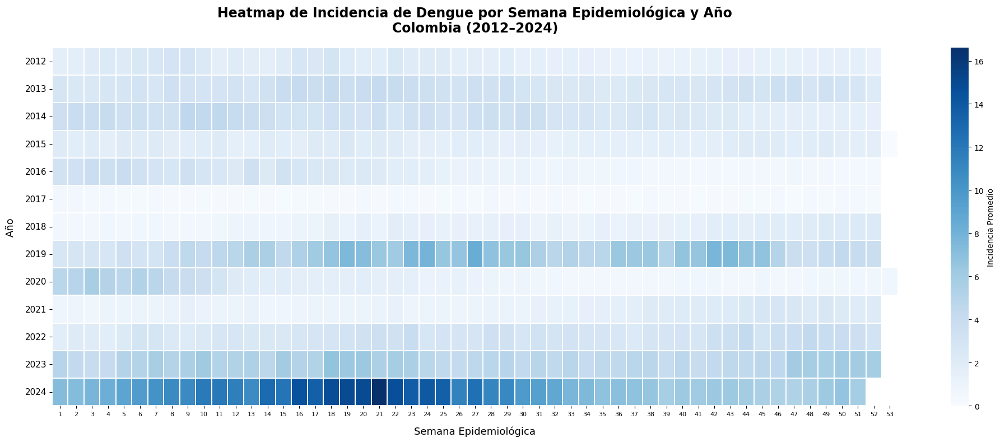

In [43]:
heatmap_df = (
    df.groupby(
        ["ano", "semana"],
        observed=False
    )["incidencia"]
    .mean()
    .reset_index()
)

matriz_heatmap = heatmap_df.pivot(
    index="ano",
    columns="semana",
    values="incidencia"
)

plt.figure(figsize=(20, 8))

sns.heatmap(
    matriz_heatmap,
    cmap="Blues",          # Amarillo → Naranja → Rojo
    linewidths=0.2,
    linecolor="white",
    cbar_kws={
        "label": "Incidencia Promedio"
    }
)

plt.title(
    "Heatmap de Incidencia de Dengue por Semana Epidemiológica y Año\nColombia (2012–2024)",
    fontsize=17,
    fontweight="bold",
    pad=20
)

plt.xlabel(
    "Semana Epidemiológica",
    fontsize=13,
    labelpad=12
)

plt.ylabel(
    "Año",
    fontsize=13,
    labelpad=12
)

plt.xticks(rotation=0, fontsize=8)
plt.yticks(rotation=0, fontsize=11)

plt.tight_layout()

plt.show()

El mapa de calor permitió visualizar con mayor claridad la evolución temporal de la incidencia del dengue por semanas epidemiológicas y años, confirmando los principales ciclos epidémicos observados previamente. Los años 2017 y 2018 presentan niveles bajos y homogéneos de transmisión, mientras que 2019 evidencia un incremento importante de casos durante varias semanas consecutivas. Por su parte, 2024 destaca como el periodo epidémico más severo de toda la serie, con una intensidad elevada y sostenida durante gran parte del año. Estos patrones reflejan una alta variabilidad temporal en la dinámica de transmisión del dengue.

In [44]:
decomp = seasonal_decompose(
    ts["incidencia"],
    model="additive",
    period=52
)

fig = make_subplots(
    rows=4, cols=1,
    shared_xaxes=True, 
    vertical_spacing=0.05, 
    subplot_titles=(
        "<b>Serie Observada (Datos Crudos)</b>", 
        "<b>Tendencia a Largo Plazo (Trend)</b>", 
        "<b>Componente Estacional Anual (Seasonal)</b>", 
        "<b>Residuos / Ruido Aleatorio (Resid)</b>"
    )
)

fig.add_trace(
    go.Scatter(
        x=ts["fecha_inicio"], y=decomp.observed,
        mode='lines', name='Observado', line=dict(color='#7f8c8d', width=1.5)
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=ts["fecha_inicio"], y=decomp.trend,
        mode='lines', name='Tendencia', line=dict(color='#1081a6', width=2.5)
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=ts["fecha_inicio"], y=decomp.seasonal,
        mode='lines', name='Estacionalidad', line=dict(color="#3b5fee", width=1.5)
    ),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(
        x=ts["fecha_inicio"], y=decomp.resid,
        mode='markers', name='Residuos', 
        marker=dict(color="#097cd3", size=4, opacity=0.7)
    ),
    row=4, col=1
)

fig.update_layout(
    title=dict(
        text="Descomposición Aditiva Estructural de la Serie Temporal",
        font=dict(size=22, color='#2c3e50'),
        x=0.5
    ),
    template="plotly_white",
    height=800, 
    showlegend=False, 
    hovermode="x unified"
)

fig.update_yaxes(title_text="Casos", row=1, col=1)
fig.update_yaxes(title_text="Tendencia", row=2, col=1)
fig.update_yaxes(title_text="Efecto", row=3, col=1)
fig.update_yaxes(title_text="Error", row=4, col=1)

fig.update_xaxes(title_text="Fecha Epidemiológica", row=4, col=1)

fig.show()

La descomposición temporal nos permite identificar tres componentes principales de la dinámica del dengue: tendencia, estacionalidad y residuos. El componente de tendencia evidencia un comportamiento cíclico de largo plazo, caracterizado por periodos alternados de incremento y disminución de la incidencia, compatibles con ciclos epidémicos recurrentes de aproximadamente 3 a 5 años. Por su parte, el componente estacional confirma la existencia de un patrón intraanual consistente, con incrementos de la incidencia durante determinadas semanas epidemiológicas y reducciones en otros periodos del año, lo que sugiere una marcada influencia de factores estacionales en la transmisión de la enfermedad.

Adicionalmente, el componente residual muestra desviaciones importantes respecto al comportamiento esperado de la serie, particularmente durante los brotes de 2019–2020 y, de manera más pronunciada, en 2023–2024. Estos resultados indican la presencia de eventos epidémicos extraordinarios cuya magnitud no puede ser explicada únicamente por los patrones de tendencia y estacionalidad identificados, evidenciando la influencia de factores adicionales sobre la dinámica de transmisión del dengue durante dichos periodos.


### **2.6.2. Pruebas Estadisticas:**

#### **2.6.2.1. ADF**

**Hipótesis:**

$
H_0:\ \text{La serie presenta raíz unitaria (no estacionaria)}
$


$H_1:\ \text{La serie no presenta raíz unitaria (estacionaria)}$


In [45]:
resultado = adfuller(ts["incidencia"])

print("ADF Statistic:", resultado[0])
print("p-value:", resultado[1])

ADF Statistic: -2.712308365762372
p-value: 0.07193249429220631


La prueba Augmented Dickey-Fuller (ADF) arrojó un estadístico de (-2.71) y un valor p de (0.072). Dado que el valor p es superior al nivel de significancia de 0.05, no se rechaza la hipótesis nula de presencia de raíz unitaria. En consecuencia, no existe evidencia estadística suficiente para afirmar que la serie temporal es estacionaria. Este resultado es consistente con los patrones observados previamente, donde la incidencia de dengue presenta tendencia de largo plazo, ciclos epidémicos recurrentes y cambios en la variabilidad a lo largo del tiempo.


#### **2.6.2.2. ACF**

In [46]:

# 1. Calcular manualmente los valores de la ACF y el intervalo de confianza
nlags = 52
valores_acf, intervalo_conf = acf(ts["incidencia"], nlags=nlags, alpha=0.05)

# El intervalo de confianza devuelto es absoluto [limite_inferior, limite_superior].
# Para graficar la banda sombreada simétrica alrededor de 0:
limite_superior = intervalo_conf[:, 1] - valores_acf
limite_inferior = intervalo_conf[:, 0] - valores_acf

# Crear un DataFrame para manejar los datos fácilmente en Plotly
df_acf = pd.DataFrame({
    'Lag': np.arange(nlags + 1),
    'ACF': valores_acf,
    'S_Upper': limite_superior,
    'S_Lower': limite_inferior
})

# 2. Construir el gráfico dinámico con Graph Objects
fig = go.Figure()

# A. Añadir la banda de confianza azul (Sombreado semi-transparente)
fig.add_trace(go.Scatter(
    x=pd.concat([df_acf['Lag'], df_acf['Lag'].iloc[::-1]]),
    y=pd.concat([df_acf['S_Upper'], df_acf['S_Lower'].iloc[::-1]]),
    fill='toself',
    fillcolor='rgba(23, 107, 203, 0.15)', # Azul estandar con opacidad
    line=dict(color='rgba(255,255,255,0)'),
    hoverinfo="skip", # No interrumpe la lectura al pasar el cursor
    name="Intervalo de Confianza (95%)"
))

# B. Añadir las líneas verticales (Lollipops) de cada rezago
for index, row in df_acf.iterrows():
    fig.add_trace(go.Scatter(
        x=[row['Lag'], row['Lag']],
        y=[0, row['ACF']],
        mode='lines',
        line=dict(color='#2c3e50', width=1.5),
        hoverinfo="skip",
        showlegend=False
    ))

# C. Añadir los puntos (marcadores) en la punta de cada línea
fig.add_trace(go.Scatter(
    x=df_acf['Lag'],
    y=df_acf['ACF'],
    mode='markers',
    marker=dict(color='#176BCB', size=6),
    name="Autocorrelación",
    hovertemplate="<b>Rezago (Semana):</b> %{x}<br><b>Autocorrelación:</b> %{y:.4f}<extra></extra>"
))

# 3. Configurar el diseño estético del Lienzo
fig.update_layout(
    title="<b>Función de Autocorrelación (ACF) de la Incidencia de Dengue</b>",
    title_font_size=18,
    title_x=0.5,
    xaxis_title="Rezago (semanas)",
    yaxis_title="Autocorrelación",
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=13, # Marcas cada 13 semanas (un trimestre) para detectar patrones estacionales
        range=[-2, nlags + 2],
        showgrid=True,
        gridcolor='#eeeeee'
    ),
    yaxis=dict(
        range=[-0.3, 1.1], # Rango estándar para evaluar correlaciones fuertes/débiles
        showgrid=True,
        gridcolor='#eeeeee'
    ),
    template="plotly_white",
    showlegend=False,
    height=500,
    width=1100
)

# Línea horizontal en 0 para referencia matemática clara
fig.add_hline(y=0, line_dash="solid", line_color="#7f8c8d", line_width=1)

fig.show()

El correlograma de la función de autocorrelación (ACF) evidencia una disminución gradual de las correlaciones a medida que aumenta el rezago temporal. Incluso después de 52 semanas, la autocorrelación permanece en valores positivos, lo que indica una fuerte dependencia temporal y una elevada persistencia en la dinámica de la incidencia del dengue. Este comportamiento sugiere que los niveles observados en una semana están estrechamente relacionados con los registrados en semanas previas, reflejando la naturaleza acumulativa y prolongada de los brotes epidémicos.

Adicionalmente, las autocorrelaciones permanecen estadísticamente significativas durante aproximadamente las primeras 30 semanas, lo que confirma la existencia de una estructura temporal robusta y de largo alcance en la serie. Este resultado indica que la información histórica contiene capacidad predictiva relevante para explicar el comportamiento futuro de la enfermedad. Asimismo, el lento decaimiento de la ACF es consistente con los resultados de la prueba de estacionariedad y con la presencia de tendencia y ciclos epidemiológicos observados previamente.


#### **2.6.2.3. PACF**

In [47]:
n_lags = 52
# Usamos el método 'yule_walker' u 'ols' para asegurar estabilidad en el cálculo
pacf_values, conf_int = pacf(ts["incidencia"].dropna(), nlags=n_lags, alpha=0.05, method='ols')

ci_upper = conf_int[:, 1] - pacf_values

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=list(range(n_lags + 1)),
    y=ci_upper,
    mode='lines',
    line=dict(width=0),
    showlegend=False,
    hoverinfo='skip'
))

fig.add_trace(go.Scatter(
    x=list(range(n_lags + 1)),
    y=-ci_upper,
    mode='lines',
    fill='tonexty',
    fillcolor='rgba(71, 161, 191, 0.27)', # Tono rojizo sutil para diferenciarlo visualmente del ACF
    name='Intervalo de Confianza (95%)',
    hovertemplate="<b>Límite Crítico:</b> ±%{y:.3f}<extra></extra>"
))

for lag, val in enumerate(pacf_values):
    fig.add_trace(go.Scatter(
        x=[lag, lag],
        y=[0, val],
        mode='lines',
        line=dict(color='#7f8c8d' if lag > 0 else "#3c89e7", width=1.5),
        showlegend=False,
        hoverinfo='skip'
    ))

# Agregar los marcadores al final de cada aguja
fig.add_trace(go.Scatter(
    x=list(range(n_lags + 1)),
    y=pacf_values,
    mode='markers',
    name='Coeficiente PACF',
    marker=dict(
        size=6,
        color=["#3c7ee7"] + ["#2b5dc0"] * n_lags, # Color diferenciador para el PACF
    ),
    hovertemplate="<b>Lag %{x}:</b><br>Autocorrelación Parcial: %{y:.3f}<extra></extra>"
))

# 3. Configuración estética y de interactividad (UI/UX)
fig.update_layout(
    title=dict(
        text="Función de Autocorrelación Parcial (PACF) - Incidencia de Dengue",
        font=dict(size=20, color='#2c3e50'),
        x=0.5
    ),
    xaxis=dict(
        title="Retardo Temporal (Lags en Semanas)",
        tickmode='linear',
        tick0=0,
        dtick=4, # Divisiones cada mes aproximado
        showgrid=True,
        gridcolor='#f0f0f0',
        range=[-1, n_lags + 1]
    ),
    yaxis=dict(
        title="Coeficiente de Autocorrelación Parcial",
        showgrid=True,
        gridcolor='#e0e0e0',
        zeroline=True,
        zerolinecolor='#2c3e50',
        zerolinewidth=1.5,
        range=[-0.5, 1.05]
    ),
    template="plotly_white",
    hovermode="x",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    height=500
)

# Mostrar la gráfica
fig.show()

La gráfica de la Función de Autocorrelación Parcial (PACF) muestra que la incidencia de dengue depende principalmente de lo ocurrido en las semanas inmediatamente anteriores, especialmente de la semana previa. Esto se evidencia en el fuerte pico observado en el retardo 1 (Lag 1), indicando que el número de casos actuales está altamente influenciado por los casos registrados la semana anterior. Sin embargo, esta dependencia directa disminuye rápidamente a partir de los siguientes retardos, ya que la mayoría de los valores posteriores caen dentro del intervalo de confianza y dejan de ser estadísticamente significativos. Esto sugiere que, aunque la serie presenta memoria temporal, la influencia directa del pasado es de corto plazo y se concentra principalmente en las últimas 1 o 2 semanas. Adicionalmente, algunos retardos aislados, como los observados entre las semanas 22–25, los cuales sugieren la presencia de patrones estacionales y ciclos epidémicos secundarios asociados a la dinámica periódica de transmisión. En conjunto, estos resultados indican que la serie puede modelarse adecuadamente mediante procesos autorregresivos de bajo orden, donde la información reciente contiene la mayor capacidad predictiva sobre el comportamiento futuro de la enfermedad.

### **2.6.3. Implicaciones para el Modelado**

Del análisis temporal realizado se concluye que la serie de incidencia de dengue presenta una dinámica compleja caracterizada por no estacionariedad, tendencia de largo plazo, patrones estacionales recurrentes, ciclos epidémicos multianuales y una fuerte dependencia temporal entre observaciones consecutivas. Estos resultados indican que enfoques estadísticos simples o modelos que asuman independencia temporal difícilmente podrán representar adecuadamente el comportamiento epidemiológico de la enfermedad.

La persistencia observada en la función de autocorrelación evidencia que la información histórica posee una importante capacidad predictiva, especialmente en horizontes temporales de corto y mediano plazo. Asimismo, la presencia de estacionalidad anual y ciclos epidémicos recurrentes sugiere la necesidad de incorporar explícitamente información temporal y variables derivadas que permitan capturar dichas estructuras.

Desde la perspectiva del modelado, los resultados respaldan la construcción de variables rezagadas, medias móviles y atributos temporales asociados a las semanas epidemiológicas. Adicionalmente, la ocurrencia de brotes de gran magnitud durante 2019–2020 y 2023–2024 evidencia la existencia de eventos extremos y cambios significativos en la dinámica de transmisión, por lo que resulta conveniente emplear enfoques capaces de adaptarse a comportamientos no lineales y a variaciones abruptas en la serie. Finalmente, la heterogeneidad espacial observada entre departamentos refuerza la importancia de incorporar variables climáticas, ambientales y geográficas que permitan representar de manera más adecuada los diferentes patrones de transmisión del dengue en Colombia.

## **2.7. Análisis Anual Temporal**

### **2.7.1. Series Anuales**

In [48]:
years = sorted(ts["ano"].unique())
n_cols = 4
n_rows = int(np.ceil(len(years) / n_cols))

fig = make_subplots(
    rows=n_rows, 
    cols=n_cols,
    subplot_titles=[str(year) for year in years],
    horizontal_spacing=0.05,  
    vertical_spacing=0.08,    
    shared_xaxes=False,       
    shared_yaxes=False        
)


for i, year in enumerate(years):
    row = (i // n_cols) + 1
    col = (i % n_cols) + 1
    
    data = ts[ts["ano"] == year].sort_values("semana")
    
    fig.add_trace(
        go.Scatter(
            x=data["semana"],
            y=data["incidencia"],
            mode='lines',
            name=str(year),
            line=dict(color='#176BCB', width=2),
            # Tooltip interactivo personalizado por punto
            hovertemplate="<b>Año:</b> " + str(year) + "<br><b>Semana:</b> %{x}<br><b>Incidencia:</b> %{y:.2f}<extra></extra>"
        ),
        row=row, col=col
    )
    
    # Personalizar de forma independiente los ejes de ESTE subplot específico
    fig.update_xaxes(
        range=[1, 53], 
        tickmode='linear', 
        tick0=1, 
        dtick=12, # Muestra marcas por trimestres aproximadamente (1, 13, 25, 37, 49)
        showgrid=True, 
        gridcolor='#eeeeee',
        row=row, col=col
    )
    
    fig.update_yaxes(
        showgrid=True, 
        gridcolor='#eeeeee',
        zeroline=False,
        row=row, col=col
    )

# 3. Configurar el diseño global del lienzo (Layout)
fig.update_layout(
    title_text="<b>Serie de Incidencia de Dengue por Año (Ejes Independientes)</b>",
    title_font_size=20,
    title_x=0.5, # Centrar el título general
    template="plotly_white",
    showlegend=False, # Ocultamos la leyenda global porque los títulos de cada cuadro ya aclaran el año
    height=300 * n_rows, # Altura dinámica proporcional a la cantidad de filas
    width=1300,
    hovermode="x unified" # Al pasar el cursor por una semana, muestra la info flotante de forma limpia
)

# Añadir títulos globales simulados para los ejes (opcional, ya que cada uno es independiente)
fig.add_annotation(x=0.5, y=-0.05, xref="paper", yref="paper", text="Semana Epidemiológica", showarrow=False, font_size=14)
fig.add_annotation(x=-0.04, y=0.5, xref="paper", yref="paper", text="Incidencia", showarrow=False, font_size=14, textangle=-90)

# 4. Mostrar el panel interactivo
fig.show()

Los graficos anuales de la incidencia permite comparar la dinámica intraanual del dengue y evidenciar diferencias importantes tanto en la magnitud como en la forma de los brotes entre años. En términos generales, los principales picos de incidencia tienden a concentrarse durante el primer semestre, especialmente entre las semanas epidemiológicas 10 y 25, lo que sugiere la existencia de un patrón estacional recurrente asociado a las condiciones climáticas favorables para la transmisión del vector.

Asimismo, se observan marcadas diferencias en la intensidad de los brotes epidémicos. Los años 2013, 2016, 2019, 2020 y particularmente 2024 presentan incrementos pronunciados de la incidencia, mientras que 2017 y 2018 muestran niveles considerablemente más bajos y estables. Destaca especialmente el comportamiento observado en 2024, donde la incidencia alcanza valores sustancialmente superiores a los registrados en años anteriores, consolidándose como el periodo epidémico más severo de toda la serie analizada.

Por otra parte, la comparación entre paneles evidencia que, aunque existe cierta regularidad en el momento de ocurrencia de los picos epidémicos, la magnitud y duración de estos varían considerablemente entre años. Este resultado refuerza la existencia simultánea de componentes estacionales y ciclos epidemiológicos de mayor escala temporal, lo que confirma la complejidad de la dinámica de transmisión del dengue y la necesidad de utilizar modelos capaces de capturar patrones no lineales, dependencias temporales y variaciones interanuales en la incidencia.


### **2.7.2. Coeficiente de Variación**

Con el fin de complementar el análisis temporal de la incidencia de dengue, procederemos a calcular el coeficiente de variación anual (CV), una medida estadística que relaciona la desviación estándar con la media de los casos observados durante cada año. Este indicador permite evaluar la variabilidad relativa de la incidencia y comparar la estabilidad epidemiológica entre años, independientemente de las diferencias en el nivel promedio de transmisión.

La utilidad del coeficiente de variación radica en que permite identificar periodos con comportamientos más homogéneos y periodos caracterizados por una mayor volatilidad epidemiológica, asociados generalmente a la ocurrencia de brotes de alta intensidad concentrados en determinadas semanas. De esta manera, el CV constituye una herramienta complementaria para analizar la dinámica temporal de la enfermedad, facilitando la identificación de años con mayor inestabilidad en la transmisión y aportando evidencia adicional sobre la heterogeneidad y complejidad del comportamiento del dengue a lo largo del periodo de estudio.

Formula:

$CV = \left( \frac{\sigma}{\mu} \right) \times 100$


In [49]:
metricas_anuales = df.groupby('ano')['incidencia'].agg(['mean', 'std', 'max']).reset_index()

metricas_anuales['CV (%)'] = (metricas_anuales['std'] / metricas_anuales['mean']) * 100

print(metricas_anuales.sort_values(by='CV (%)', ascending=False))

     ano      mean        std         max      CV (%)
6   2018  1.257852   2.673414   30.204910  212.538093
7   2019  5.392720  10.552076  158.841991  195.672632
8   2020  1.735818   3.242428   40.346505  186.795375
0   2012  1.798733   2.962438   38.115566  164.695789
5   2017  0.294551   0.484301    6.486486  164.419742
4   2016  1.655029   2.598291   29.068467  156.993636
9   2021  1.426342   2.223604   20.209419  155.895616
10  2022  2.969759   4.513602   47.558467  151.985464
11  2023  5.068404   6.406368   54.160097  126.398122
2   2014  2.978126   3.740359   45.296333  125.594392
1   2013  3.096139   3.431287   25.731563  110.824681
3   2015  1.769514   1.930335   15.195144  109.088399
12  2024  9.626460  10.037464   64.364714  104.269524


El análisis del coeficiente de variación anual evidencia una marcada heterogeneidad en la dinámica de transmisión del dengue a lo largo del periodo de estudio. Los valores obtenidos superan el 100% en todos los años analizados, lo que indica una elevada dispersión de la incidencia semanal respecto a su promedio anual y confirma la naturaleza altamente variable de la enfermedad.

Los mayores coeficientes de variación se registran en 2018 (212.5%), 2019 (195.7%) y 2020 (186.8%), reflejando años en los que la incidencia estuvo concentrada en un número reducido de semanas epidémicas, mientras que el resto del año presentó niveles relativamente bajos de transmisión. En contraste, aunque 2024 corresponde al año con la mayor incidencia promedio y el mayor número de casos observados, su coeficiente de variación (104.3%) fue uno de los más bajos de toda la serie. Esto sugiere que la transmisión elevada se mantuvo de forma más sostenida a lo largo del año, en lugar de concentrarse únicamente en unas pocas semanas de brote intenso.

En conjunto, estos resultados indican que los años epidémicos difieren no solo en magnitud, sino también en la forma en que los casos se distribuyen temporalmente. Mientras algunos periodos presentan brotes altamente concentrados y abruptos, otros exhiben una transmisión más persistente y prolongada. Este comportamiento confirma la complejidad temporal del dengue y refuerza la necesidad de emplear modelos capaces de capturar tanto la intensidad como la variabilidad de los procesos epidémicos.


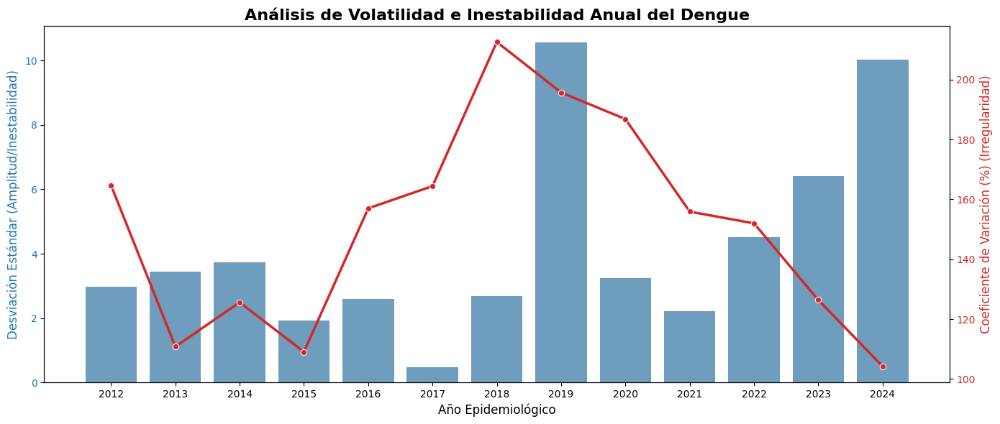

In [50]:
fig, ax1 = plt.subplots(figsize=(14, 6))

color_std = 'tab:blue'
ax1.set_xlabel('Año Epidemiológico', fontsize=12)
ax1.set_ylabel('Desviación Estándar (Amplitud/Inestabilidad)', color=color_std, fontsize=12)
sns.barplot(data=metricas_anuales, x='ano', y='std', color=color_std, alpha=0.7, ax=ax1)
ax1.tick_params(axis='y', labelcolor=color_std)

ax2 = ax1.twinx()  
color_cv = 'tab:red'
ax2.set_ylabel('Coeficiente de Variación (%) (Irregularidad)', color=color_cv, fontsize=12)
sns.lineplot(data=metricas_anuales, x=metricas_anuales.index, y='CV (%)', color=color_cv, marker='o', linewidth=2.5, ax=ax2)
ax2.tick_params(axis='y', labelcolor=color_cv)

plt.title('Análisis de Volatilidad e Inestabilidad Anual del Dengue', fontsize=16, fontweight='bold')
fig.tight_layout()
plt.show()

El análisis conjunto de la desviación estándar y el coeficiente de variación evidencia una importante variabilidad temporal en la incidencia del dengue a lo largo del periodo de estudio. Los años 2018 y 2019 presentaron los mayores coeficientes de variación, indicando una dispersión muy elevada de la incidencia respecto a su promedio anual, mientras que 2024 registró el valor más bajo de este indicador a pesar de presentar la mayor incidencia media y una de las desviaciones estándar más altas de toda la serie. Esto sugiere que, aunque 2024 fue el año más severo en términos epidemiológicos, el aumento de casos ocurrió de manera más homogénea a lo largo de las semanas del año, mientras que en periodos como 2018 y 2019 la incidencia mostró fluctuaciones relativamente más marcadas respecto a su nivel promedio. Asimismo, el incremento progresivo de la desviación estándar entre 2021 y 2024 refleja una ampliación en la magnitud de los brotes, consistente con la tendencia creciente observada en la serie temporal y con la intensificación de la transmisión durante los últimos años del periodo analizado.

/tmp/ipykernel_248539/3804802758.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


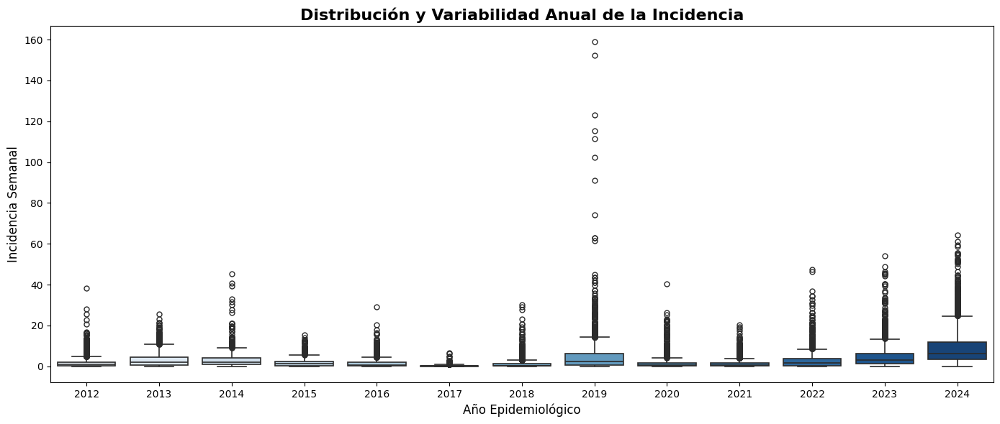

In [51]:
plt.figure(figsize=(14, 6))

sns.boxplot(
    data=df, 
    x='ano', 
    y='incidencia', 
    palette='Blues', 
    fliersize=5,
    linewidth=1.2
)

plt.title('Distribución y Variabilidad Anual de la Incidencia', fontsize=16, fontweight='bold')
plt.xlabel('Año Epidemiológico', fontsize=12)
plt.ylabel('Incidencia Semanal', fontsize=12)
plt.tight_layout()
plt.show()

El boxplot anual confirma los resultados obtenidos mediante el coeficiente de variación. Los años 2018 y 2019 presentan una elevada heterogeneidad en la distribución de la incidencia, evidenciada por la presencia de numerosos valores atípicos y una amplia dispersión relativa respecto a sus medias anuales, lo que se traduce en los mayores coeficientes de variación de toda la serie. Por el contrario, aunque 2024 registra la mayor incidencia promedio y una elevada dispersión absoluta, su coeficiente de variación es el más bajo, indicando que el incremento de casos ocurrió de forma más generalizada entre departamentos y semanas epidemiológicas. En conjunto, estos resultados sugieren que los años epidémicos recientes se caracterizan no solo por un aumento en la magnitud de la transmisión, sino también por una mayor sincronización espacial y temporal del fenómeno epidemiológico.

### **2.7.3. Implicaciones para el Modelado**

Los resultados indican que la serie temporal del dengue presenta una dinámica altamente heterogénea, con cambios importantes tanto en la intensidad como en la variabilidad de la transmisión entre años. Los elevados coeficientes de variación, la presencia de numerosos valores atípicos y la ocurrencia de brotes epidémicos de distinta magnitud evidencian una distribución temporal compleja y una varianza aparentemente no constante, sugiriendo la posible existencia de heterocedasticidad. Adicionalmente, el análisis de estacionariedad y autocorrelación mostró que la serie posee una fuerte dependencia temporal y un comportamiento no estacionario, caracterizado por tendencias de largo plazo, estacionalidad y ciclos epidémicos recurrentes. En consecuencia, el modelado requiere estrategias de preprocesamiento orientadas a estabilizar la serie, tales como transformaciones logarítmicas, diferenciación temporal y generación de variables rezagadas que permitan capturar la persistencia observada en la incidencia.

Asimismo, las diferencias observadas entre años altamente volátiles, como 2019, y años de transmisión más sostenida, como 2024, sugieren que la dinámica epidemiológica puede variar considerablemente entre periodos epidémicos. Esto indica que modelos lineales simples podrían ser insuficientes para representar adecuadamente la complejidad del proceso de transmisión. Por tanto, resulta conveniente evaluar enfoques temporales y espacio-temporales más flexibles complementados con variables climáticas, ambientales y geográficas que permitan capturar tanto las dependencias temporales como la heterogeneidad espacial observada en la enfermedad.

## **2.8. Análisis Espacial Global**

In [52]:
tabla_global = df.groupby('departamento')['incidencia'].agg(
    Incidencia_Promedio='mean',
    Incidencia_Total='sum',
    Max_Incidencia_Registrada='max',
    Volatilidad_Espacial='std'
).reset_index()

tabla_global = tabla_global.sort_values(by='Incidencia_Promedio', ascending=False).reset_index(drop=True)

print("=== TABLA GLOBAL DE INCIDENCIA POR DEPARTAMENTO ===")
print(tabla_global.to_string(index=False))

=== TABLA GLOBAL DE INCIDENCIA POR DEPARTAMENTO ===
      departamento  Incidencia_Promedio  Incidencia_Total  Max_Incidencia_Registrada  Volatilidad_Espacial
          Guaviare             7.222754       4889.804712                  47.558467              8.773454
             Huila             6.966276       4716.168687                  64.364714             10.453731
          Amazonas             6.367430       4310.750293                 158.841991             15.203503
              Meta             4.824785       3266.379603                  48.797651              6.690145
   Valle Del Cauca             4.492214       3041.228638                  46.234823              7.843239
         Santander             4.389946       2971.993356                  40.241111              6.074828
          Casanare             4.127659       2794.424838                  37.214077              5.971591
            Tolima             3.905695       2644.155657                  34.481660        

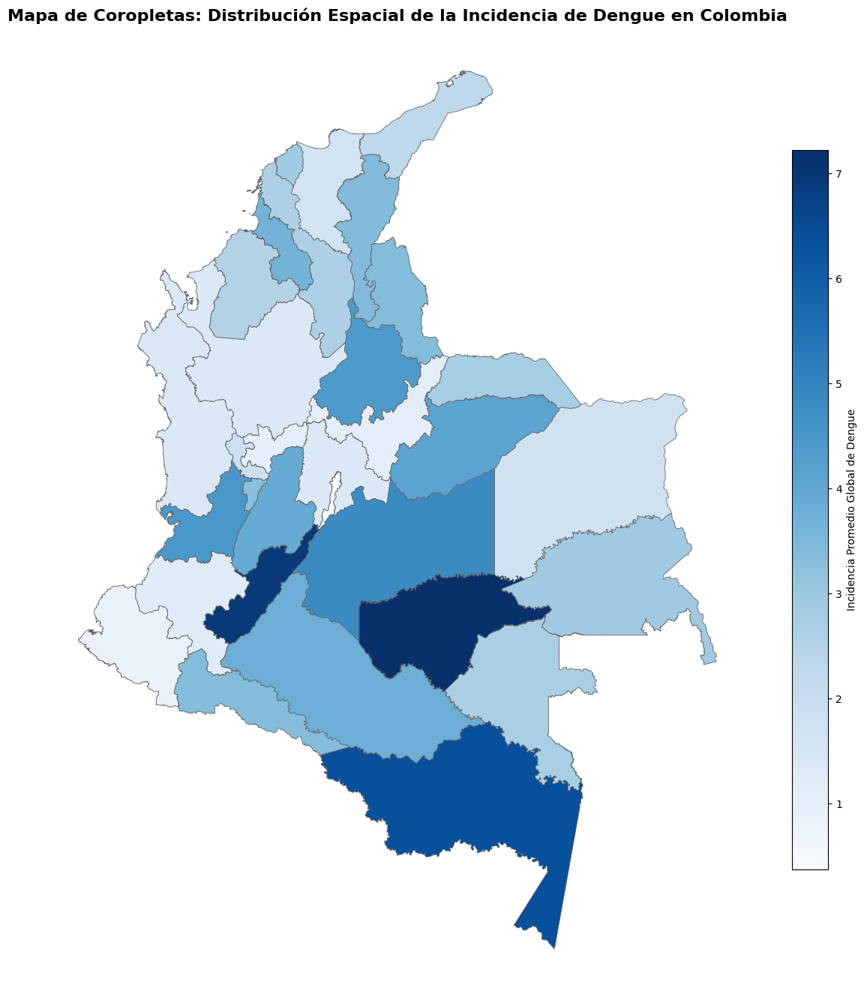

In [53]:
mapa_colombia = gpd.read_file("/home/guirlessa/Dl_Proyecto_Dengue/Covariables/MGN_ADM_DPTO_POLITICO/MGN_ADM_DPTO_POLITICO_limpio.shp")

mapa_final = mapa_colombia.merge(tabla_global, left_on='dpto_cnmbr', right_on='departamento', how='left')

fig, ax = plt.subplots(1, 1, figsize=(12, 14))

mapa_colombia.plot(ax=ax, color="#BAB7B7", edgecolor='white')

mapa_final.plot(
    column='Incidencia_Promedio',
    cmap='Blues', 
    linewidth=0.6,
    ax=ax,
    edgecolor='0.4',
    legend=True,
    legend_kwds={
        'label': "Incidencia Promedio Global de Dengue",
        'orientation': "vertical",
        'shrink': 0.7
    }
)

ax.set_title('Mapa de Coropletas: Distribución Espacial de la Incidencia de Dengue en Colombia', fontsize=16, fontweight='bold')
ax.axis('off') 
plt.tight_layout()
plt.show()

/tmp/ipykernel_248539/3423260695.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


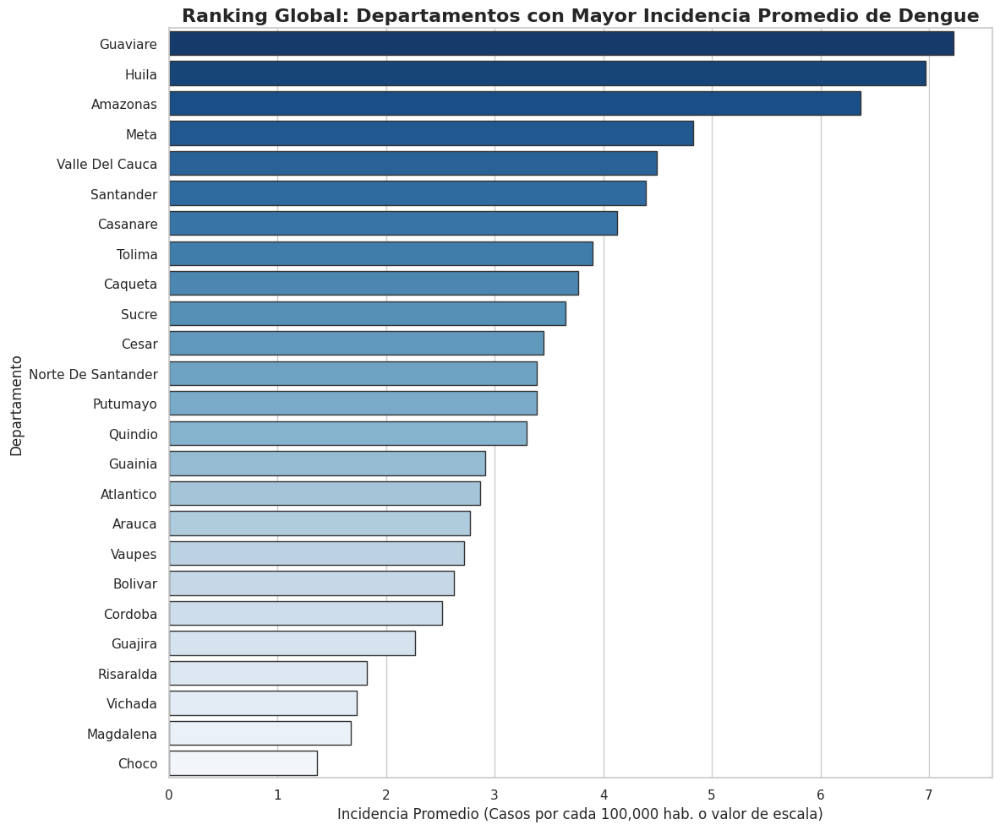

In [54]:
plt.figure(figsize=(12, 10))
sns.set_theme(style="whitegrid")
sns.barplot(
    data=tabla_global.head(25),
    x='Incidencia_Promedio',
    y='departamento',
    palette='Blues_r',
    edgecolor='0.2'
)

plt.title('Ranking Global: Departamentos con Mayor Incidencia Promedio de Dengue', fontsize=16, fontweight='bold')
plt.xlabel('Incidencia Promedio (Casos por cada 100,000 hab. o valor de escala)', fontsize=12)
plt.ylabel('Departamento', fontsize=12)
plt.tight_layout()
plt.show()

Los resultados evidencian una marcada heterogeneidad espacial en la incidencia del dengue en Colombia. Los departamentos de **Guaviare, Huila y Amazonas** registran las mayores incidencias promedio, mientras que **Bogotá D.C., Nariño y Boyacá** presentan los valores más bajos. Asimismo, regiones como **Meta, Valle del Cauca, Santander, Casanare y Tolima** muestran niveles elevados de transmisión, consolidándose como importantes focos epidemiológicos durante el periodo de estudio.

Adicionalmente, se observan diferencias significativas en la variabilidad temporal entre departamentos. Amazonas, Huila, Valle del Cauca y Guaviare combinan altas incidencias con una elevada volatilidad, reflejando la ocurrencia de brotes intensos y fluctuaciones importantes en el tiempo. En contraste, departamentos con menor incidencia presentan un comportamiento más estable. En conjunto, estos resultados confirman que la transmisión del dengue no es homogénea en el territorio nacional y resaltan la importancia de incorporar variables espaciales, climáticas y ambientales en los modelos predictivos para capturar adecuadamente las diferencias regionales en el riesgo epidemiológico.


### **2.8.2. Moran's Global**

In [55]:
import numpy as np

np.random.seed(42)

In [56]:
geo_global = mapa_colombia.merge(
    tabla_global,
    left_on="dpto_cnmbr",
    right_on="departamento",
    how="left"
)

In [57]:
w = Queen.from_dataframe(geo_global)
w.transform = "r"

/tmp/ipykernel_248539/3750852655.py:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_global)


In [58]:
y = geo_global["Incidencia_Promedio"].values

In [59]:
moran_global = Moran(y, w, permutations=999)

print("=== MORAN'S I GLOBAL ===")
print("Moran's I:", moran_global.I)
print("p-value:", moran_global.p_sim)

=== MORAN'S I GLOBAL ===
Moran's I: -0.012192656762746355
p-value: 0.414


El análisis de autocorrelación espacial global mediante el índice de Moran’s I arrojó un valor de −0.012 con un *p‑value* de 0.414, lo que indica que no existe evidencia estadísticamente significativa de dependencia espacial en la distribución promedio de la incidencia del dengue entre los departamentos de Colombia. Este resultado, cercano a cero y sin significancia, sugiere que los niveles de incidencia no presentan un patrón de agrupamiento territorial consistente, ni positivo ni negativo, y que las variaciones observadas responden más a factores locales que a la proximidad geográfica. En consecuencia, para el modelado predictivo resulta más pertinente incorporar variables ambientales, demográficas y temporales específicas de cada departamento, en lugar de apoyarse exclusivamente en estructuras espaciales, ya que la dinámica del dengue parece estar determinada por condiciones internas de cada región más que por la influencia de sus vecinos.

### **2.8.3. Implicaciones para el Modelado**

La marcada heterogeneidad espacial observada en la incidencia del dengue evidencia que la transmisión de la enfermedad varía considerablemente entre departamentos, tanto en magnitud como en volatilidad. Estas diferencias sugieren que modelos globales simples podrían no representar adecuadamente las particularidades epidemiológicas de cada región, por lo que resulta conveniente incorporar información espacial, geográfica, climática y ambiental. Asimismo, la presencia de departamentos con alta incidencia y elevada variabilidad, como Amazonas, Huila y Guaviare, respalda el uso de enfoques espacio-temporales capaces de capturar dependencias regionales y patrones de transmisión diferenciados, con el fin de mejorar la capacidad predictiva y la generalización de los modelos.


## **2.9. Análisis Espacial Anual**

### **2.9.1. Visualización Espacial Anual**

In [60]:
inc_dep_ano

,departamento,ano,incidencia
377,Valle Del Cauca,2012,0.733624
65,Bolivar,2012,0.988096
91,Caldas,2012,0.176087
78,Boyaca,2012,0.436591
260,Meta,2012,6.897797
...,...,...,...
90,Boyaca,2024,2.961289
103,Caldas,2024,4.391630
363,Sucre,2024,7.929102
51,Atlantico,2024,5.410690


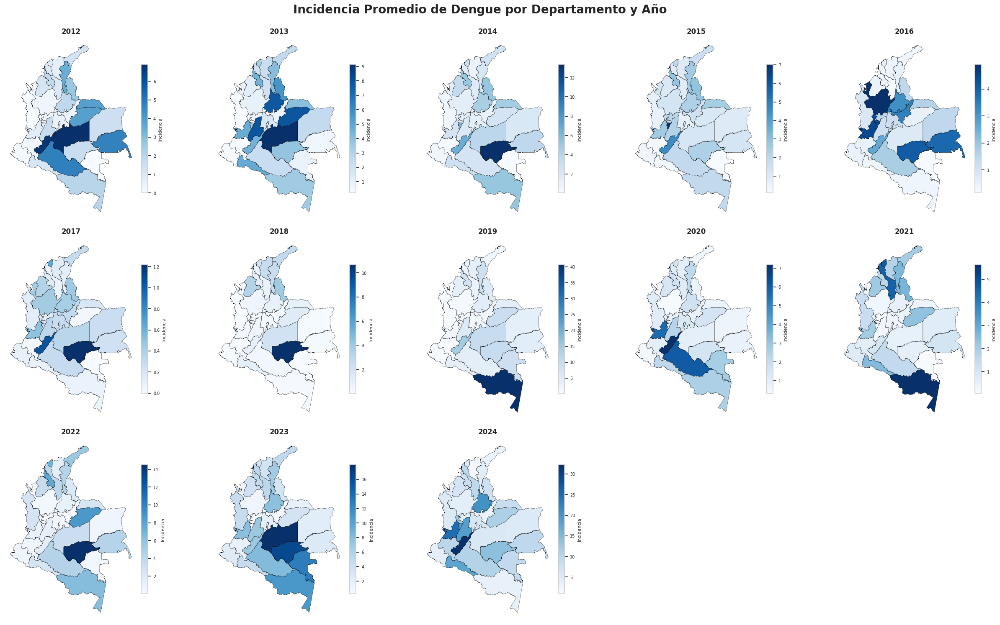

In [61]:
# Asegurar mismo tipo de dato para el merge
mapa_colombia["dpto_ccdgo"] = mapa_colombia["dpto_ccdgo"].astype(int)
inc_dep_ano["departamento"] = inc_dep_ano["departamento"]

anos_unicos = sorted(inc_dep_ano["ano"].unique())
num_anos = len(anos_unicos)

n_cols = 5
n_rows = int(np.ceil(num_anos / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(n_cols * 5, n_rows * 5)
)

axes = np.array(axes).flatten()

for i, ano in enumerate(anos_unicos):

    ax = axes[i]

    # Filtrar año
    datos_ano = inc_dep_ano[inc_dep_ano["ano"] == ano].copy()

    # Promedio anual de incidencia por departamento
    datos_ano_agrupado = (
        datos_ano
        .groupby("departamento")["incidencia"]
        .mean()
        .reset_index()
    )

    # Unir con shapefile
    geo_ano = mapa_colombia.merge(
    datos_ano_agrupado,
    left_on="dpto_cnmbr",
    right_on="departamento",
    how="left"
)

    # Escala individual por año
    vmin_ano = geo_ano["incidencia"].min()
    vmax_ano = geo_ano["incidencia"].max()

    if pd.isna(vmin_ano) or pd.isna(vmax_ano) or vmin_ano == vmax_ano:
        vmin_ano, vmax_ano = 0, 1

    geo_ano.plot(
        column="incidencia",
        cmap="Blues",
        linewidth=0.3,
        edgecolor="black",
        vmin=vmin_ano,
        vmax=vmax_ano,
        missing_kwds={"color": "lightgrey"},
        ax=ax
    )

    # Barra de color individual
    norm = mpl.colors.Normalize(vmin=vmin_ano, vmax=vmax_ano)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap="Blues")
    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        ax=ax,
        fraction=0.035,
        pad=0.02
    )

    cbar.ax.tick_params(labelsize=7)
    cbar.set_label("Incidencia", fontsize=8)

    ax.set_title(f"{ano}", fontsize=12, fontweight="bold")
    ax.axis("off")

# Eliminar subplots vacíos
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle(
    "Incidencia Promedio de Dengue por Departamento y Año",
    fontsize=20,
    fontweight="bold",
    y=0.995
)

plt.tight_layout()
plt.show()

Este conjunto de mapas permite analizar la evolución espacial de la incidencia del dengue entre 2012 y 2024, evidenciando una marcada variabilidad tanto temporal como geográfica. A lo largo del periodo se observan cambios importantes en la localización de los principales focos de transmisión, donde departamentos como Huila, Guaviare, Amazonas, Meta y Valle del Cauca aparecen recurrentemente entre las regiones con mayores niveles de incidencia. Asimismo, se identifican años de baja transmisión generalizada, como 2017 y 2018, contrastando con periodos epidémicos de mayor intensidad como 2013, 2016, 2019 y especialmente 2024, cuando el incremento de la incidencia se extendió a un mayor número de departamentos.

En conjunto, los mapas confirman que la distribución espacial del dengue no permanece constante en el tiempo, sino que presenta desplazamientos y cambios en la intensidad de los brotes entre regiones. Aunque algunos departamentos mantienen una vulnerabilidad persistente, la magnitud de la transmisión varía considerablemente de un año a otro, reflejando la influencia de factores climáticos, ambientales y demográficos sobre la dinámica epidemiológica. Estos resultados refuerzan la necesidad de incorporar explícitamente la dimensión espacial en los modelos predictivos, ya que la incidencia observada en una región depende tanto de su comportamiento histórico como de las condiciones particulares de cada territorio y periodo epidémico.


In [62]:
inc_dep_ano = (
    df.groupby(["departamento", "ano"], observed=False)["incidencia"]
    .mean()
    .reset_index()
)

top_5_por_ano = (
    inc_dep_ano.groupby("ano")
    .apply(lambda x: x.nlargest(5, "incidencia")) # <-- Cambiado de 10 a 5
    .reset_index(drop=True)
)

print("--- TOP 5 DEPARTAMENTOS CON MAYOR INCIDENCIA POR AÑO ---")
top_5_por_ano.head(10)

--- TOP 5 DEPARTAMENTOS CON MAYOR INCIDENCIA POR AÑO ---


/tmp/ipykernel_248539/2365914664.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(5, "incidencia")) # <-- Cambiado de 10 a 5


,departamento,ano,incidencia
0,Meta,2012,6.897797
1,Huila,2012,6.757318
2,Caqueta,2012,4.783567
3,Guainia,2012,4.740013
4,Casanare,2012,3.898627
5,Meta,2013,9.133646
6,Tolima,2013,7.858665
7,Casanare,2013,7.828272
8,Santander,2013,7.770047
9,Norte De Santander,2013,5.653071


/tmp/ipykernel_248539/1575624156.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


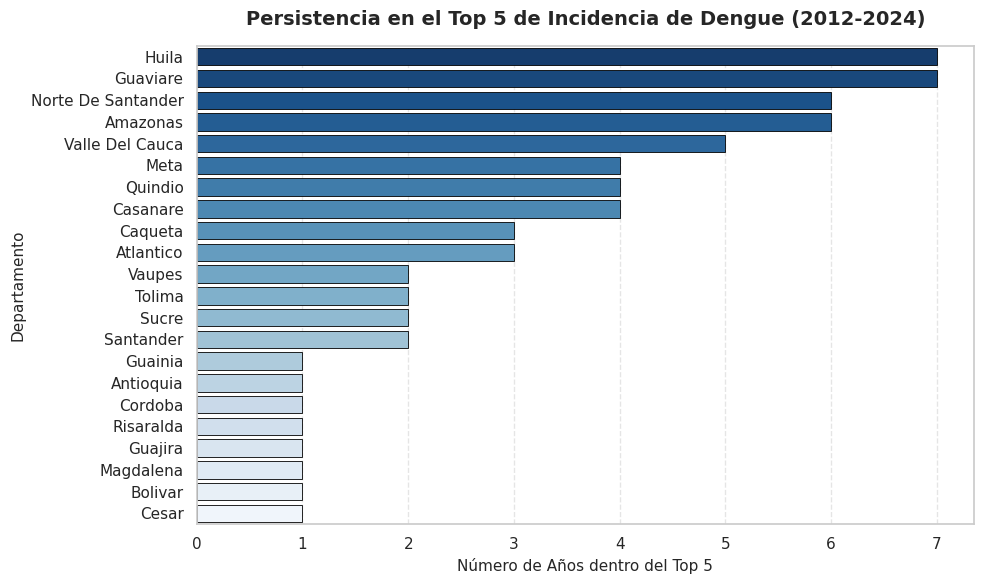

In [63]:
persistencia = top_5_por_ano["departamento"].value_counts().reset_index()
persistencia.columns = ["Departamento", "Años_Top_5"]

plt.figure(figsize=(10, 6))

sns.barplot(
    data=persistencia,
    x="Años_Top_5",
    y="Departamento",
    order=persistencia["Departamento"],  
    palette="Blues_r",                  
    edgecolor="black",
    linewidth=0.6
)

plt.title("Persistencia en el Top 5 de Incidencia de Dengue (2012-2024)", fontsize=14, fontweight="bold", pad=15)
plt.xlabel("Número de Años dentro del Top 5", fontsize=11)
plt.ylabel("Departamento", fontsize=11)
plt.grid(axis="x", linestyle="--", alpha=0.5)

plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))

plt.tight_layout()
plt.show()

El análisis de la persistencia dentro del Top 5 de incidencia revela que la carga del dengue no se distribuye de manera aleatoria entre los departamentos, sino que existen territorios que mantienen de forma recurrente niveles elevados de transmisión a lo largo del tiempo. Destacan especialmente Huila y Guaviare, que permanecieron 7 años dentro del grupo de mayor incidencia, seguidos por Amazonas y Norte de Santander con 6 años, y Valle del Cauca con 5 años, lo que evidencia la existencia de focos epidemiológicos persistentes asociados probablemente a condiciones ambientales, climáticas y socioeconómicas favorables para la transmisión. En contraste, otros departamentos aparecen de manera esporádica dentro del Top 5, sugiriendo una participación más ligada a brotes puntuales. Estos resultados refuerzan la presencia de una marcada heterogeneidad espacial y respaldan la incorporación de variables geográficas y ambientales en los modelos predictivos, ya que parte del riesgo epidemiológico parece estar asociado a características estructurales propias de determinados territorios.


=== Generando Matriz Compacta de Heatmaps (5x3) ===


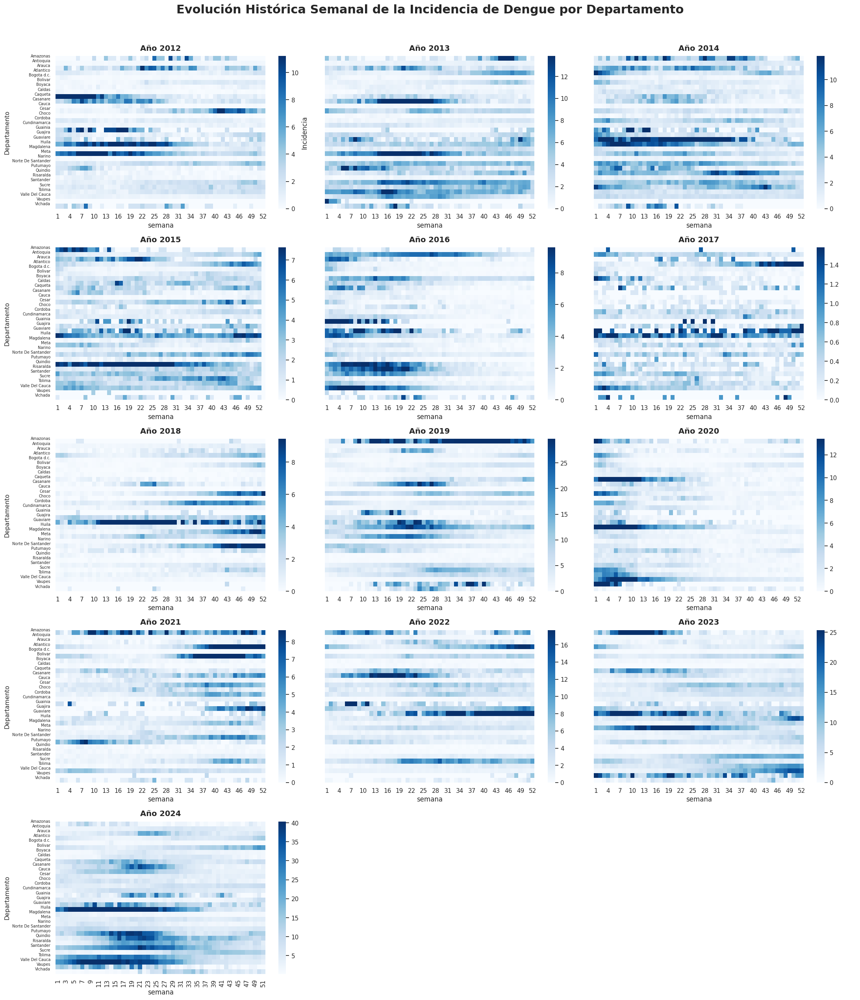

In [64]:
N_COLS = 3  

años_lista = sorted(df["ano"].unique())
num_años = len(años_lista)

num_filas = int(np.ceil(num_años / N_COLS))

fig, axes = plt.subplots(
    nrows=num_filas, 
    ncols=N_COLS, 
    figsize=(22, 5 * num_filas)
)

axes_flat = axes.flatten()

print(f"=== Generando Matriz Compacta de Heatmaps ({num_filas}x{N_COLS}) ===")

for i, año in enumerate(años_lista):
    ax = axes_flat[i]
    
    df_año = df[df["ano"] == año]
    
    matriz_año = df_año.pivot_table(
        index="departamento",
        columns="semana",
        values="incidencia",
        aggfunc="mean"
    ).fillna(0)
    
    matriz_año = matriz_año.sort_index(ascending=True)
    
    sns.heatmap(
        matriz_año,
        cmap="Blues",
        robust=True,
        # Solo mostrar la barra de color pequeña a la derecha para no saturar
        cbar_kws={'label': 'Incidencia'} if i == 0 else None, 
        ax=ax
    )
    
    ax.set_title(f"Año {año}", fontsize=14, fontweight='bold', pad=10)
    
    if i % N_COLS == 0:
        ax.set_ylabel("Departamento", fontsize=11)
        # SÚPER CRÍTICO: Forzar a que pinte TODOS los nombres con letra pequeña
        ax.set_yticks(np.arange(len(matriz_año.index)))
        ax.set_yticklabels(matriz_año.index, fontsize=7) # Ajusta a 7 o 6 si siguen sin salir
    else:
        ax.set_ylabel("")
        ax.set_yticklabels([])

for j in range(num_años, len(axes_flat)):
    axes_flat[j].axis('off')

fig.suptitle(
    "Evolución Histórica Semanal de la Incidencia de Dengue por Departamento", 
    fontsize=22, 
    fontweight='bold', 
    y=1.015
)

plt.tight_layout()
plt.show()

El mapa de calor espacio-temporal permite visualizar simultáneamente la evolución semanal de la incidencia de dengue en todos los departamentos y revela una marcada heterogeneidad tanto espacial como temporal en la transmisión de la enfermedad. Se observan ciclos epidémicos claramente diferenciados, con años de baja actividad como 2017 y 2018, donde predominan valores bajos y distribuciones relativamente homogéneas, y años de alta transmisión como 2013, 2016, 2019, 2023 y especialmente 2024, caracterizados por extensas áreas de alta intensidad que abarcan múltiples departamentos y semanas epidemiológicas consecutivas. Asimismo, los patrones muestran que los brotes no afectan de manera uniforme al territorio nacional, ya que departamentos como Huila, Guaviare, Amazonas, Meta, Valle del Cauca y Norte de Santander presentan recurrentemente mayores niveles de incidencia y una persistencia más prolongada de los periodos epidémicos. También se evidencia que los picos de transmisión suelen concentrarse entre las semanas 10 y 25, confirmando la presencia de una estacionalidad anual asociada a condiciones ambientales favorables para el vector. Finalmente, el comportamiento observado en 2024 destaca por la magnitud y sincronización espacial del brote, con incidencias elevadas en gran parte del país durante un periodo prolongado, lo que confirma que la dinámica del dengue está influenciada por interacciones complejas entre factores temporales, espaciales y ambientales, respaldando la necesidad de utilizar modelos espacio-temporales capaces de capturar estas dependencias regionales y la evolución temporal de la enfermedad.

### **2.9.2. Moran's Anual** 

In [65]:
for ano in sorted(df["ano"].unique()):

    df_ano = df[df["ano"] == ano]

    inc_ano = (
        df_ano.groupby("departamento")["incidencia"]
        .mean()
        .reset_index()
    )

    geo_ano = mapa_colombia.merge(
        inc_ano,
        left_on="dpto_cnmbr",
        right_on="departamento",
        how="left"
    )

    geo_ano = geo_ano.dropna(subset=["incidencia"])

    w = Queen.from_dataframe(geo_ano)
    w.transform = "r"

    moran = Moran(geo_ano["incidencia"], w)

    print(f"\n📊 Año: {ano}")
    print(f"   Moran's I : {moran.I:.4f}")
    print(f"   p-value   : {moran.p_sim:.4f}")
    print(f"   Signif.   : {'Sí' if moran.p_sim < 0.05 else 'No'}")
    print("-" * 40)

/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2012
   Moran's I : 0.0866
   p-value   : 0.1550
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2013
   Moran's I : -0.0388
   p-value   : 0.4920
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2014
   Moran's I : -0.0972
   p-value   : 0.2660
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2015
   Moran's I : 0.0392
   p-value   : 0.2410
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2016
   Moran's I : 0.2334
   p-value   : 0.0240
   Signif.   : Sí
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2017
   Moran's I : -0.0926
   p-value   : 0.2940
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2018
   Moran's I : -0.0042
   p-value   : 0.3100
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2019
   Moran's I : 0.0625
   p-value   : 0.1050
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2020
   Moran's I : 0.0667
   p-value   : 0.1740
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2021
   Moran's I : 0.2595
   p-value   : 0.0180
   Signif.   : Sí
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2022
   Moran's I : 0.0639
   p-value   : 0.1750
   Signif.   : No
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2023
   Moran's I : 0.1669
   p-value   : 0.0390
   Signif.   : Sí
----------------------------------------


/tmp/ipykernel_248539/3319250848.py:20: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(geo_ano)



📊 Año: 2024
   Moran's I : 0.0721
   p-value   : 0.1820
   Signif.   : No
----------------------------------------


Los resultados del índice de Moran muestran una dinámica espacio-temporal mayormente débil e inestable en la autocorrelación espacial de la variable analizada entre 2012 y 2024. En la mayoría de los años, los valores de Moran’s I son cercanos a cero (e incluso ligeramente negativos en algunos casos como 2013, 2014 y 2017), lo que indica ausencia de un patrón espacial consistente de agrupamiento o dispersión, y esto se confirma con p-valores superiores a 0.05 en casi todos los periodos, por lo que no hay significancia estadística. Sin embargo, se identifican tres excepciones relevantes: 2016 (I = 0.2334, p = 0.015), 2021 (I = 0.2595, p = 0.008) y 2023 (I = 0.1669, p = 0.049), donde sí existe evidencia de autocorrelación espacial positiva significativa, sugiriendo la formación de clusters espaciales de valores similares en esos años. En conjunto, el sistema no presenta una estructura espacial estable a lo largo del tiempo, sino episodios puntuales de concentración espacial que podrían estar asociados a eventos epidémicos o condiciones ambientales específicas.

## **2.10. Análisis Espacio-Temporal Covariables**

In [66]:
CON_VENTANA = 52

df_graf = df.copy()

df_nal = (
    df_graf.groupby("fecha_inicio")
    .agg({
        "incidencia": "mean",       
        "precip_lag_2": "mean"      
    })
    .reset_index()
    .sort_values("fecha_inicio")
    .reset_index(drop=True)
)

df_nal["precip_lag_2_suave"] = (
    df_nal["precip_lag_2"]
    .rolling(window=4, min_periods=1)
    .mean()
)

df_nal["media_movil"] = (
    df_nal["incidencia"]
    .rolling(window=CON_VENTANA, center=True)
    .mean()
)

df_nal["desviacion_movil"] = (
    df_nal["incidencia"]
    .rolling(window=CON_VENTANA, center=True)
    .std()
)

df_nal["banda_superior"] = (df_nal["media_movil"] + df_nal["desviacion_movil"])

df_nal["banda_inferior"] = (
    df_nal["media_movil"] -
    df_nal["desviacion_movil"]
).clip(lower=0)

fig = make_subplots(
    specs=[[{"secondary_y": True}]]
)

fig.add_trace(
    go.Scatter(
        x=df_nal["fecha_inicio"],
        y=df_nal["incidencia"],
        mode='lines',
        name='Incidencia Semanal Promedio',
        line=dict(
            color='rgba(71,161,191,0.35)',
            width=1
        ),
        hovertemplate="<b>Incidencia Semanal Nal:</b> %{y:.2f}<extra></extra>"
    ),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(
        x=df_nal["fecha_inicio"],
        y=df_nal["banda_superior"],
        mode='lines',
        line=dict(width=0),
        showlegend=False,
        hoverinfo='skip'
    ),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(
        x=df_nal["fecha_inicio"],
        y=df_nal["banda_inferior"],
        mode='lines',
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(16,129,166,0.15)',
        name='Varianza Móvil (±1 SD)',
        hovertemplate="<b>Banda Inferior:</b> %{y:.2f}<extra></extra>"
    ),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(
        x=df_nal["fecha_inicio"],
        y=df_nal["media_movil"],
        mode='lines',
        name='Tendencia Dengue (Nacional)',
        line=dict(
            color='#1081a6',
            width=3
        ),
        hovertemplate="<b>Media móvil local:</b> %{y:.2f}<extra></extra>"
    ),
    secondary_y=False
)

if "precip_lag_2_suave" in df_nal.columns:
    fig.add_trace(
        go.Scatter(
            x=df_nal["fecha_inicio"],
            y=df_nal["precip_lag_2_suave"],
            mode='lines',
            name='Precipitación Nacional Suave (Lag 2)',
            line=dict(
                color='#e67e22',
                width=2
            ),
            hovertemplate="<b>Precipitación (Suave):</b> %{y:.1f} mm<extra></extra>"
        ),
        secondary_y=True
    )

fig.update_layout(
    title=dict(
        text="Tendencia de Dengue y Precipitación Rezagada a Nivel Nacional (Colombia)",
        x=0.5,
        font=dict(size=18, color='#2c3e50')
    ),
    template="plotly_white",
    hovermode="x unified",
    xaxis=dict(
        title="Fecha Epidemiológica",
        rangeslider=dict(visible=True),
        type="date",
        gridcolor='#f0f0f0'
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    margin=dict(l=60, r=60, t=90, b=50)
)

fig.update_yaxes(
    title_text="<b>Incidencia Dengue (Casos Promedio)</b>", 
    color='#1081a6', 
    secondary_y=False
)
fig.update_yaxes(
    title_text="<b>Precipitación Promedio (mm)</b>", 
    color='#e67e22', 
    secondary_y=True, 
    showgrid=False
)

fig.show()

El gráfico evidencia una asociación temporal entre la incidencia nacional de dengue y la precipitación promedio rezagada dos semanas en Colombia. En términos generales, se observa que incrementos en la precipitación suelen anteceder o coincidir con aumentos posteriores en la incidencia, lo que sugiere que las condiciones de lluvia podrían favorecer la proliferación de criaderos del vector y contribuir al aumento de la transmisión. A lo largo del periodo 2012–2024 se identifican ciclos recurrentes de incremento de casos, destacándose los brotes de 2013–2014, 2019–2020 y especialmente 2023–2024, algunos de los cuales coinciden con periodos de mayor precipitación. Asimismo, la banda de variabilidad de la incidencia muestra una dispersión considerable durante los años epidémicos, reflejando una mayor inestabilidad en la dinámica de transmisión. En conjunto, los resultados respaldan la inclusión de variables climáticas rezagadas dentro de los modelos predictivos, ya que la precipitación parece contener información relevante para anticipar cambios en el comportamiento epidemiológico del dengue.

In [67]:
df_temp = df.copy()

df_nal_temp = (
    df_temp.groupby("fecha_inicio")
    .agg({
        "incidencia": "mean",
        "temp_lag_2": "mean"  
    })
    .reset_index()
    .sort_values("fecha_inicio")
    .reset_index(drop=True)
)

df_nal_temp["temp_suave"] = (
    df_nal_temp["temp_lag_2"]
    .rolling(window=4, min_periods=1)
    .mean()
)

df_nal_temp["media_movil"] = df_nal_temp["incidencia"].rolling(window=CON_VENTANA, center=True).mean()
df_nal_temp["desviacion_movil"] = df_nal_temp["incidencia"].rolling(window=CON_VENTANA, center=True).std()
df_nal_temp["banda_superior"] = df_nal_temp["media_movil"] + df_nal_temp["desviacion_movil"]
df_nal_temp["banda_inferior"] = (df_nal_temp["media_movil"] - df_nal_temp["desviacion_movil"]).clip(lower=0)

fig_temp = make_subplots(specs=[[{"secondary_y": True}]])

fig_temp.add_trace(go.Scatter(
    x=df_nal_temp["fecha_inicio"], y=df_nal_temp["incidencia"],
    mode='lines', name='Incidencia Semanal Promedio',
    line=dict(color='rgba(71,161,191,0.35)', width=1),
    hovertemplate="<b>Incidencia Semanal Nal:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

fig_temp.add_trace(go.Scatter(
    x=df_nal_temp["fecha_inicio"], y=df_nal_temp["banda_superior"],
    mode='lines', line=dict(width=0), showlegend=False, hoverinfo='skip'
), secondary_y=False)

fig_temp.add_trace(go.Scatter(
    x=df_nal_temp["fecha_inicio"], y=df_nal_temp["banda_inferior"],
    mode='lines', line=dict(width=0), fill='tonexty',
    fillcolor='rgba(16,129,166,0.15)', name='Varianza Móvil (±1 SD)',
    hovertemplate="<b>Banda Inferior:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

fig_temp.add_trace(go.Scatter(
    x=df_nal_temp["fecha_inicio"], y=df_nal_temp["media_movil"],
    mode='lines', name='Tendencia Dengue (Nacional)',
    line=dict(color='#1081a6', width=3),
    hovertemplate="<b>Media móvil local:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

if "temp_suave" in df_nal_temp.columns:
    fig_temp.add_trace(go.Scatter(
        x=df_nal_temp["fecha_inicio"], y=df_nal_temp["temp_suave"],
        mode='lines', name='Temperatura Nacional Suave lag 2',
        line=dict(color='#d9381e', width=2), # Color rojo/cálido para temperatura
        hovertemplate="<b>Temperatura (Suave):</b> %{y:.1f} °C<extra></extra>"
    ), secondary_y=True)

fig_temp.update_layout(
    title=dict(text="Tendencia de Dengue y Temperatura Promedio a Nivel Nacional", x=0.5, font=dict(size=18, color='#2c3e50')),
    template="plotly_white", hovermode="x unified",
    xaxis=dict(title="Fecha Epidemiológica", rangeslider=dict(visible=True), type="date", gridcolor='#f0f0f0'),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="center", x=0.5),
    margin=dict(l=60, r=60, t=90, b=50)
)

fig_temp.update_yaxes(title_text="<b>Incidencia Dengue (Casos Promedio)</b>", color='#1081a6', secondary_y=False)
fig_temp.update_yaxes(title_text="<b>Temperatura Promedio (°C)</b>", color='#d9381e', secondary_y=True, showgrid=False)

fig_temp.show()

El gráfico muestra una asociación temporal entre la temperatura promedio nacional y la incidencia del dengue en Colombia, considerando un rezago de dos semanas. En términos generales, los periodos con temperaturas más elevadas tienden a coincidir o anteceder aumentos en la incidencia, lo que es consistente con el papel que desempeña la temperatura en el ciclo biológico del mosquito Aedes aegypti y en la dinámica de transmisión del virus. A lo largo del periodo analizado se observan incrementos importantes de casos durante los brotes de 2013–2014, 2019–2020 y especialmente 2023–2024, los cuales ocurren en un contexto de temperaturas relativamente altas y estables. Asimismo, la banda de variabilidad de la incidencia evidencia una mayor dispersión durante los años epidémicos, reflejando la intensificación y heterogeneidad de la transmisión. Aunque la temperatura presenta una correspondencia visual con los cambios en la incidencia, el gráfico por sí solo no permite establecer una relación causal ni cuantificar la magnitud de su influencia. Sin embargo, los resultados sugieren que la temperatura contiene información relevante para explicar parte de la variabilidad temporal del dengue y respaldan su incorporación como covariable climática en modelos predictivos de la enfermedad.

In [68]:
df_hum = df.copy()

df_nal_hum = (
    df_hum.groupby("fecha_inicio")
    .agg({
        "incidencia": "mean",
        "humedad_lag_2": "mean"  
    })
    .reset_index()
    .sort_values("fecha_inicio")
    .reset_index(drop=True)
)

df_nal_hum["hum_suave"] = (
    df_nal_hum["humedad_lag_2"]
    .rolling(window=4, min_periods=1)
    .mean()
)

df_nal_hum["media_movil"] = df_nal_hum["incidencia"].rolling(window=CON_VENTANA, center=True).mean()
df_nal_hum["desviacion_movil"] = df_nal_hum["incidencia"].rolling(window=CON_VENTANA, center=True).std()
df_nal_hum["banda_superior"] = df_nal_hum["media_movil"] + df_nal_hum["desviacion_movil"]
df_nal_hum["banda_inferior"] = (df_nal_hum["media_movil"] - df_nal_hum["desviacion_movil"]).clip(lower=0)

fig_hum = make_subplots(specs=[[{"secondary_y": True}]])

fig_hum.add_trace(go.Scatter(
    x=df_nal_hum["fecha_inicio"], y=df_nal_hum["incidencia"],
    mode='lines', name='Incidencia Semanal Promedio',
    line=dict(color='rgba(71,161,191,0.35)', width=1),
    hovertemplate="<b>Incidencia Semanal Nal:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

fig_hum.add_trace(go.Scatter(
    x=df_nal_hum["fecha_inicio"], y=df_nal_hum["banda_superior"],
    mode='lines', line=dict(width=0), showlegend=False, hoverinfo='skip'
), secondary_y=False)

fig_hum.add_trace(go.Scatter(
    x=df_nal_hum["fecha_inicio"], y=df_nal_hum["banda_inferior"],
    mode='lines', line=dict(width=0), fill='tonexty',
    fillcolor='rgba(16,129,166,0.15)', name='Varianza Móvil (±1 SD)',
    hovertemplate="<b>Banda Inferior:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

fig_hum.add_trace(go.Scatter(
    x=df_nal_hum["fecha_inicio"], y=df_nal_hum["media_movil"],
    mode='lines', name='Tendencia Dengue (Nacional)',
    line=dict(color='#1081a6', width=3),
    hovertemplate="<b>Media móvil local:</b> %{y:.2f}<extra></extra>"
), secondary_y=False)

if "hum_suave" in df_nal_hum.columns:
    fig_hum.add_trace(go.Scatter(
        x=df_nal_hum["fecha_inicio"], y=df_nal_hum["hum_suave"],
        mode='lines', name='Humedad Nacional Suave (lag 2)',
        line=dict(color='#9b59b6', width=2), # Color morado para diferenciar de la lluvia y temperatura
        hovertemplate="<b>Humedad (Suave):</b> %{y:.1f} %<extra></extra>"
    ), secondary_y=True)

fig_hum.update_layout(
    title=dict(text="Tendencia de Dengue y Humedad Relativa Promedio a Nivel Nacional", x=0.5, font=dict(size=18, color='#2c3e50')),
    template="plotly_white", hovermode="x unified",
    xaxis=dict(title="Fecha Epidemiológica", rangeslider=dict(visible=True), type="date", gridcolor='#f0f0f0'),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="center", x=0.5),
    margin=dict(l=60, r=60, t=90, b=50)
)

fig_hum.update_yaxes(title_text="<b>Incidencia Dengue (Casos Promedio)</b>", color='#1081a6', secondary_y=False)
fig_hum.update_yaxes(title_text="<b>Humedad Relativa Promedio (%)</b>", color='#9b59b6', secondary_y=True, showgrid=False)

fig_hum.show()

El gráfico muestra una asociación temporal entre la humedad relativa promedio nacional y la incidencia del dengue en Colombia considerando un rezago de dos semanas. En términos generales, los periodos con mayores niveles de humedad tienden a coincidir o anteceder incrementos en la incidencia de la enfermedad, lo que resulta consistente con las condiciones ambientales que favorecen la supervivencia del mosquito Aedes aegypti y la persistencia de sus criaderos. A lo largo del periodo analizado se observan ciclos estacionales bien definidos en la humedad, con valores que oscilan aproximadamente entre el 70 % y el 85 %, mientras que los principales brotes epidémicos de 2013–2014, 2019–2020 y especialmente 2023–2024 se desarrollan en contextos de humedad relativamente elevada. Asimismo, la banda de variabilidad de la incidencia muestra una mayor dispersión durante los años epidémicos, reflejando una intensificación de la transmisión.En conjunto, los resultados respaldan la incorporación de la humedad relativa como covariable climática dentro de modelos predictivos, ya que parece contener información relevante sobre la dinámica temporal de la enfermedad.

/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_248539/971066548.py:79: RuntimeWarning: All-NaN axis encountered
  .apply(lambda x: np.nanmax(np.abs(x)))
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packag

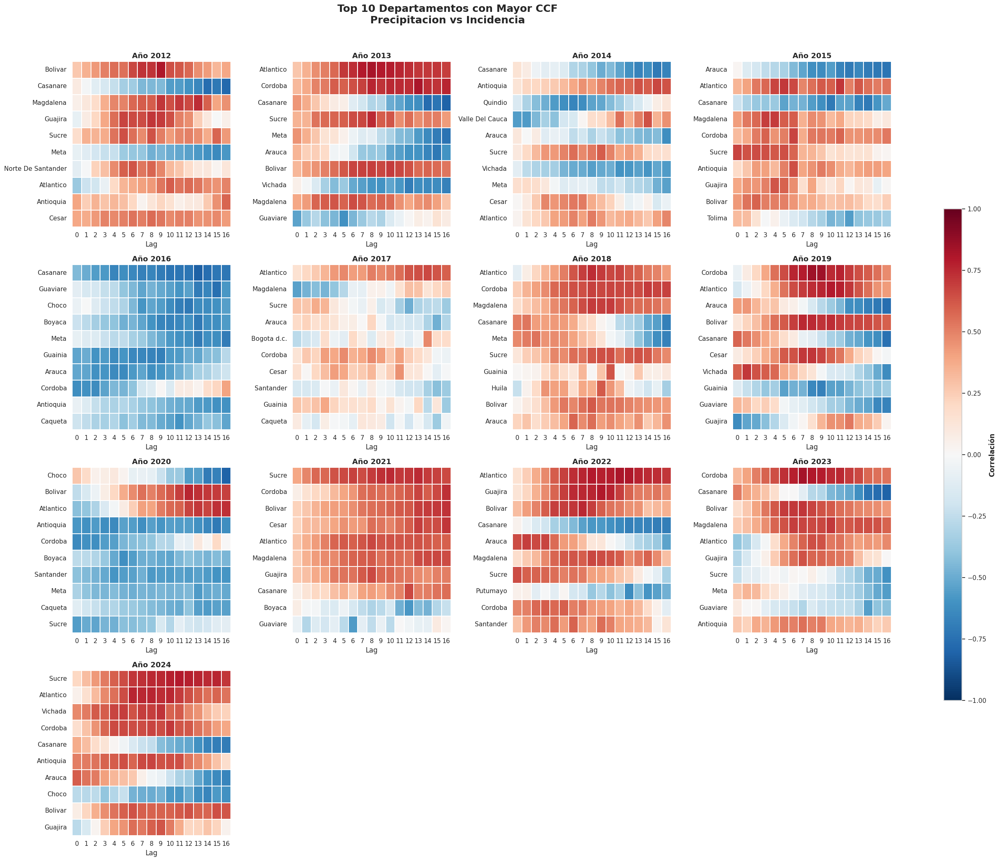

In [69]:
corr_anual_precip=heatmap_ccf_top10_anual(
    df=df,
    variable_climatica="precipitacion",
    max_lag=16,
    top_n=10
)

El conjunto de mapas de calor muestra la evolución temporal y espacial de la correlación cruzada entre la precipitación y la incidencia del dengue en los diez departamentos con mayor asociación para cada año entre 2012 y 2024. Los resultados evidencian una marcada heterogeneidad espacio-temporal, ya que tanto la intensidad como el signo de las correlaciones varían considerablemente entre departamentos y años. En algunos periodos, como 2013, 2015, 2019, 2021 y 2022, predominan correlaciones positivas de moderada a alta magnitud en determinados rezagos, lo que indica que aumentos en la precipitación tienden a asociarse con incrementos posteriores en la incidencia del dengue. Por el contrario, años como 2016 y 2020 presentan correlaciones negativas en varios departamentos y rezagos, sugiriendo relaciones más complejas entre las condiciones de lluvia y la dinámica epidemiológica. La variabilidad observada confirma que el efecto de la precipitación no es uniforme en el territorio nacional y depende de factores locales como las condiciones climáticas, ambientales, ecológicas y socioeconómicas de cada región. En conjunto, estos resultados sugieren que la precipitación constituye una covariable relevante para el modelado del dengue, aunque su influencia presenta diferentes magnitudes y desfases temporales según el contexto geográfico y el periodo analizado.

/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_248539/971066548.py:79: RuntimeWarning: All-NaN axis encountered
  .apply(lambda x: np.nanmax(np.abs(x)))
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packag

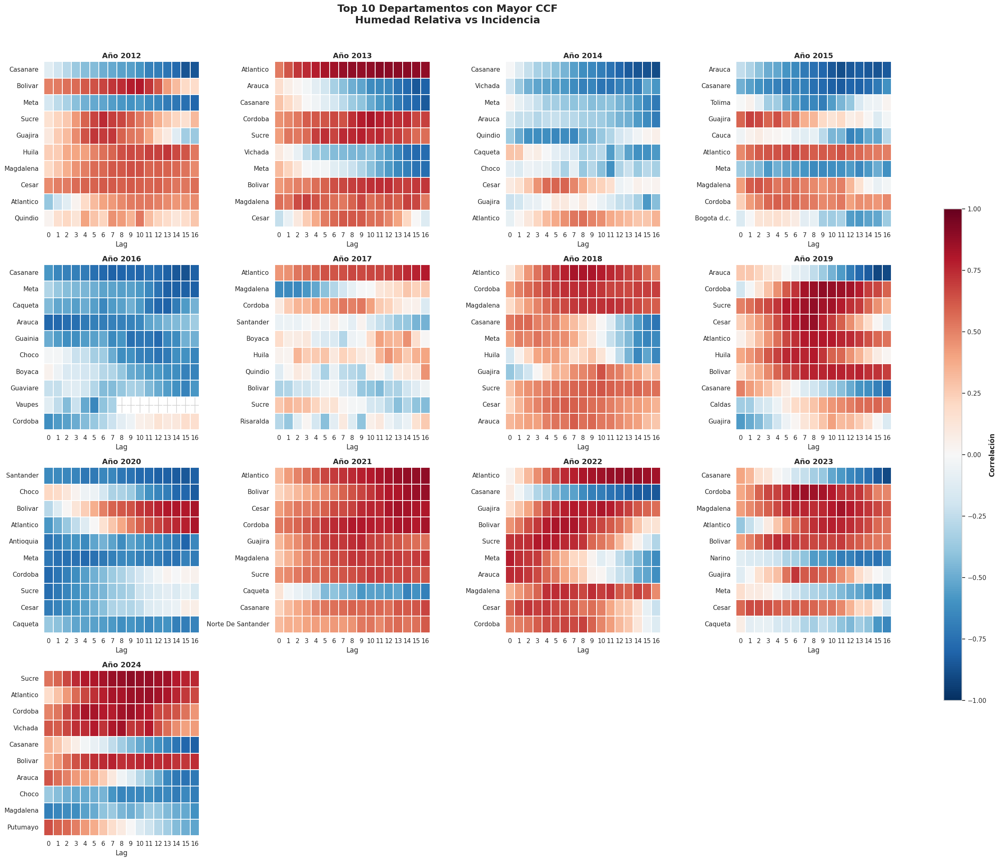

In [70]:
corr_anual_hum = heatmap_ccf_top10_anual(
    df=df,
    variable_climatica="humedad_relativa",
    max_lag=16,
    top_n=10
)

El conjunto de mapas de calor muestra la evolución temporal y espacial de la correlación cruzada entre la humedad relativa y la incidencia del dengue en los diez departamentos con mayor asociación para cada año entre 2012 y 2024. Los resultados evidencian una marcada heterogeneidad espacio-temporal, ya que tanto la magnitud como el signo de las correlaciones varían entre departamentos, años y rezagos. En varios periodos, especialmente durante 2013, 2019, 2021 y 2022, predominan correlaciones positivas de moderada a alta intensidad, lo que indica que mayores niveles de humedad tienden a asociarse con incrementos posteriores o simultáneos en la incidencia del dengue. Por el contrario, en años como 2016 y 2020 se observan correlaciones negativas en algunos departamentos y rezagos, sugiriendo que la relación entre humedad e incidencia puede cambiar según las condiciones ambientales y epidemiológicas particulares de cada región. La diversidad de patrones observados confirma que el efecto de la humedad no es uniforme en el territorio nacional y que su influencia sobre la dinámica de transmisión depende tanto del contexto geográfico como del desfase temporal considerado. En conjunto, estos resultados respaldan la inclusión de la humedad relativa como covariable en modelos predictivos del dengue, ya que contiene información relevante para explicar parte de la variabilidad espacio-temporal de la enfermedad y puede contribuir a mejorar la capacidad predictiva de los modelos epidemiológicos.

/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_248539/971066548.py:79: RuntimeWarning: All-NaN axis encountered
  .apply(lambda x: np.nanmax(np.abs(x)))
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/home/guirlessa/tf_gpu/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/guirlessa/tf_gpu/lib/python3.10/site-packag

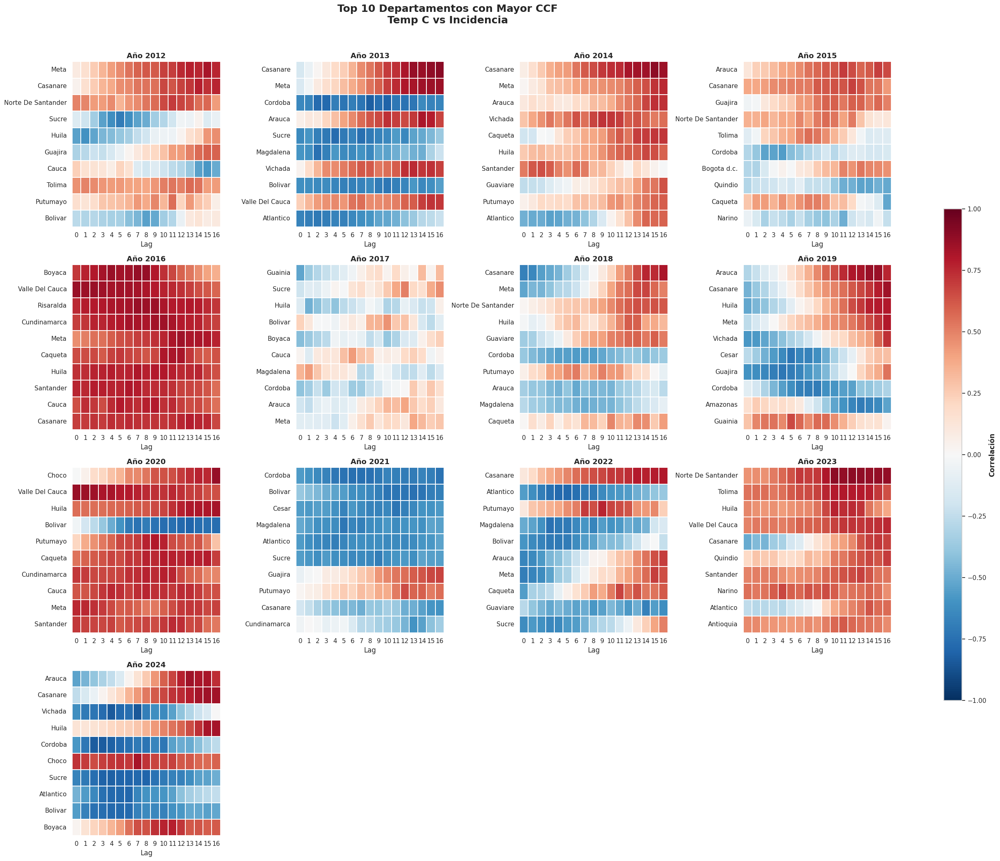

In [71]:
corr_anual_temp =heatmap_ccf_top10_anual(
    df=df,
    variable_climatica="temp_c",
    max_lag=16,
    top_n=10
)

El conjunto de mapas de calor muestra la evolución temporal y espacial de la correlación cruzada entre la temperatura y la incidencia del dengue en los diez departamentos con mayor asociación para cada año entre 2012 y 2024. Los resultados evidencian una marcada heterogeneidad espacio-temporal, ya que tanto la magnitud como el signo de las correlaciones varían entre departamentos, años y rezagos. En varios periodos, particularmente durante 2012, 2014, 2016, 2020 y 2023, predominan correlaciones positivas de moderada a alta intensidad, lo que indica que aumentos en la temperatura tienden a asociarse con incrementos posteriores o simultáneos en la incidencia del dengue. Por el contrario, en años como 2013, 2018 y 2021 se observan correlaciones negativas en determinados departamentos y rezagos, lo que sugiere que la relación entre temperatura e incidencia no es constante y puede variar según las condiciones ambientales y epidemiológicas de cada región. La diversidad de patrones observados confirma que la influencia de la temperatura sobre la dinámica del dengue depende tanto del contexto geográfico como del desfase temporal considerado. En conjunto, estos resultados respaldan la incorporación de variables térmicas en los modelos predictivos, ya que contienen información relevante para explicar parte de la variabilidad espacio-temporal de la enfermedad y podrían contribuir a mejorar la capacidad de predicción cuando se combinan con otras covariables climáticas, ambientales y geográficas.

## **2.11. Análisis Espacio-Temporal Focalizado**

Con el propósito de profundizar en la dinámica espacio-temporal del dengue en Colombia, se realizó una selección de departamentos prioritarios basada en múltiples criterios epidemiológicos y espaciales. La elección consideró la persistencia histórica dentro de los departamentos con mayor incidencia anual, la intensidad de transmisión observada a lo largo de la serie temporal, así como la identificación de clústeres espaciales significativos mediante el análisis LISA. A partir de estos criterios, se seleccionaron los departamentos de **Guaviare, Huila, Amazonas, Valle del Cauca y Norte de Santander**, debido a su relevancia epidemiológica recurrente y a la evidencia de patrones espaciales y temporales diferenciados. Adicionalmente, se priorizaron los años **2019** y **2024**, ya que representan dos escenarios epidémicos contrastantes y epidemiológicamente relevantes dentro de la serie histórica. El año **2019** se caracterizó por una epidemia explosiva y altamente inestable, asociada con máximos niveles de volatilidad temporal, incrementos abruptos de transmisión, alta heterogeneidad semanal y una importante presencia de valores extremos, evidenciando un comportamiento epidémico agudo y de rápida expansión territorial. Por su parte, el año **2024** presentó una epidemia sostenida y estructuralmente distinta, caracterizada por una transmisión persistentemente elevada, mayor incidencia promedio anual y una expansión temporal prolongada, reflejando un escenario de alta intensidad epidemiológica más homogéneo y continuo.

In [72]:
dpto_focalizados = ["Guaviare","Huila","Amazonas","Valle Del Cauca","Norte De Santander"]

### **2.11.1. Análisis Temporal 2019 & 2024**

#### **2.11.1.1. 2019**

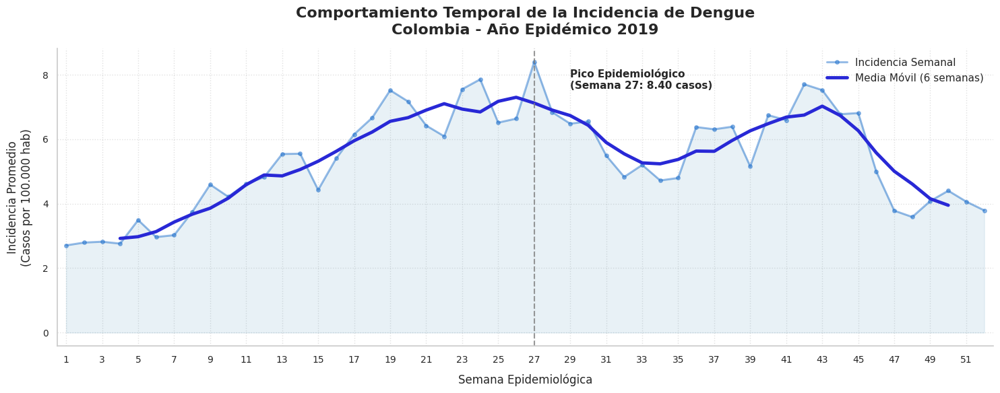

In [73]:
graficar_incidencia_anual(df, anio=2019,ventana =6)

El análisis temporal de la incidencia promedio de dengue durante 2019 evidencia un comportamiento epidémico de gran intensidad y dinamismo, estructurado metodológicamente en tres fases evolutivas. La fase inicial abarca el primer semestre del año y se caracteriza por un incremento progresivo y sostenido de la tasa de contagios por cada 100.000 habitantes a partir de una línea base moderada. Posteriormente, la dinámica de transmisión alcanza su fase crítica a mitad de año, identificándose formalmente el pico epidemiológico en la semana 28 con un registro máximo de aproximadamente 8 casos por cada 100.000 habitantes. Tras este máximo institucional, la curva inicia una fase de remisión y descenso paulatino, la cual se ve interrumpida por un rebote secundario u oscilación tardía hacia el último trimestre del periodo. En conjunto, la persistencia de valores elevados y la fluctuación de la serie reafirman que el año 2019 constituyó un periodo epidémico severo y de alta complejidad sanitaria en el territorio colombiano.

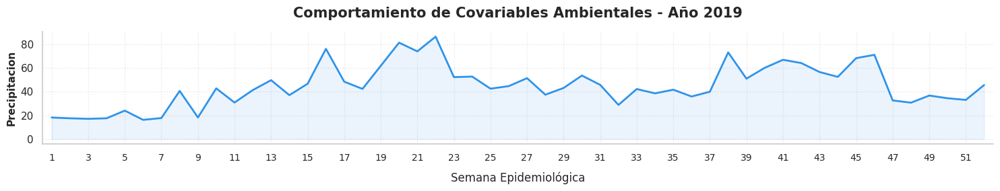

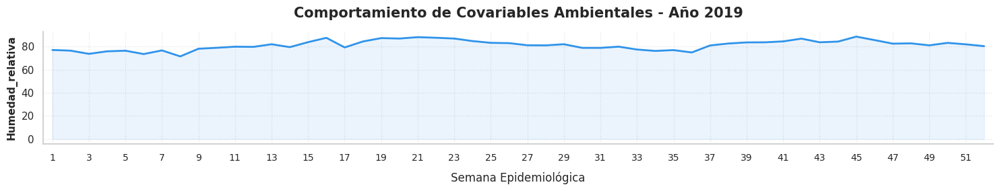

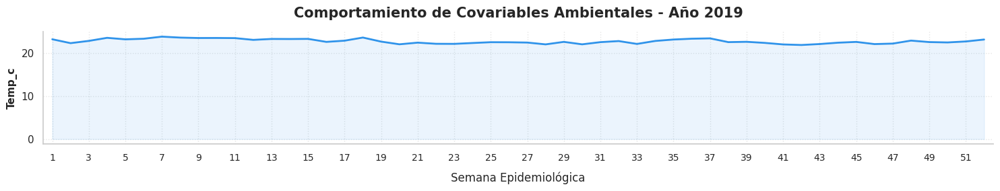

In [74]:
graficar_solo_covariables(df, anio=2019, covariables=["precipitacion"])
graficar_solo_covariables(df, anio=2019, covariables=["humedad_relativa"])
graficar_solo_covariables(df, anio=2019, covariables=["temp_c"])

El análisis conjunto de las variables hidrometeorológicas durante 2019 revela una estrecha correlación con la dinámica de transmisión del dengue, donde la pluviosidad y la humedad relativa exhiben un comportamiento bimodal frente a una notable estabilidad térmica. Por un lado, las precipitaciones presentan dos periodos máximos bien definidos (semanas 14–22 y 38–46) que preceden de manera rezagada a los incrementos de incidencia, lo cual sugiere un efecto retardado en la proliferación de criaderos. Por otro lado, la humedad relativa acompaña esta tendencia con dos ciclos de elevación significativa (superiores al 85% a mitad de año y cercanos al 87% en el último trimestre), optimizando las condiciones para la supervivencia y longevidad de Aedes aegypti. Finalmente, la temperatura se mantiene homogénea y constante en un rango favorable de 21°C a 24°C a lo largo de todo el periodo, actuando como un factor ambiental base que sostiene la viabilidad del vector, de modo que son las fluctuaciones de lluvia y humedad las que modulan los picos y la severidad del brote epidémico observado.

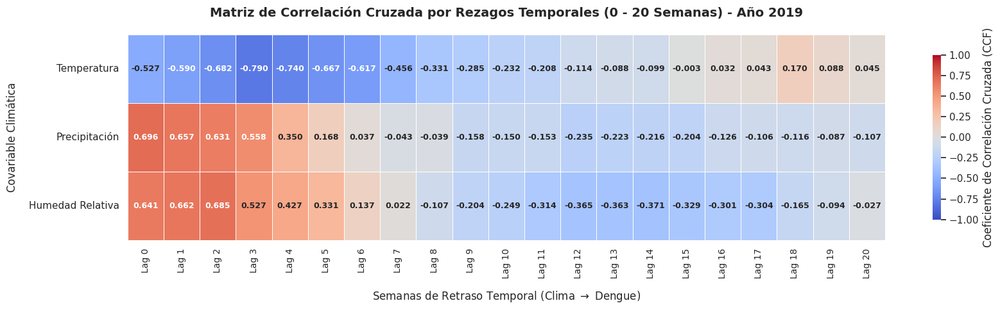

In [75]:
df_res_2019 = graficar_ccf_anual(df, ano_objetivo=2019, max_lag=20)

El análisis de correlación cruzada realizado para el año 2019 evidencia asociaciones temporales relevantes entre las variables climáticas y la incidencia de dengue. La precipitación y la humedad relativa presentan correlaciones positivas moderadas a fuertes durante los primeros rezagos (0–5 semanas), sugiriendo que periodos con mayores niveles de lluvia y humedad tienden a coincidir o preceder incrementos en la incidencia de la enfermedad. En particular, la humedad relativa alcanza su máxima correlación positiva en el rezago de dos semanas (CCF = 0.685), mientras que la precipitación presenta su valor máximo en el rezago cero (CCF = 0.696). Por su parte, la temperatura muestra correlaciones negativas significativas durante los primeros rezagos, alcanzando un valor máximo absoluto de -0.790 en el rezago de tres semanas, lo que indica una asociación inversa entre ambas series durante dicho periodo. En conjunto, estos resultados sugieren que las condiciones climáticas podrían influir en la dinámica temporal del dengue, aunque la magnitud y dirección de estas relaciones varían según la variable analizada y el desfase temporal considerado. Asimismo, dado que las correlaciones fueron calculadas sobre las series originales, parte de estas asociaciones podría estar influenciada por tendencias o patrones estacionales compartidos, por lo que los resultados deben interpretarse como evidencia exploratoria y complementarse con análisis más robustos para evaluar relaciones causales.

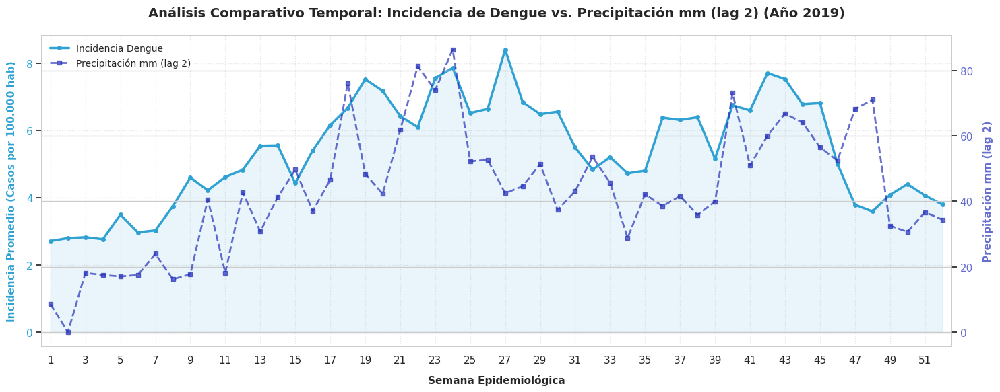

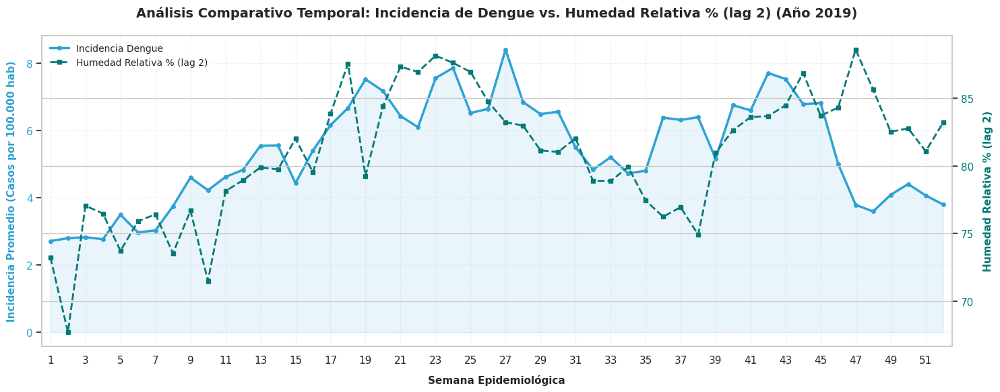

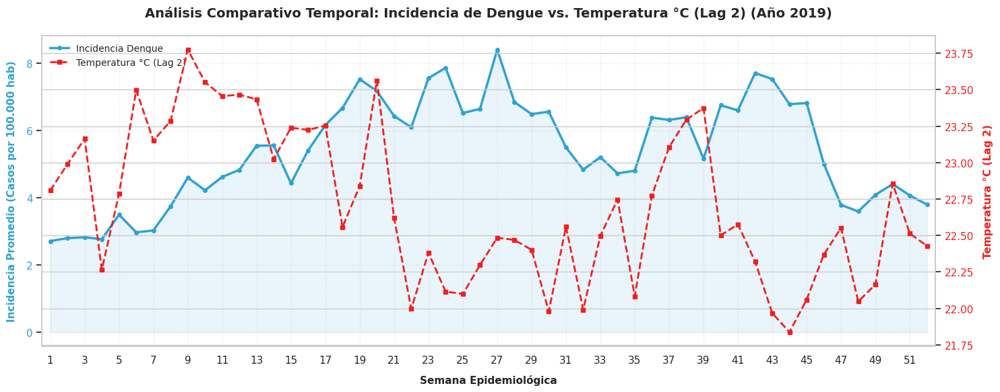

In [76]:
graficar_incidencia_y_covariable(
    df=df,
    ano_objetivo=2019,
    variable_climatica="precip_lag_2",
    label_clima="Precipitación mm (lag 2)",
    color_clima="#2531bab3"
)

graficar_incidencia_y_covariable(
    df=df, 
    ano_objetivo=2019, 
    variable_climatica="humedad_lag_2", 
    label_clima="Humedad Relativa % (lag 2)", 
    color_clima="#047977" 
)

graficar_incidencia_y_covariable(
    df=df, 
    ano_objetivo=2019, 
    variable_climatica="temp_lag_2", 
    label_clima="Temperatura °C (Lag 2)", 
    color_clima="#F41E1E" 
)

Durante 2019, las variables climáticas mostraron una asociación clara con la incidencia del dengue en Colombia. La precipitación y la humedad relativa presentaron patrones positivos consistentes, donde los aumentos de lluvia y humedad tendieron a coincidir o preceder incrementos en los casos reportados, especialmente durante los periodos epidémicos más intensos del año. Por su parte, la temperatura exhibió una relación menos evidente, aunque los mayores niveles de incidencia se concentraron cuando esta se mantuvo dentro de un rango relativamente estable. En conjunto, los resultados sugieren que las condiciones de alta precipitación, elevada humedad y temperaturas favorables contribuyeron a generar un entorno propicio para la proliferación del vector y la transmisión del dengue, destacando la importancia de incorporar variables climáticas en los modelos de vigilancia y predicción epidemiológica.


#### **2.11.1.2. 2024**

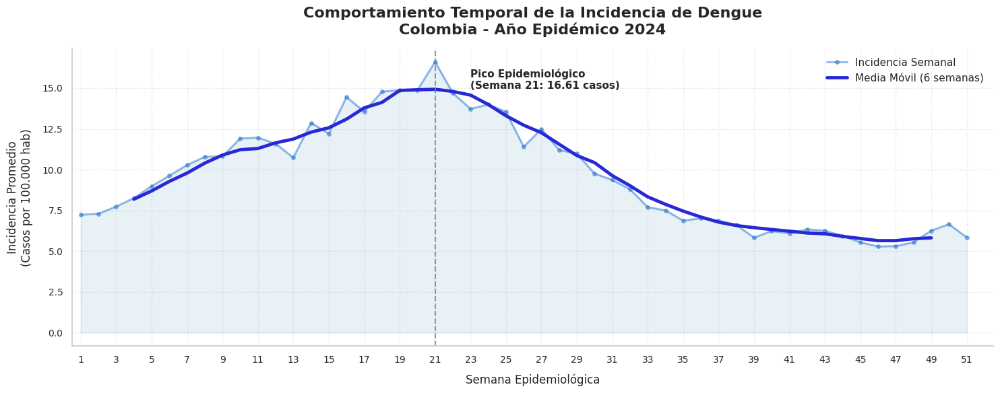

In [77]:
graficar_incidencia_anual(df, anio=2024,ventana =6)

La serie temporal semanal de la incidencia promedio de dengue durante 2024 evidencia un comportamiento epidémico sostenido y de alta intensidad a lo largo de gran parte del año. Desde las primeras semanas epidemiológicas se observan niveles elevados de transmisión, iniciando con una incidencia de 7.43 casos por 100.000 habitantes y presentando un ascenso continuo durante el primer semestre. La incidencia supera rápidamente los 10 casos por 100.000 habitantes hacia la semana 7 y continúa incrementándose hasta alcanzar el pico epidemiológico máximo en la semana 21, con aproximadamente 16 casos por 100.000 habitantes. Posteriormente, la serie entra en una fase de descenso gradual, aunque manteniendo niveles de transmisión considerablemente altos durante varias semanas consecutivas. A diferencia del comportamiento explosivo observado en 2019, la dinámica de 2024 refleja una epidemia más homogénea y persistente, caracterizada por una elevada transmisión sostenida en el tiempo y una reducción progresiva sin caídas abruptas. Finalmente, hacia el último trimestre del año, la incidencia entra en una fase de estabilización relativa, oscilando entre valores moderados pero aún superiores a los registrados históricamente en años no epidémicos.

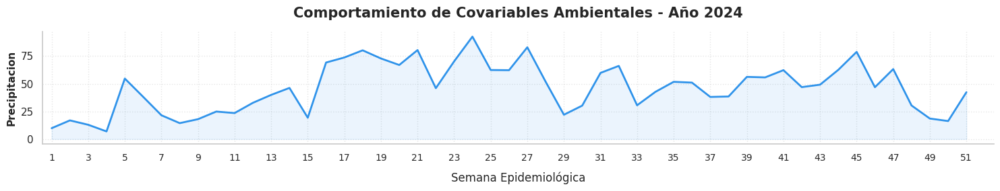

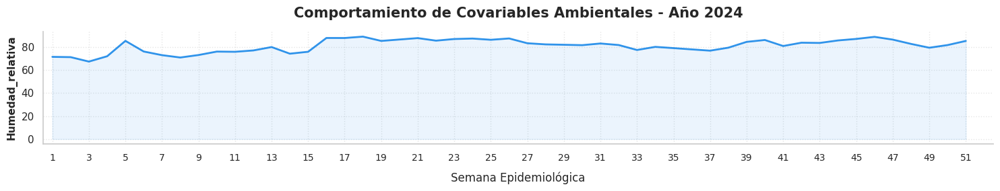

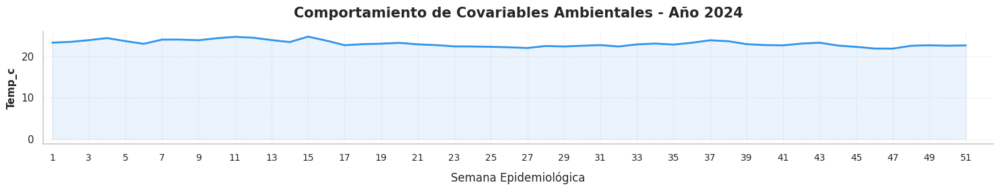

In [78]:
graficar_solo_covariables(df, anio=2024, covariables=["precipitacion"])
graficar_solo_covariables(df, anio=2024, covariables=["humedad_relativa"])
graficar_solo_covariables(df, anio=2024, covariables=["temp_c"])

El análisis conjunto de las variables hidrometeorológicas durante 2024 revela una estrecha sinergia con la dinámica de transmisión del dengue, donde la pluviosidad y la humedad relativa actuaron como moduladores críticos frente a una notable estabilidad térmica basal. Por un lado, las precipitaciones exhibieron un comportamiento bimodal e intensificado, consolidando un primer periodo lluvioso crítico entre las semanas 16 y 27 (con máximos superiores a 85 mm) que coincidió temporalmente con el pico epidémico nacional, seguido de un segundo ciclo húmedo recurrente entre las semanas 31 y 45. Por otro lado, la humedad relativa acompañó esta dinámica con niveles persistentemente elevados, sosteniéndose en una meseta de entre el 82% y el 88% durante gran parte del año, lo cual optimizó de forma continua las condiciones de supervivencia y longevidad del vector Aedes aegypti. Finalmente, la temperatura promedio operó como un sustrato ambiental homogéneo y constante, manteniéndose en un rango favorable de 21°C a 24°C sin fluctuaciones extremas; esto confirma que mientras la temperatura garantizó la viabilidad biológica permanente del mosquito, fueron los prolongados e intensificados ciclos de lluvia y saturación de humedad los que propiciaron la proliferación masiva de criaderos y sostuvieron la alta intensidad de la epidemia durante 2024.

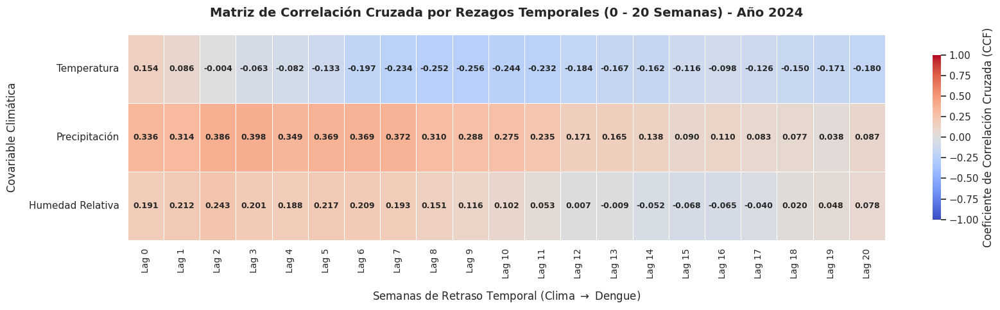

In [79]:
df_res_2024 = graficar_ccf_anual(df, ano_objetivo=2024, max_lag=20)

Los resultados de 2024 muestran que la precipitación fue la variable climática más asociada con la incidencia del dengue, presentando correlaciones positivas moderadas entre los rezagos de 2 y 7 semanas, mientras que la humedad relativa exhibió asociaciones positivas más débiles y la temperatura correlaciones negativas de baja magnitud. Estos patrones sugieren que durante el brote de 2024 los factores relacionados con la disponibilidad y persistencia de agua tuvieron una influencia mayor sobre la transmisión que las variaciones térmicas. No obstante, dado que las correlaciones observadas fueron relativamente bajas, los resultados indican que el clima por sí solo no explica completamente la dinámica epidemiológica del dengue, respaldando la necesidad de incorporar variables climáticas, ambientales y espaciales dentro de modelos espacio-temporales capaces de capturar la complejidad y heterogeneidad del fenómeno.


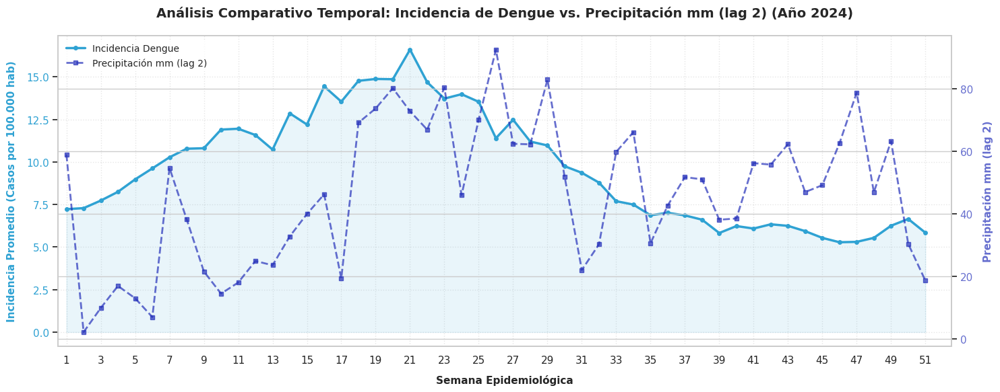

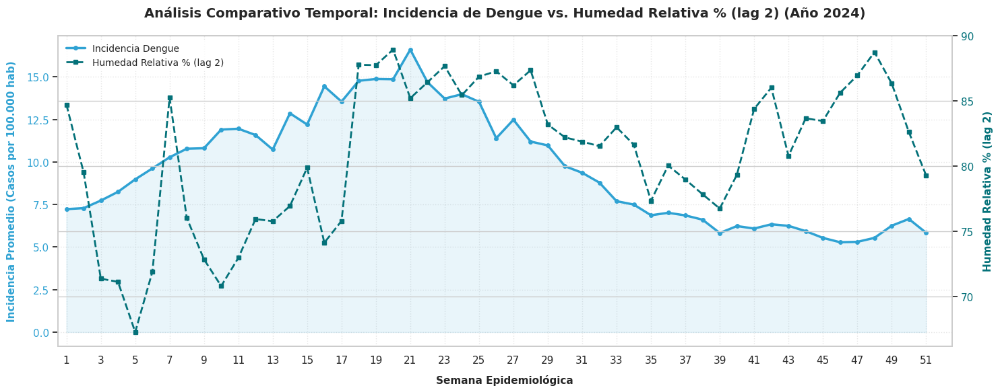

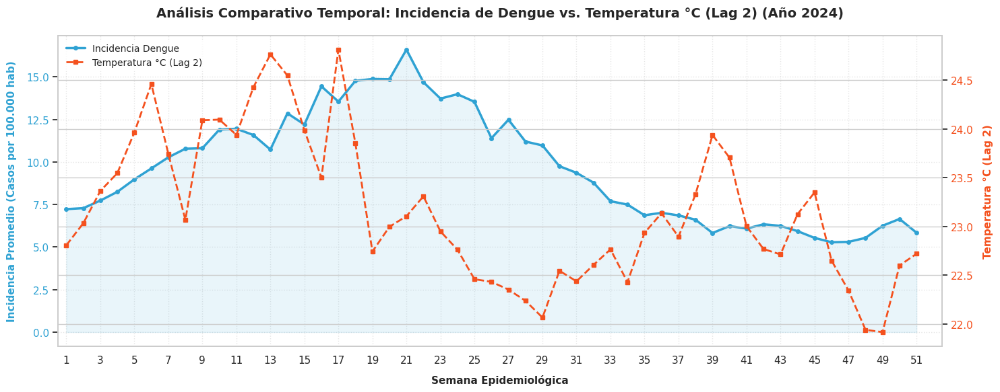

In [81]:
graficar_incidencia_y_covariable(
    df=df, 
    ano_objetivo=2024, 
    variable_climatica="precip_lag_2", 
    label_clima="Precipitación mm (lag 2)", 
    color_clima="#2531bab3" 
)
graficar_incidencia_y_covariable(
    df=df, 
    ano_objetivo=2024, 
    variable_climatica="humedad_lag_2", 
    label_clima="Humedad Relativa % (lag 2)", 
    color_clima="#047179" 
)
graficar_incidencia_y_covariable(
    df=df, 
    ano_objetivo=2024, 
    variable_climatica="temp_lag_2", 
    label_clima="Temperatura °C (Lag 2)", 
    color_clima="#F4511E" 
)

Durante 2024, las variables climáticas mostraron una asociación moderada con la incidencia del dengue en Colombia. La precipitación y la humedad relativa presentaron patrones positivos consistentes, donde los periodos de mayores lluvias y humedad tendieron a coincidir o preceder incrementos en los casos reportados, particularmente durante el primer semestre del año, cuando se registró el pico epidémico más importante. Por su parte, la temperatura exhibió una relación menos marcada, manteniéndose relativamente estable dentro de un rango favorable para la transmisión del virus. En conjunto, estos resultados sugieren que las condiciones hidrometeorológicas asociadas a la disponibilidad de agua y ambientes húmedos desempeñaron un papel relevante en la dinámica del brote de 2024, aunque su capacidad explicativa fue moderada, lo que indica que otros factores epidemiológicos, ambientales y espaciales también contribuyeron al comportamiento observado de la enfermedad.

### **2.11.2. Análisis Espacial 2019 & 2024**

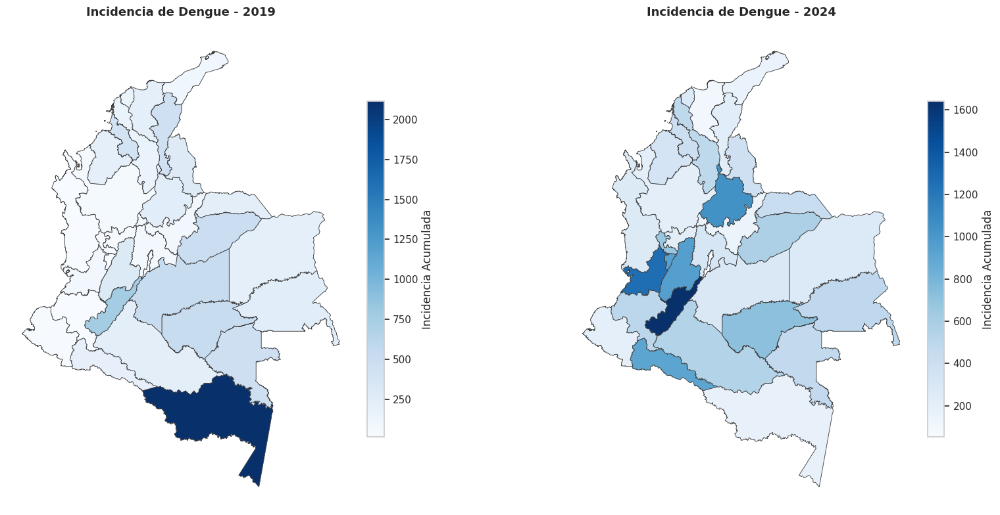

In [82]:
ruta_del_mapa = "/home/guirlessa/Proyecto_Dengue/Covariables/MGN_ADM_DPTO_POLITICO/MGN_ADM_DPTO_POLITICO_limpio.shp"


fig, axes = plt.subplots(1, 2, figsize=(18, 8))

generar_mapa_incidencia(
    df_datos=df,
    mapa_shp_path=ruta_del_mapa,
    ano_objetivo=2019,
    col_departamento_df="departamento",
    col_departamento_shp="dpto_cnmbr",
    ax=axes[0]
)

generar_mapa_incidencia(
    df_datos=df,
    mapa_shp_path=ruta_del_mapa,
    ano_objetivo=2024,
    col_departamento_df="departamento",
    col_departamento_shp="dpto_cnmbr",
    ax=axes[1]
)

plt.tight_layout()
plt.show()

El contraste entre los mapas de 2019 y 2024 muestra un cambio notable en la distribución espacial de la incidencia del dengue en Colombia. En 2019, la mayor carga de la enfermedad se concentró en el sur del país, especialmente en departamentos amazónicos como Amazonas y Putumayo, donde la incidencia acumulada superó los 2000 casos por 100 000 habitantes. Las regiones del centro y norte presentaron valores relativamente bajos, lo que sugiere una dinámica más localizada y posiblemente asociada con condiciones ambientales específicas de la selva húmeda tropical.  

Para 2024, la situación se diversificó; la incidencia se desplazó hacia el centro y occidente del país, con departamentos como Tolima, Valle del Cauca y Meta mostrando intensidades más altas (entre 1000 y 1600 casos por 100 000 habitantes). Este cambio indica una expansión del riesgo hacia zonas más pobladas y urbanizadas, donde las condiciones climáticas y socioambientales favorecen la transmisión. En conjunto, el contraste evidencia una transición de focos epidémicos predominantemente selváticos en 2019 hacia una distribución más amplia y heterogénea en 2024, reflejando la influencia de factores climáticos, demográficos y de movilidad en la dinámica del dengue.

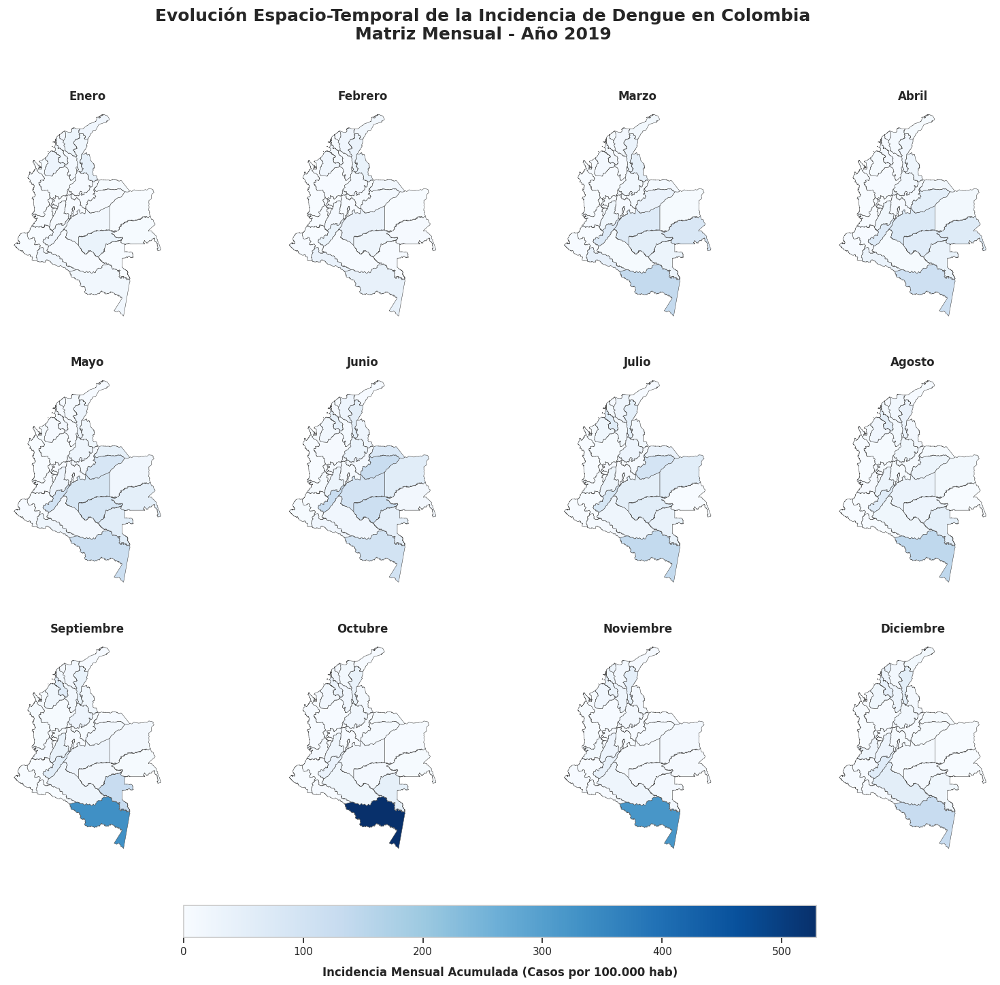

In [83]:
generar_matriz_mapas_mensuales(df,ruta_del_mapa,2019,col_departamento_df="departamento", col_departamento_shp="dpto_cnmbr")

El conjunto de mapas evidencia una marcada evolución espacio-temoral del dengue durante 2019. Durante el primer semestre (enero–julio), la incidencia se mantuvo relativamente baja y distribuida de manera dispersa en la mayoría de los departamentos. Sin embargo, a partir de agosto se observa una intensificación progresiva de la transmisión, concentrándose principalmente en la región sur del país, especialmente en departamentos amazónicos. El máximo epidémico se alcanzó entre octubre y noviembre, cuando algunos territorios superaron los 500 casos por cada 100 000 habitantes, para posteriormente mostrar una disminución gradual hacia el cierre del año. Este patrón confirma una fuerte estacionalidad en la transmisión del dengue durante 2019, caracterizada por una expansión geográfica gradual y una concentración espacial de los casos en regiones específicas. Además, la focalización territorial observada coincide con los análisis espaciales previos, que identificaron a departamentos como Amazonas y Putumayo entre los principales focos epidémicos del periodo.


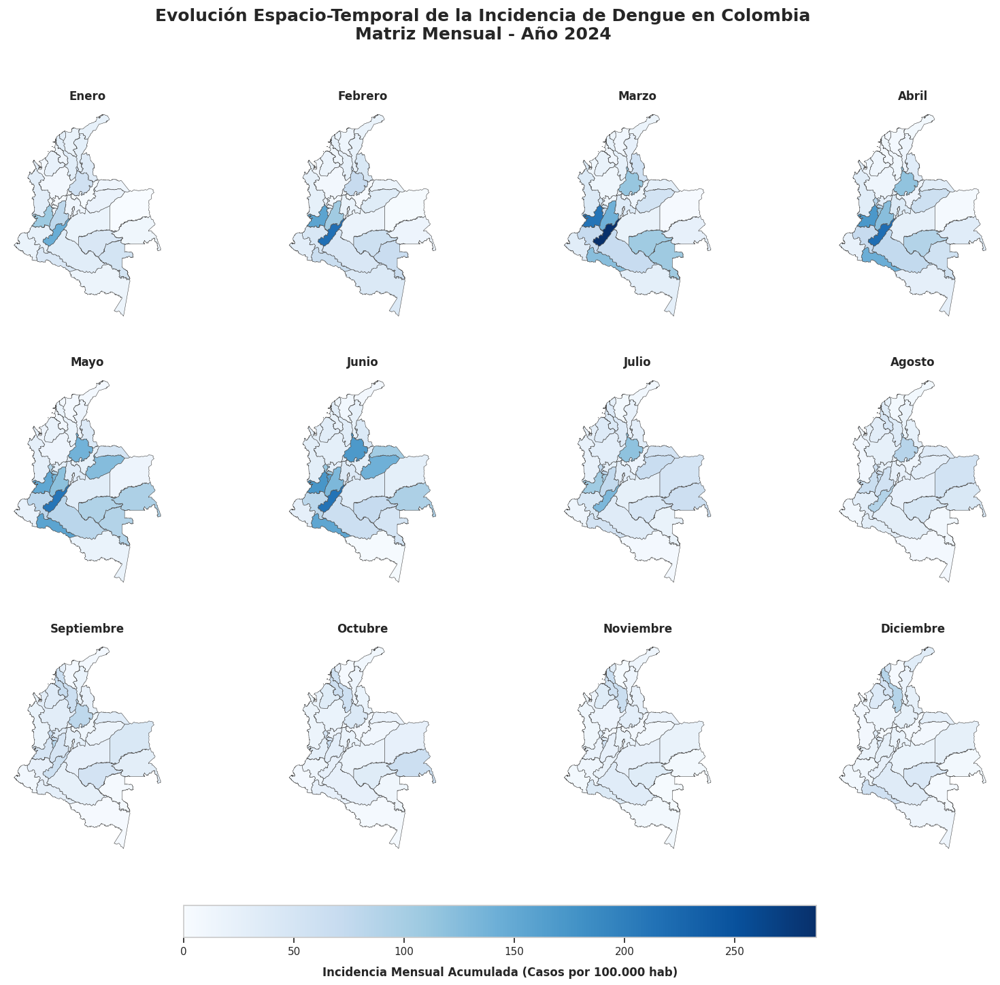

In [84]:
generar_matriz_mapas_mensuales(df,ruta_del_mapa,2024,col_departamento_df="departamento", col_departamento_shp="dpto_cnmbr")

El conjunto de mapas correspondientes a 2024 evidencia una dinámica espacio-temporal del dengue más intensa, temprana y prolongada que la observada en años anteriores. Desde los primeros meses del año ya se identifican niveles elevados de incidencia en departamentos del centro del país, particularmente en Tolima, Valle del Cauca, Meta y Huila, indicando un inicio temprano del brote epidémico. Durante el primer semestre la transmisión se mantuvo alta y se expandió hacia departamentos vecinos, configurando una amplia zona de riesgo en las regiones interandinas y del centro-occidente colombiano. Aunque a partir de agosto se observa una disminución gradual de la incidencia, varios focos persistieron hasta finales del año, reflejando una transmisión sostenida durante un periodo considerablemente más largo. En contraste con el patrón más focalizado observado en 2019, la epidemia de 2024 presentó una distribución geográfica más amplia y homogénea, afectando territorios más poblados y urbanizados. Estos resultados sugieren que el brote estuvo favorecido por la combinación de condiciones climáticas propicias y factores demográficos que facilitaron la expansión y persistencia de la transmisión, consolidando a 2024 como el periodo epidémico más severo de toda la serie analizada.


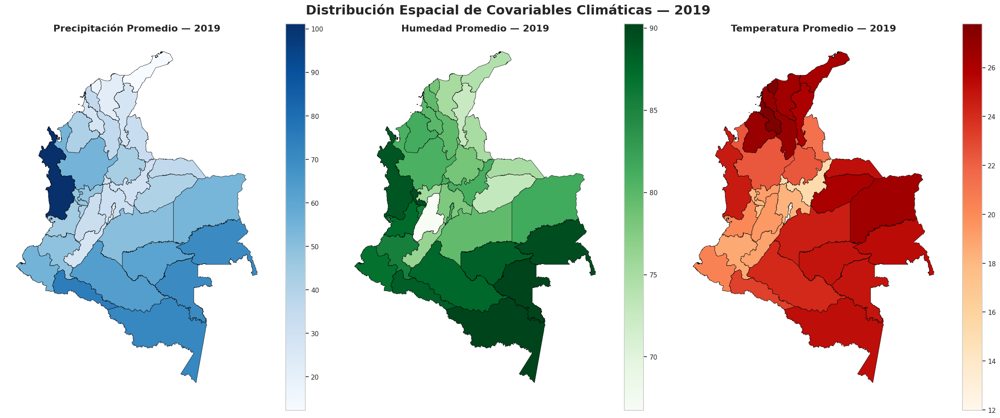

In [85]:
mapas_covariables(
    df=df,
    year=2019,
    shapefile_path=ruta_del_mapa
)

El mapa de distribución espacial de covariables climáticas para 2019 evidencia que los departamentos analizados presentan contextos ecológicos y ambientales claramente diferenciados, los cuales condicionan la dinámica de transmisión del dengue. Amazonas y Guaviare muestran un macroclima caracterizado por altas temperaturas, elevada humedad relativa y fuerte pluviosidad, creando condiciones persistentemente favorables para la supervivencia del vector y explicando por qué los brotes pueden mantenerse o emerger a partir de rezagos climáticos prolongados. En contraste, Huila y Tolima presentan condiciones intermedias de humedad y precipitación dentro de los valles interandinos, donde pequeñas variaciones climáticas generan respuestas epidemiológicas más sensibles y sincronizadas, coherentes con las fuertes correlaciones observadas en los análisis de rezagos temporales. Por su parte, Norte de Santander exhibe un ambiente más seco y cálido, con menor disponibilidad hídrica estructural, lo que limita la persistencia sostenida de brotes epidémicos y favorece patrones de transmisión más inestables o decrecientes.


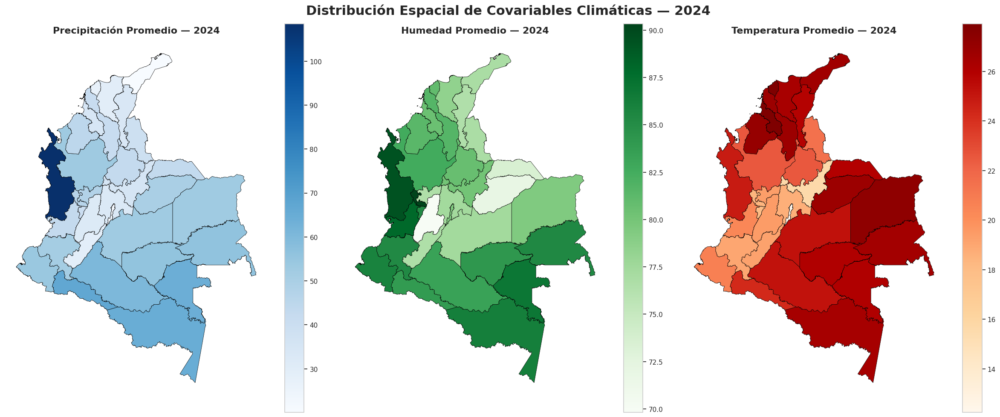

In [86]:
mapas_covariables(
    df=df,
    year=2024,
    shapefile_path=ruta_del_mapa
)

El análisis espacial de las covariables climáticas durante 2024 evidencia una marcada heterogeneidad ambiental en el territorio colombiano. La precipitación promedio presenta sus valores más elevados en la región Pacífica y sectores del occidente del país, especialmente en Chocó y zonas aledañas, mientras que el centro y el oriente registran menores acumulados de lluvia. De manera similar, la humedad relativa alcanza sus máximos valores en el occidente y sur del territorio, reflejando condiciones atmosféricas favorables para la persistencia de ambientes húmedos. Por su parte, la temperatura promedio muestra un patrón inverso, con valores más altos en los departamentos de la Amazonía y la Orinoquía, como Amazonas, Meta y Guaviare, y temperaturas más bajas en la región Andina debido al efecto de la altitud.


### **2.11.3. Análisis Espacial Focalizado a Departamentos**

Ahora procederemos a analizar la dinámica espacio-temporal de la incidencia del dengue en los departamentos que han mostrado una mayor concentración y persistencia de transmisión, identificados previamente como los principales focos epidemiológicos del país.

In [87]:
df['departamento'].unique()

array(['Amazonas', 'Antioquia', 'Arauca', 'Atlantico', 'Bogota d.c.',
       'Bolivar', 'Boyaca', 'Caldas', 'Caqueta', 'Casanare', 'Cauca',
       'Cesar', 'Choco', 'Cordoba', 'Cundinamarca', 'Guainia', 'Guajira',
       'Guaviare', 'Huila', 'Magdalena', 'Meta', 'Narino',
       'Norte De Santander', 'Putumayo', 'Quindio', 'Risaralda',
       'Santander', 'Sucre', 'Tolima', 'Valle Del Cauca', 'Vaupes',
       'Vichada'], dtype=object)

In [88]:
dpto_focalizados

['Guaviare', 'Huila', 'Amazonas', 'Valle Del Cauca', 'Norte De Santander']

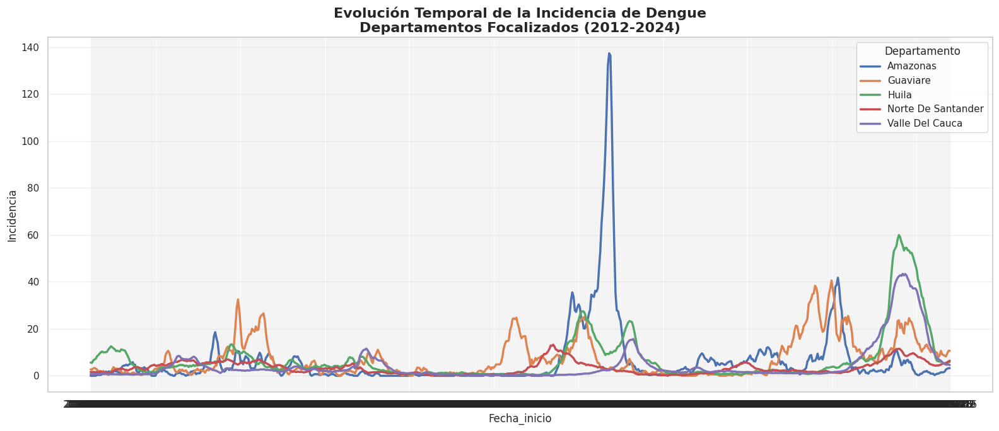

In [89]:
# Filtrar departamentos
df_plot = df[df['departamento'].isin(dpto_focalizados)].copy()

# Gráfico
plt.figure(figsize=(16, 7))

df_plot = df_plot.sort_values(['departamento', 'fecha_inicio'])

df_plot['incidencia_mm4'] = (
    df_plot.groupby('departamento')['incidencia']
    .transform(lambda x: x.rolling(4, min_periods=1).mean())
)

sns.lineplot(
    data=df_plot,
    x='fecha_inicio',
    y='incidencia_mm4',
    hue='departamento',
    linewidth=2.5
)

plt.title(
    'Evolución Temporal de la Incidencia de Dengue\nDepartamentos Focalizados (2012-2024)',
    fontsize=16,
    fontweight='bold'
)
plt.xlabel('Fecha_inicio')
plt.ylabel('Incidencia')
plt.legend(title='Departamento')
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

El gráfico muestra la evolución semanal de la incidencia de dengue entre 2012 y 2024 en cinco departamentos colombianos con alta transmisión. Se observa una marcada variabilidad temporal, con picos epidémicos bien definidos en ciertos años. Amazonas presenta el brote más intenso, alcanzando una incidencia cercana a 140, mientras que Guaviare, Huila, Norte de Santander y Valle del Cauca muestran aumentos más moderados pero recurrentes. Estos patrones reflejan la naturaleza cíclica del dengue, con periodos de baja transmisión seguidos de incrementos abruptos asociados a condiciones climáticas y dinámicas vectoriales locales.

In [90]:
serie = (
    df.groupby(
        ["fecha_inicio", "departamento"],
        observed=False
    )
    .agg(
        incidencia=("incidencia", "mean"),
        precipitacion=("precipitacion", "mean"),
        humedad=("humedad_relativa", "mean"),
        temperatura=("temp_c", "mean")
    )
    .reset_index()
)


=== VERIFICACIÓN DE DATOS ===
Guaviare: 677 registros
Huila: 677 registros
Amazonas: 677 registros
Valle Del Cauca: 677 registros
Norte De Santander: 677 registros


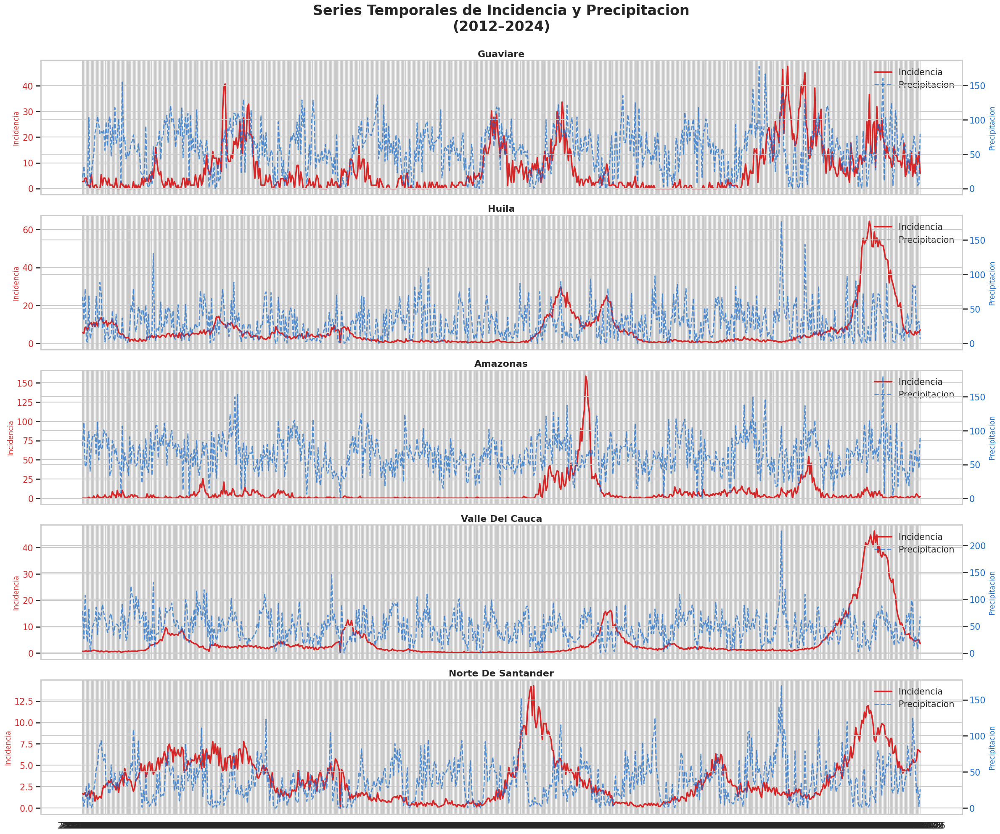

In [91]:
plot_series_covariable(
    serie=serie,
    departamentos=dpto_focalizados,
    covariable="precipitacion"
)

El gráfico muestra la relación temporal entre la incidencia de dengue y la precipitación en cinco departamentos colombianos entre 2012 y 2024. En general, se observa que los picos de incidencia (líneas rojas) tienden a seguir periodos de alta precipitación (líneas azules), lo que sugiere una posible influencia de las lluvias en la proliferación del vector. Amazonas y Huila presentan brotes más marcados, con incrementos abruptos tras fases lluviosas, mientras que Guaviare y Valle del Cauca muestran patrones más recurrentes y sostenidos. Norte de Santander evidencia una sincronía clara entre ambas variables, reforzando la relación climática en la dinámica del dengue.


=== VERIFICACIÓN DE DATOS ===
Guaviare: 677 registros
Huila: 677 registros
Amazonas: 677 registros
Valle Del Cauca: 677 registros
Norte De Santander: 677 registros


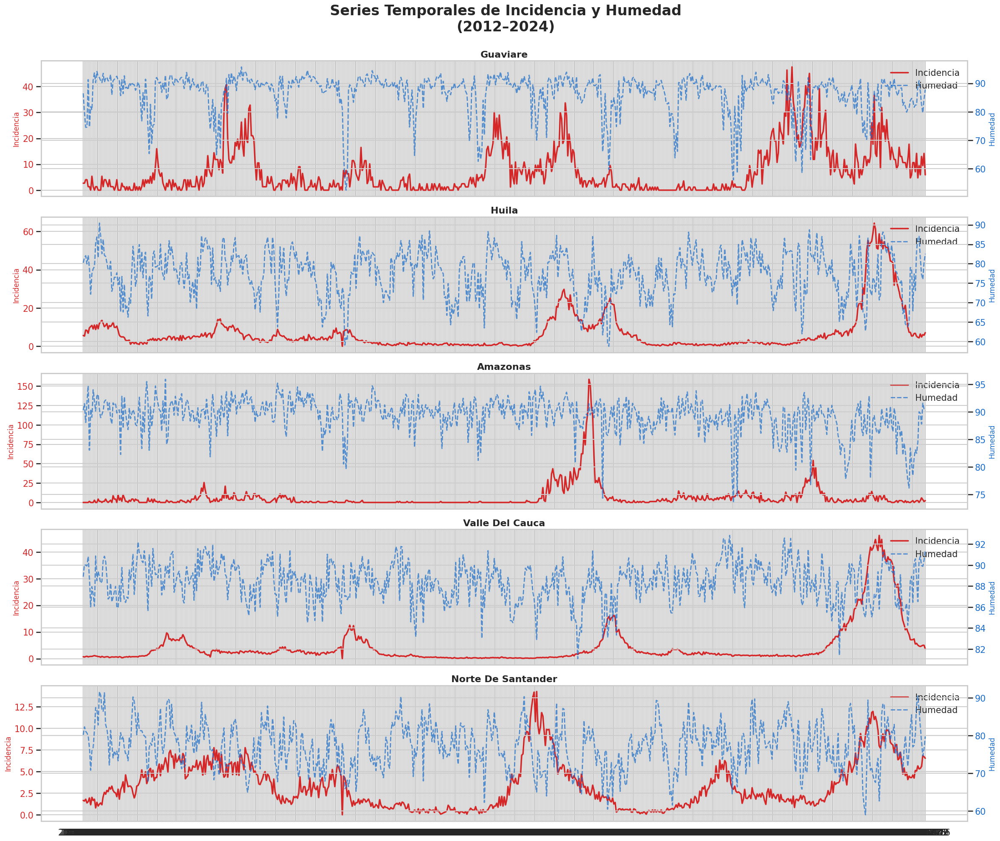

In [92]:
plot_series_covariable(
    serie=serie,
    departamentos=dpto_focalizados,
    covariable='humedad'
)

El gráfico presenta la evolución conjunta de la incidencia del dengue y la humedad relativa entre 2012 y 2024 en cinco departamentos colombianos. En general, se observa que los picos de incidencia (líneas rojas) tienden a coincidir o seguir periodos de alta humedad (líneas azules), lo que sugiere una relación favorable entre condiciones húmedas y la transmisión del virus. Amazonas y Huila muestran brotes más pronunciados tras fases de humedad sostenida, mientras que Guaviare y Valle del Cauca exhiben fluctuaciones recurrentes con menor amplitud. Norte de Santander refleja una sincronía clara entre ambas variables, indicando que la persistencia de altos niveles de humedad podría facilitar la supervivencia y reproducción del vector *Aedes aegypti*, potenciando los episodios epidémicos.


=== VERIFICACIÓN DE DATOS ===
Guaviare: 677 registros
Huila: 677 registros
Amazonas: 677 registros
Valle Del Cauca: 677 registros
Norte De Santander: 677 registros


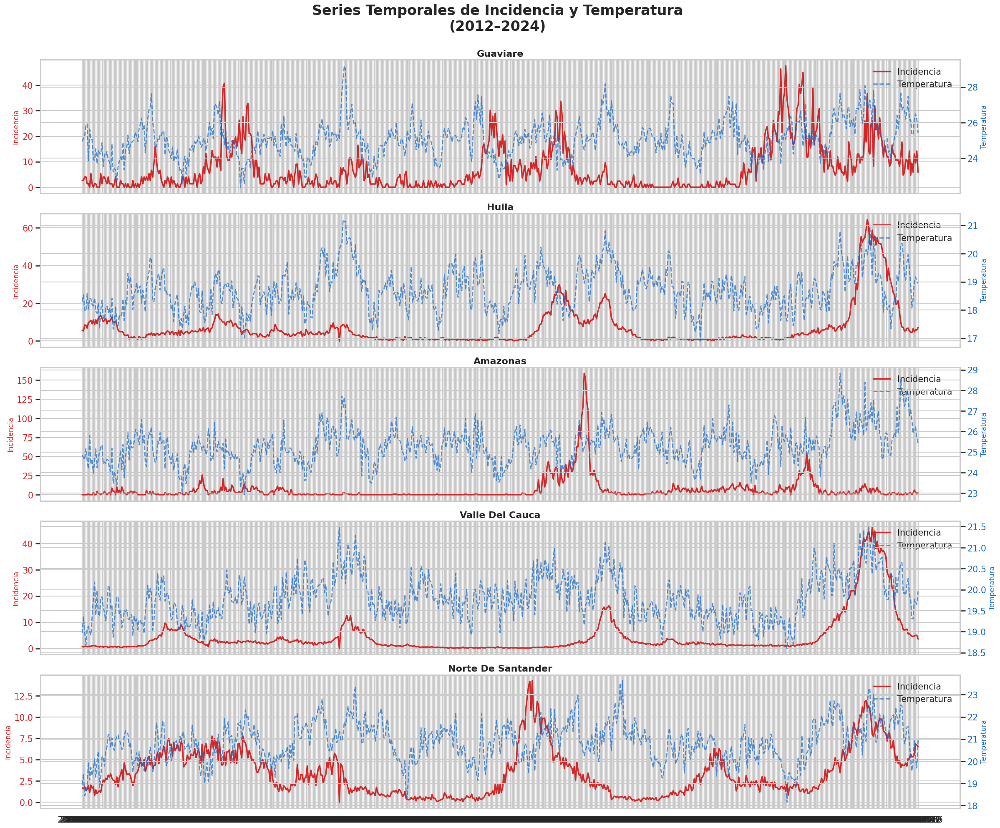

In [93]:
plot_series_covariable(
    serie=serie,
    departamentos=dpto_focalizados,
    covariable='temperatura'
)

El gráfico muestra la evolución temporal de la incidencia del dengue y la temperatura entre 2012 y 2024 en cinco departamentos colombianos. En general, se observa que los picos de incidencia (líneas rojas) tienden a coincidir con periodos de temperaturas más altas (líneas azules), lo que sugiere una relación positiva entre el aumento térmico y la transmisión del virus. Amazonas y Huila presentan brotes más intensos tras fases cálidas sostenidas, mientras que Guaviare y Valle del Cauca muestran fluctuaciones más regulares. En Norte de Santander, la sincronía entre ambas variables es clara, indicando que las condiciones térmicas favorables podrían potenciar la actividad del mosquito *Aedes aegypti* y, por tanto, los episodios epidémicos.